In [1]:
import pandas as pd
!pip install dataframe-image
import dataframe_image as dfi

import matplotlib.pyplot as plt
import matplotlib.dates as md

import datetime as dt
import calendar
import sqlite3 as db
import os 

Defaulting to user installation because normal site-packages is not writeable
--- Logging error ---
Traceback (most recent call last):
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_internal/utils/logging.py", line 177, in emit
    self.console.print(renderable, overflow="ignore", crop=False, style=style)
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_vendor/rich/console.py", line 1752, in print
    extend(render(renderable, render_options))
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_vendor/rich/console.py", line 1390, in render
    for render_output in iter_render:
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_internal/utils/logging.py", line 134, in __rich_console__
    for line in lines:
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_vendor/rich/segment.py", line 245, in split_lines
    for segment in segments:
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_vendor/rich/console.py", line 1368, in render
    

In [2]:
# Connect to database and load the data in a pandas Dataframe
con = db.connect('database/eWater.db')
data = pd.read_sql_query('select * from ewaterdata', con)

In [3]:
# Drop the duplicated rows (probably the fault in my preprocessing at the beginning)
data.drop_duplicates(inplace=True)


In [4]:
tail = data.tail()
tail

,WaterSystemId,AssetId,EWC_ID,ErrorEventCode,ErrorEventDescripton,Date,Hours,Timestamp,CardId,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Operation,Liters(l),Flow(l/m),FlowTime(s),RawPacket,DateOfCreation
70129,7,13,1580746423,9,No card error (not detected by sensor/ no RF),31/07/22,19:02:06,1659290526,0BC147D2,12.832031,2164,82808.0,82537.0,Getting water,0.383333,0.000000,3.0,445E3846B7090602193107220BC147D2DB000874000143...,Sun Jul 31 20:05:01 2022
70130,7,18,318971485,9,No card error (not detected by sensor/ no RF),01/08/22,06:59:09,1659333549,0B6452D2,12.656250,723,114487.0,99540.0,Getting water,21.133333,31.700000,40.0,4413031E5D090959060108220B6452D2D80002D30001BF...,Mon Aug 1 08:02:36 2022
70131,7,19,1573484499,9,No card error (not detected by sensor/ no RF),31/07/22,19:39:47,1659292787,EB7A50D2,12.656250,9130,85079.0,85036.0,Getting water,0.061111,0.000000,2.0,445DC977D309473919310722EB7A50D2D80023AA00014C...,Sun Jul 31 20:40:35 2022
70132,7,24,1573484508,9,No card error (not detected by sensor/ no RF),01/08/22,19:56:34,1659380194,3CA54F73,13.300781,4863,68727.0,67033.0,Getting water,2.394444,17.958333,8.0,445DC977DC093456190108223CA54F73E30012FF00010C...,Mon Aug 1 20:56:42 2022
70133,7,7,1580746437,9,No card error (not detected by sensor/ no RF),31/07/22,18:35:40,1659288940,1B224ED2,12.949219,11030,136643.0,136604.0,Getting water,0.055556,0.000000,3.0,445E3846C5094035183107221B224ED2DD002B16000215...,Sun Jul 31 19:36:47 2022


In [5]:
# Print the column headers and their number
print(len(data.columns))
print(data.columns)

19
Index(['WaterSystemId', 'AssetId', 'EWC_ID', 'ErrorEventCode',
       'ErrorEventDescripton', 'Date', 'Hours', 'Timestamp', 'CardId',
       'BatteryVoltage(V)', 'UsageCounter', 'StartCreditValue',
       'EndCreditValue', 'Operation', 'Liters(l)', 'Flow(l/m)', 'FlowTime(s)',
       'RawPacket', 'DateOfCreation'],
      dtype='object')


In [6]:
# Display the number of sensors Ignore 664 (water height)
print(len(data['AssetId'].unique()))
data['AssetId'].unique()

29


array([ 15,  18,   5,   8, 664,  17,  11,  27,  14,  13,  24,  22,  16,
        21,   9,   4,  28,  19,  20,   3,  10,   7,  26, 144,  12,  23,
        29,   6,  30])

In [7]:
# Transform a human readable date into a timestamp
import time
#import datetime
from datetime import datetime
def transformDateSecond(date, hour):
    try : 
        return time.mktime(time.strptime('{} {}'.format(date, hour), '%d/%m/%y %H:%M:%S'))
    except:
        print (data[(data['Hours']=="01/01/15")])
        data.drop(data[(data['Date'] == date) & (data['Hours']==hour)].index)
        
#transformDateSecond("19/07/22", "19:49:12")

In [10]:
# Transform a timestamp into a human readable date
def UnixTimestampToHumanReadable(timestamp):
    datetime_object = dt.datetime.fromtimestamp(int(timestamp))
    return datetime_object.strftime("%d/%m/%y")

In [11]:
# Drop the rows where the date is from 2015
def dropInvalidRow(df):
    patternDel = "^.*/15$"
    boolean = df[~df['Date'].str.contains(patternDel)]
    return boolean

noWeirdDate = dropInvalidRow(data)
noWeirdDate = noWeirdDate[noWeirdDate['AssetId'] != 30]

In [12]:
noWeirdDate["AssetId"].unique()

array([ 15,  18,   5,   8, 664,  17,  11,  27,  14,  13,  24,  22,  16,
        21,   9,   4,  28,  19,  20,   3,  10,   7,  26, 144,  12,  23,
        29,   6])

In [13]:
(len(data) - len(noWeirdDate))*100/len(data)

0.05876933828901808

In [14]:
plt.rc('font', size=15)# Set the axes title font size
plt.rc('axes', titlesize=15)# Set the axes labels font size
plt.rc('axes', labelsize=15)# Set the font size for x tick labels
plt.rc('xtick', labelsize=15)# Set the font size for y tick labels
plt.rc('ytick', labelsize=15)# Set the legend font size
plt.rc('legend', fontsize=15)# Set the font size of the figure title
plt.rc('figure', titlesize=15)

<ipython-input-15-541563a5df10>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


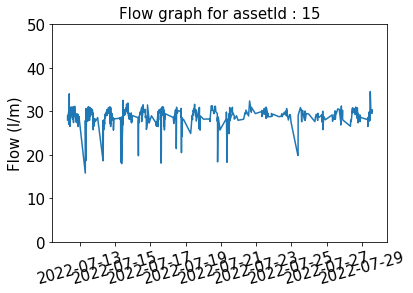

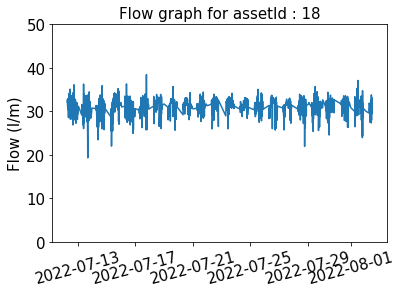

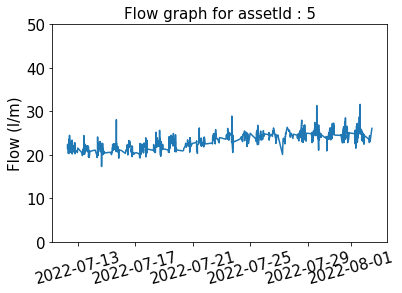

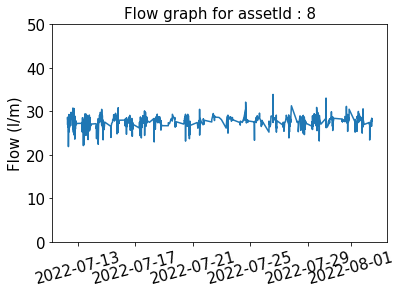

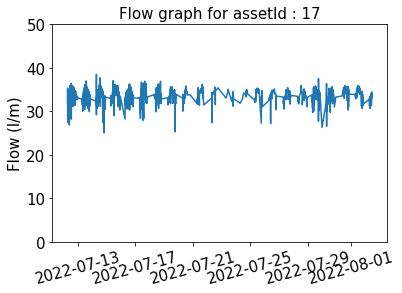

...

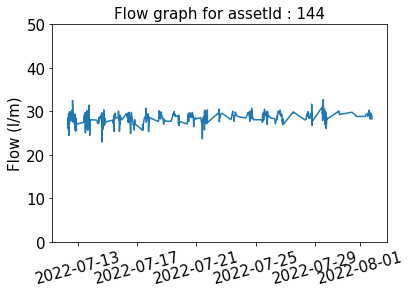

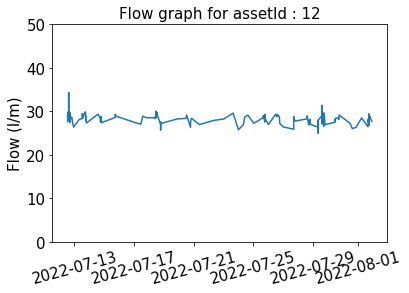

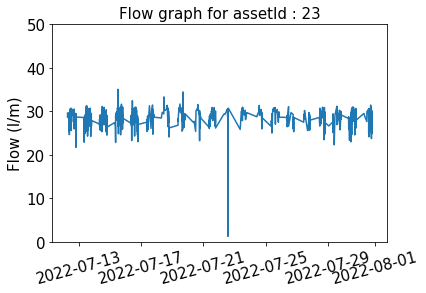

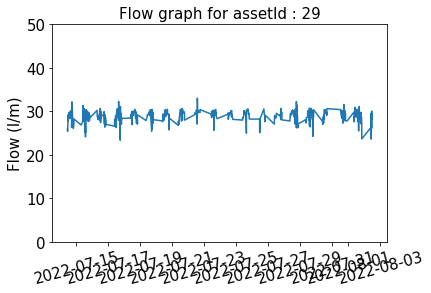

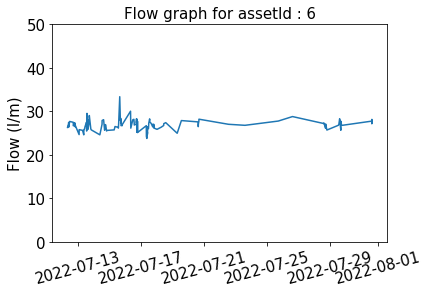

In [15]:
def graphFlow_save(df,PATH):
    if not os.path.isdir(PATH):
        os.mkdir(PATH)
        
    
    uniqueAsset = list(df['AssetId'].unique())
    uniqueAsset.remove(664)
    for i,assetID in enumerate(uniqueAsset):
        df_temp = df[(df["AssetId"]==assetID) & (df["Flow(l/m)"] != 0) & (df["ErrorEventCode"] == 9) ][["Timestamp", "Flow(l/m)"]]

        if not df_temp.empty :
            df_temp = df_temp.sort_values(by='Timestamp')
            fig = plt.figure()

            dates=[dt.datetime.fromtimestamp(ts) for ts in list(df_temp['Timestamp'])]
            #plt.plot(df_temp['Timestamp'], df_temp['Flow(l/m)'])
            plt.plot(dates, df_temp['Flow(l/m)'])
            plt.title("Flow graph for assetId : {}".format(assetID))
            #plt.xlabel("Timestamp (m)")
            plt.ylabel("Flow (l/m)")
            
            # gca (Get the Current Axis) to set the y limit
            ax = plt.gca()
            ax.set_ylim([0, 50])
            
            xfmt = md.DateFormatter('%Y-%m-%d')
            ax.xaxis.set_major_formatter(xfmt)
            plt.xticks( rotation=15 )
            
            plt.savefig(PATH+"flow{}".format(assetID),bbox_inches="tight")
            

    
    #plt.show()
    
    

graphFlow_save(noWeirdDate,"FlowGraphs/")

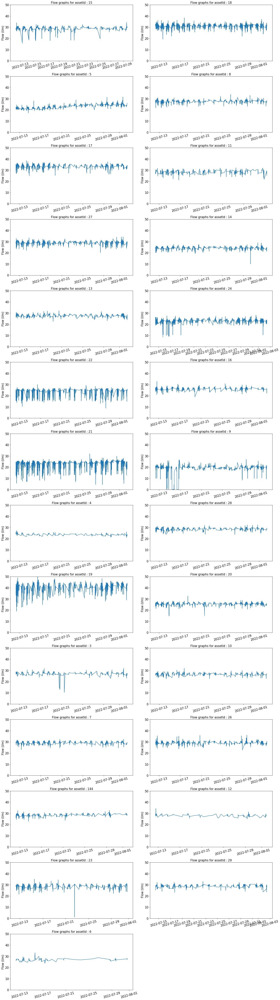

In [16]:
# Print graphs of the flow for each AssetId 

def graphFlow(df):
    fig = plt.figure(figsize=(20,100))
    fig.tight_layout()
    uniqueAsset = list(df['AssetId'].unique())
    uniqueAsset.remove(664)
    for i,assetID in enumerate(uniqueAsset):
        df_temp = df[(df["AssetId"]==assetID) & (df["Flow(l/m)"] != 0) & (df["ErrorEventCode"] == 9) ][["Timestamp", "Flow(l/m)"]]

        if not df_temp.empty :
            df_temp = df_temp.sort_values(by='Timestamp')
            
            ax1 =  fig.add_subplot(20,2,i+1)
            dates=[dt.datetime.fromtimestamp(ts) for ts in list(df_temp['Timestamp'])]
            #plt.plot(df_temp['Timestamp'], df_temp['Flow(l/m)'])
            plt.plot(dates, df_temp['Flow(l/m)'])
            plt.title("Flow graphs for assetId : {}".format(assetID))
            #plt.xlabel("Timestamp (m)")
            plt.ylabel("Flow (l/m)")
            
            # gca (Get the Current Axis) to set the y limit
            ax = plt.gca()
            ax.set_ylim([0, 50])
            
            xfmt = md.DateFormatter('%Y-%m-%d')
            ax.xaxis.set_major_formatter(xfmt)
            plt.xticks( rotation=15 )
            
            #extent = ax1.get_window_extent().transformed(fig.dpi_scale_trans.inverted())

            # Pad the saved area by 10% in the x-direction and 20% in the y-direction
            #fig.savefig("Flow{}".format(assetID), bbox_inches=extent.expanded(1.2, 1.5))
        
            

    # set the spacing between subplots
    fig.tight_layout()
    
    plt.show()
    
    

graphFlow(noWeirdDate)

<ipython-input-18-5db9e186dee3>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


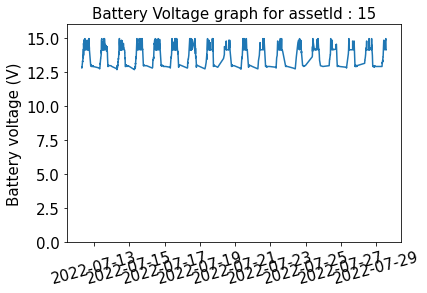

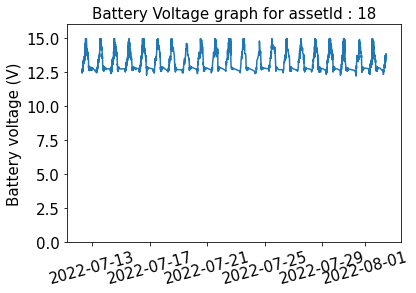

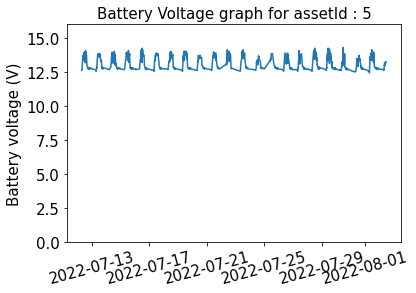

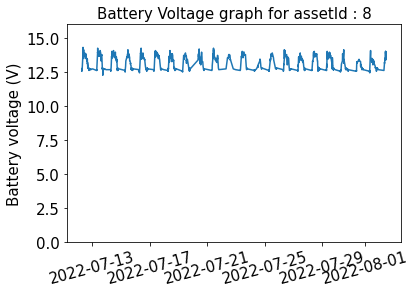

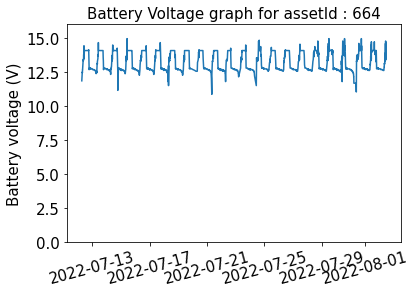

...

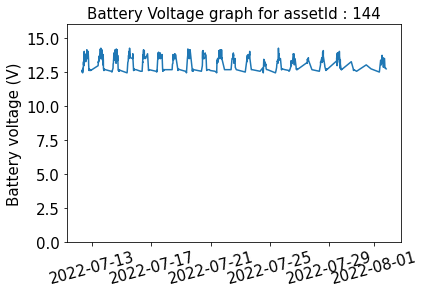

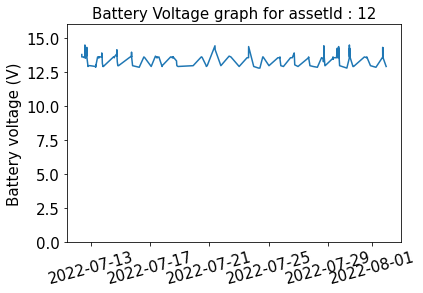

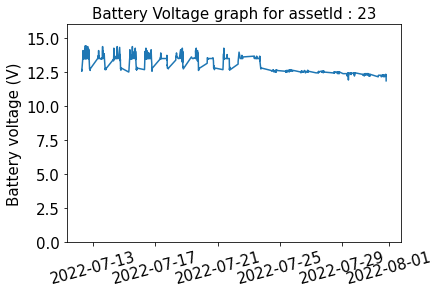

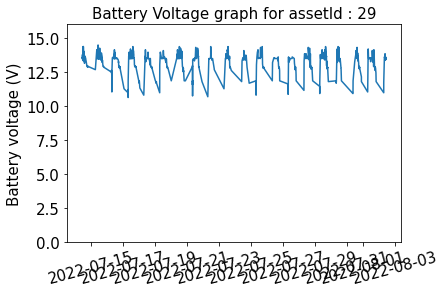

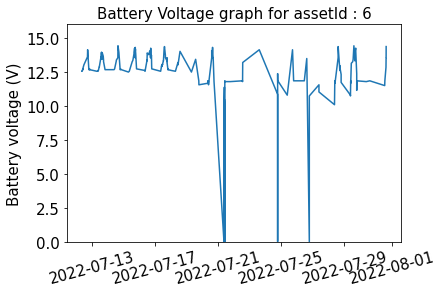

In [18]:
# Print graphs of the battery voltage for each AssetId 

def graphVoltage_save(df,PATH):
    if not os.path.isdir(PATH):
        os.mkdir(PATH)

    for i,assetID in enumerate(df['AssetId'].unique()):
        df_temp = df[df["AssetId"]==assetID][["Timestamp", "BatteryVoltage(V)"]]
        if not df_temp.empty :
            df_temp = df_temp.sort_values(by='Timestamp')
            
            
            fig = plt.figure()
            dates=[dt.datetime.fromtimestamp(ts) for ts in list(df_temp['Timestamp'])]
            plt.plot(dates, df_temp['BatteryVoltage(V)'])
            plt.title("Battery Voltage graph for assetId : {}".format(assetID))
            #plt.xlabel("Timestamp (s)")
            plt.ylabel("Battery voltage (V)")
            
            # gca (Get the Current Axis) to set the y limit
            ax = plt.gca()
            ax.set_ylim([0, 16])
            
            xfmt = md.DateFormatter('%Y-%m-%d')
            ax.xaxis.set_major_formatter(xfmt)
            plt.xticks( rotation=15 )
            
            plt.savefig(PATH+"battery{}".format(assetID),bbox_inches='tight')  # write image to file
            #plt.cla()
            #plt.show()
    

graphVoltage_save(noWeirdDate,"batteryGraphs/")

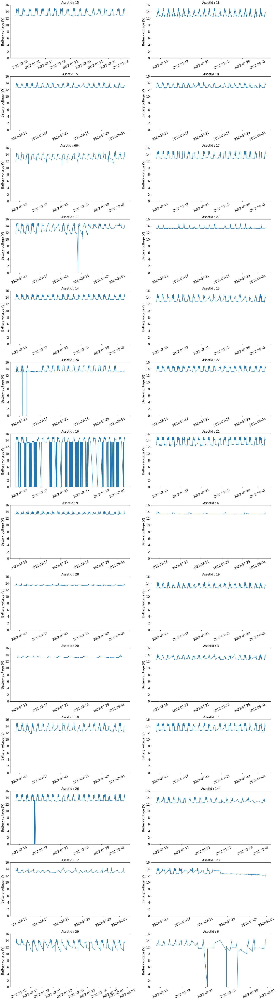

In [19]:
# Print graphs of the battery voltage for each AssetId 
def graphVoltage(df):
        
    fig = plt.figure(figsize=(20,100))
    for i,assetID in enumerate(df['AssetId'].unique()):
        df_temp = df[df["AssetId"]==assetID][["Timestamp", "BatteryVoltage(V)"]]
        if not df_temp.empty :
            df_temp = df_temp.sort_values(by='Timestamp')
    
            ax1 =  fig.add_subplot(20,2,i+1)
            dates=[dt.datetime.fromtimestamp(ts) for ts in list(df_temp['Timestamp'])]
            plt.plot(dates, df_temp['BatteryVoltage(V)'])
            plt.title("AssetId : {}".format(assetID))
            #plt.xlabel("Timestamp (s)")
            plt.ylabel("Battery voltage (V)")

            
            # gca (Get the Current Axis) to set the y limit
            ax = plt.gca()
            ax.set_ylim([0, 16])
            
            xfmt = md.DateFormatter('%Y-%m-%d')
            ax.xaxis.set_major_formatter(xfmt)
            plt.xticks( rotation=25 )
            
            
            #plt.savefig(PATH+"battery{}".format(assetID))  # write image to file
            #plt.cla()
            #plt.show()
    

    # set the spacing between subplots
    fig.tight_layout()
    
    
    plt.show()

graphVoltage(noWeirdDate)

In [20]:
# Display a pandas dataframe with the number of operations for each card ID
# Would be interesting to add the time parameter (what is the tendency on a week or a month)
def typeOperationByCard(df):
    nbTypeOperationPerCard = pd.DataFrame(columns = ['Card id', 'Getting water', 'Top up', 'Other'])
    for i,cardID in enumerate(df['CardId'].unique()):
        df_temp = df[df["CardId"]==cardID][["CardId", "Operation"]]

        # This is a pandas series not a pandas dataframe
        values_count = df_temp['Operation'].value_counts()
        card = pd.Series([cardID], index = ["Card id"])
        to_add = pd.concat([values_count,card])
        #print(to_add)

        nbTypeOperationPerCard.loc[len(nbTypeOperationPerCard)] = to_add
        #print(nbTypeOperationPerCard)
    return nbTypeOperationPerCard

    
typeOperationByCard(noWeirdDate)

,Card id,Getting water,Top up,Other
0,3B4D4CD2,136,NaN,82
1,CB484FD2,62,NaN,3
2,E45C5CA5,427,NaN,64
3,AB8451D2,54,NaN,23
4,BB0D4FD2,50,NaN,11
...,...,...,...,...
680,FB784BD2,8,NaN,1
681,9B9D4DD2,10,NaN,1
682,7BC147D2,4,NaN,NaN
683,AB824FD2,7,NaN,NaN


In [22]:
# Display how many liters a card ID took in total
def litersPerCard(df):
    df_liters= pd.DataFrame(columns=["CardId", "Liters(l)"])
    for i,cardID in enumerate(df['CardId'].unique()):
        df_temp = df[df["CardId"]==cardID][["CardId", "Liters(l)"]]
        df_liters.loc[len(df_liters)] = [cardID, df_temp['Liters(l)'].sum()]
    return df_liters
litersPerCard(noWeirdDate)

,CardId,Liters(l)
0,3B4D4CD2,784.300000
1,CB484FD2,1019.186111
2,E45C5CA5,4568.763889
3,AB8451D2,889.161111
4,BB0D4FD2,790.672222
...,...,...
680,FB784BD2,49.375000
681,9B9D4DD2,169.375000
682,7BC147D2,137.266667
683,AB824FD2,52.536111


In [23]:
# Find the day of the week from a date in the format %d/%m/%y
def findDay(date):
    born = dt.datetime.strptime(date, '%d/%m/%y').weekday()
    return (calendar.day_name[born])

In [24]:
# Returns a dict with all the dates for each week of the day (you can extract the number of each day)
def nbWeekday(df):
    count = {"Monday": set(), 'Tuesday': set(), "Wednesday":set(), "Thursday":set(), "Friday":set(), "Saturday":set(), "Sunday":set()}
    for i in range(len(df)):
        weekday = findDay(df['Date'].iloc[i])
        if df['Date'].iloc[i] not in count[weekday]:
            count[weekday].add(df['Date'].iloc[i])
    return count

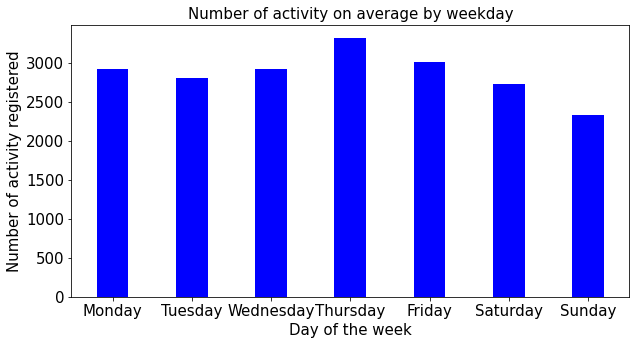

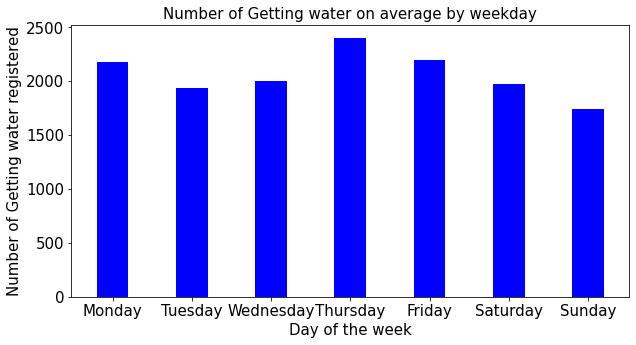

In [25]:
# Display a bar chart representing the total number of a certain type of interactions (someone tries to use their badge wether it's for recharching or getting water or an error) each

def barChartInteraction(df,save,PATH,typeOperation="activity"):
    labels = {"Monday": 0, 'Tuesday':0, "Wednesday":0, "Thursday":0, "Friday":0, "Saturday":0, "Sunday":0}
    count = {"Monday": set(), 'Tuesday': set(), "Wednesday":set(), "Thursday":set(), "Friday":set(), "Saturday":set(), "Sunday":set()}

    if typeOperation != "activity" :
        df = df[df["Operation"]=="{}".format(typeOperation)]
    for i in range(len(df)):
        weekday = findDay(df['Date'].iloc[i])
        labels[weekday] +=1
        if df['Date'].iloc[i] not in count[weekday]:
            count[weekday].add(df['Date'].iloc[i])

    weekday = []
    values = []
    for k in labels :
        weekday.append(k)
        values.append(labels[k]/len(count[k]))
        

    fig = plt.figure(figsize = (10, 5))

    # creating the bar plot
    plt.bar(weekday, values, color ='blue',width = 0.4)

    plt.xlabel("Day of the week")
    plt.ylabel("Number of {} registered".format(typeOperation))
    plt.title("Number of {} on average by weekday".format(typeOperation))
    
    if save:
        if not os.path.exists(PATH):
            os.mkdir(PATH)
        plt.savefig(PATH+"{}".format(typeOperation),bbox_inches="tight")
    
    plt.show()

barChartInteraction(noWeirdDate, False, "graphs/")
barChartInteraction(noWeirdDate, True,"graphs/", "Getting water")
#barChartInteraction(noWeirdDate, "Other")
#print(len(df))


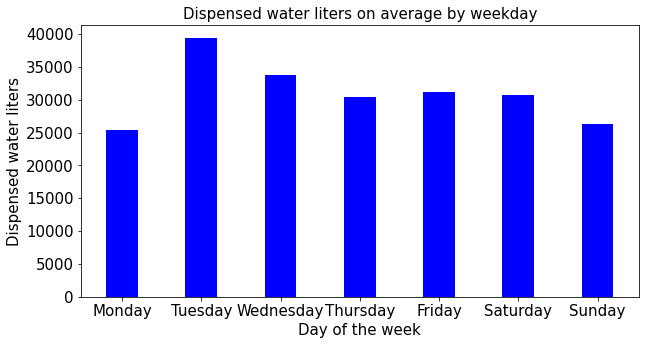

In [26]:
# Display a bar chart representing the number of liters by weekday on average
def barChartLiters(df,save,PATH):
    labels = {"Monday": 0, 'Tuesday':0, "Wednesday":0, "Thursday":0, "Friday":0, "Saturday":0, "Sunday":0}
    count = {"Monday": set(), 'Tuesday': set(), "Wednesday":set(), "Thursday":set(), "Friday":set(), "Saturday":set(), "Sunday":set()}

    
    # Get the pandas df where liters is non 0
    df_temp = df[df["Operation"]=="Getting water"]
    
    for i in range(len(df_temp)):
        weekday = findDay(df['Date'].iloc[i])
        labels[weekday] += df_temp['Liters(l)'].iloc[i]
        if df['Date'].iloc[i] not in count[weekday]:
            count[weekday].add(df['Date'].iloc[i])

    weekday = []
    values = []
    for k in labels :
        weekday.append(k)
        values.append(labels[k]/len(count[k]))

        
    fig = plt.figure(figsize = (10, 5))

    # creating the bar plot
    plt.bar(weekday, values, color ='blue',width = 0.4)

    plt.xlabel("Day of the week")
    plt.ylabel("Dispensed water liters")
    plt.title("Dispensed water liters on average by weekday")
    
    if save:
        if not os.path.exists(PATH):
            os.mkdir(PATH)
        plt.savefig(PATH+"Liters",bbox_inches="tight")
    
    plt.show()
barChartLiters(noWeirdDate,True,"graphs/")

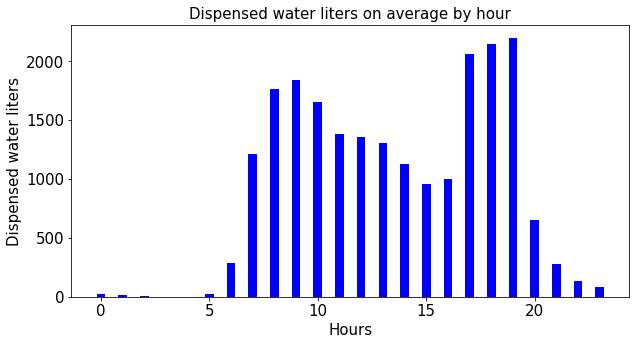

In [28]:
# Display a bar chart representing the number of liters by hour on average
def barChartLitersHours(df,save,PATH):
    LitersByHours = [0 for i in range(24)]
    weekdaysNb = nbWeekday(data)
    count = 0
    for e in weekdaysNb:
        count += len(weekdaysNb[e]) 
    
    # Get the pandas df where liters is non 0
    df_temp = df[df["Operation"]=="Getting water"]
    
    for i in range(len(df_temp)):
        # Take the hour as the index 
        LitersByHours[int(df_temp['Hours'].iloc[i][:2])] +=  df_temp['Liters(l)'].iloc[i]


    AverageLiter = [i/count for i in LitersByHours]
        
    fig = plt.figure(figsize = (10, 5))

    # creating the bar plot
    plt.bar([i for i in range(24)], AverageLiter, color ='blue',width = 0.4)

    plt.xlabel("Hours")
    plt.ylabel("Dispensed water liters")
    plt.title("Dispensed water liters on average by hour")
    

    if save:
        if not os.path.exists(PATH):
            os.mkdir(PATH)
        plt.savefig(PATH+"hourly_water",bbox_inches="tight")
    
    plt.show()
barChartLitersHours(noWeirdDate,True,"graphs/")

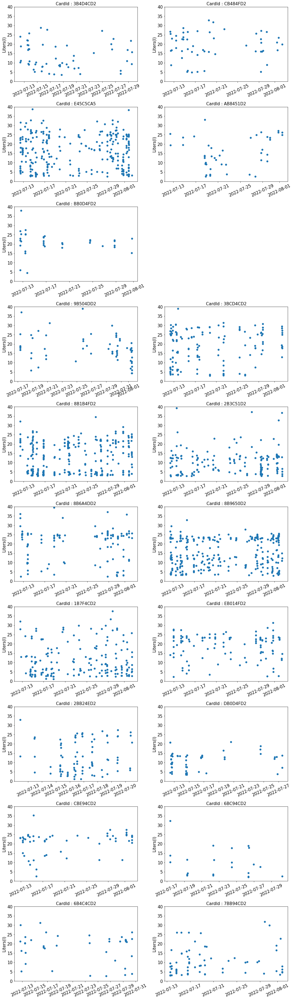

In [29]:
# Print graphs of the water dispensed by card ID
def habits(df):
    fig = plt.figure(figsize=(15,250))
    for i,cardid in enumerate(df['CardId'].unique()[:20]):
        df_temp = df[(df["CardId"]==cardid) & (df["Flow(l/m)"] != 0)][["Timestamp", "Liters(l)"]]

        if not df_temp.empty :
            df_temp = df_temp.sort_values(by='Timestamp')
            
            ax1 =  fig.add_subplot(50,2,i+1)
            dates=[dt.datetime.fromtimestamp(ts) for ts in list(df_temp['Timestamp'])]
            #plt.plot(df_temp['Timestamp'], df_temp['Flow(l/m)'])
            plt.scatter(dates, df_temp['Liters(l)'])
            plt.title("CardId : {}".format(cardid))
            #plt.xlabel("Timestamp (m)")
            plt.ylabel("Liters(l)")
            
            # gca (Get the Current Axis) to set the y limit
            ax = plt.gca()
            ax.set_ylim([0, 40])
            
            xfmt = md.DateFormatter('%Y-%m-%d')
            ax.xaxis.set_major_formatter(xfmt)
            plt.xticks( rotation=25 )
            
            

    # set the spacing between subplots
    fig.tight_layout()
    plt.show()
    
    #dest = os.path.join(path, figname)
    #plt.savefig(dest)  # write image to file
    #plt.cla()

habits(noWeirdDate)

In [30]:
# Diplay the correlation of the variables. No surprise, there is no clear correlation except for liter and flow 
for i,assetID in enumerate(noWeirdDate["AssetId"].unique()):
    print("Asset Id :", assetID)
    display(noWeirdDate[noWeirdDate["AssetId"]==assetID].corr())

Asset Id : 15


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.006865,0.080365,-0.094935,0.029622,-0.062414,-0.036511,-0.062950
BatteryVoltage(V),NaN,NaN,NaN,0.006865,1.000000,0.165055,-0.112667,0.031652,-0.147369,-0.108391,-0.145635
UsageCounter,NaN,NaN,NaN,0.080365,0.165055,1.000000,-0.193519,0.072102,-0.139917,-0.189655,-0.124219
StartCreditValue,NaN,NaN,NaN,-0.094935,-0.112667,-0.193519,1.000000,0.007353,0.472635,0.033118,0.526097
EndCreditValue,NaN,NaN,NaN,0.029622,0.031652,0.072102,0.007353,1.000000,-0.183809,-0.353653,-0.141516
Liters(l),NaN,NaN,NaN,-0.062414,-0.147369,-0.139917,0.472635,-0.183809,1.000000,0.442574,0.978285
Flow(l/m),NaN,NaN,NaN,-0.036511,-0.108391,-0.189655,0.033118,-0.353653,0.442574,1.000000,0.306518


Asset Id : 18


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.045297,0.003912,-0.229481,-0.009047,-0.024946,-0.005133,-0.030819
BatteryVoltage(V),NaN,NaN,NaN,-0.045297,1.000000,-0.037225,-0.056930,0.020915,-0.013992,0.029183,-0.019169
UsageCounter,NaN,NaN,NaN,0.003912,-0.037225,1.000000,-0.024358,0.009007,-0.012567,-0.042995,-0.011131
StartCreditValue,NaN,NaN,NaN,-0.229481,-0.056930,-0.024358,1.000000,-0.016486,0.113058,0.041700,0.127238
EndCreditValue,NaN,NaN,NaN,-0.009047,0.020915,0.009007,-0.016486,1.000000,-0.257361,-0.351055,-0.241558
Liters(l),NaN,NaN,NaN,-0.024946,-0.013992,-0.012567,0.113058,-0.257361,1.000000,0.711071,0.979353
Flow(l/m),NaN,NaN,NaN,-0.005133,0.029183,-0.042995,0.041700,-0.351055,0.711071,1.000000,0.635496


Asset Id : 5


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.128177,0.057242,0.086670,0.009224,-0.053936,0.055037,-0.115077
BatteryVoltage(V),NaN,NaN,NaN,-0.128177,1.000000,-0.070600,-0.118864,0.014241,-0.026018,-0.000368,-0.029275
UsageCounter,NaN,NaN,NaN,0.057242,-0.070600,1.000000,0.078722,-0.010262,-0.039937,0.058289,-0.045815
StartCreditValue,NaN,NaN,NaN,0.086670,-0.118864,0.078722,1.000000,-0.037172,0.052750,0.042106,0.046552
EndCreditValue,NaN,NaN,NaN,0.009224,0.014241,-0.010262,-0.037172,1.000000,-0.247878,-0.362973,-0.242222
Liters(l),NaN,NaN,NaN,-0.053936,-0.026018,-0.039937,0.052750,-0.247878,1.000000,0.633580,0.993162
Flow(l/m),NaN,NaN,NaN,0.055037,-0.000368,0.058289,0.042106,-0.362973,0.633580,1.000000,0.589951


Asset Id : 8


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.193182,0.042771,-0.104411,-0.008889,0.038249,0.050623,0.035645
BatteryVoltage(V),NaN,NaN,NaN,-0.193182,1.000000,-0.159996,0.098599,0.000305,0.037975,0.022305,0.032450
UsageCounter,NaN,NaN,NaN,0.042771,-0.159996,1.000000,-0.058002,0.065305,-0.107580,-0.102449,-0.107614
StartCreditValue,NaN,NaN,NaN,-0.104411,0.098599,-0.058002,1.000000,0.022886,0.066646,-0.003829,0.068772
EndCreditValue,NaN,NaN,NaN,-0.008889,0.000305,0.065305,0.022886,1.000000,-0.278993,-0.397284,-0.282726
Liters(l),NaN,NaN,NaN,0.038249,0.037975,-0.107580,0.066646,-0.278993,1.000000,0.684857,0.998956
Flow(l/m),NaN,NaN,NaN,0.050623,0.022305,-0.102449,-0.003829,-0.397284,0.684857,1.000000,0.669704


Asset Id : 664


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.057325,0.820623,-0.008389,-0.008389,NaN,NaN,-0.008736
BatteryVoltage(V),NaN,NaN,NaN,-0.057325,1.000000,0.012097,0.106431,0.106431,NaN,NaN,0.120911
UsageCounter,NaN,NaN,NaN,0.820623,0.012097,1.000000,0.563750,0.563750,NaN,NaN,0.485558
StartCreditValue,NaN,NaN,NaN,-0.008389,0.106431,0.563750,1.000000,1.000000,NaN,NaN,0.863649
EndCreditValue,NaN,NaN,NaN,-0.008389,0.106431,0.563750,1.000000,1.000000,NaN,NaN,0.863649
Liters(l),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Flow(l/m),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Asset Id : 17


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.129300,0.016339,-0.058421,-0.024270,-0.000669,0.009296,0.000668
BatteryVoltage(V),NaN,NaN,NaN,-0.129300,1.000000,-0.004517,0.009338,0.008561,-0.020339,-0.040549,-0.030765
UsageCounter,NaN,NaN,NaN,0.016339,-0.004517,1.000000,0.039605,0.006370,0.033974,0.057587,0.040859
StartCreditValue,NaN,NaN,NaN,-0.058421,0.009338,0.039605,1.000000,-0.006585,0.126980,0.089300,0.129443
EndCreditValue,NaN,NaN,NaN,-0.024270,0.008561,0.006370,-0.006585,1.000000,-0.238556,-0.305318,-0.239992
Liters(l),NaN,NaN,NaN,-0.000669,-0.020339,0.033974,0.126980,-0.238556,1.000000,0.764439,0.998636
Flow(l/m),NaN,NaN,NaN,0.009296,-0.040549,0.057587,0.089300,-0.305318,0.764439,1.000000,0.754213


Asset Id : 11


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.097267,0.206305,0.011269,-0.001954,0.062728,0.021936,0.060713
BatteryVoltage(V),NaN,NaN,NaN,0.097267,1.000000,0.504293,-0.343528,0.138959,0.147711,0.223326,0.154877
UsageCounter,NaN,NaN,NaN,0.206305,0.504293,1.000000,-0.038742,0.083106,0.095613,0.145855,0.109954
StartCreditValue,NaN,NaN,NaN,0.011269,-0.343528,-0.038742,1.000000,-0.008286,-0.020577,-0.024730,-0.022022
EndCreditValue,NaN,NaN,NaN,-0.001954,0.138959,0.083106,-0.008286,1.000000,-0.240927,-0.288425,-0.241844
Liters(l),NaN,NaN,NaN,0.062728,0.147711,0.095613,-0.020577,-0.240927,1.000000,0.806238,0.996993
Flow(l/m),NaN,NaN,NaN,0.021936,0.223326,0.145855,-0.024730,-0.288425,0.806238,1.000000,0.792168


Asset Id : 27


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.041068,0.026968,0.078467,-0.003025,-0.035589,-0.039409,-0.032156
BatteryVoltage(V),NaN,NaN,NaN,-0.041068,1.000000,-0.061140,-0.038357,0.031248,-0.019897,-0.014342,-0.029199
UsageCounter,NaN,NaN,NaN,0.026968,-0.061140,1.000000,0.402531,-0.035811,-0.124071,-0.085747,-0.111851
StartCreditValue,NaN,NaN,NaN,0.078467,-0.038357,0.402531,1.000000,0.009707,0.083524,0.032822,0.093402
EndCreditValue,NaN,NaN,NaN,-0.003025,0.031248,-0.035811,0.009707,1.000000,-0.181398,-0.264324,-0.180050
Liters(l),NaN,NaN,NaN,-0.035589,-0.019897,-0.124071,0.083524,-0.181398,1.000000,0.653383,0.994750
Flow(l/m),NaN,NaN,NaN,-0.039409,-0.014342,-0.085747,0.032822,-0.264324,0.653383,1.000000,0.610414


Asset Id : 14


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.100559,-0.093287,0.007973,0.042681,-0.078966,-0.091518,-0.079496
BatteryVoltage(V),NaN,NaN,NaN,-0.100559,1.000000,-0.044704,-0.011836,-0.066263,-0.047262,0.021282,-0.062530
UsageCounter,NaN,NaN,NaN,-0.093287,-0.044704,1.000000,0.656540,0.025519,-0.039102,-0.041496,-0.037129
StartCreditValue,NaN,NaN,NaN,0.007973,-0.011836,0.656540,1.000000,0.002303,-0.007706,0.031900,-0.010096
EndCreditValue,NaN,NaN,NaN,0.042681,-0.066263,0.025519,0.002303,1.000000,-0.294716,-0.427968,-0.294592
Liters(l),NaN,NaN,NaN,-0.078966,-0.047262,-0.039102,-0.007706,-0.294716,1.000000,0.679116,0.998846
Flow(l/m),NaN,NaN,NaN,-0.091518,0.021282,-0.041496,0.031900,-0.427968,0.679116,1.000000,0.661563


Asset Id : 13


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.117256,-0.014999,-0.108157,0.002179,-0.001215,-0.003180,-0.003543
BatteryVoltage(V),NaN,NaN,NaN,-0.117256,1.000000,0.063650,0.030253,0.055846,-0.072772,-0.037659,-0.086924
UsageCounter,NaN,NaN,NaN,-0.014999,0.063650,1.000000,0.062455,0.016727,-0.025340,0.034017,-0.029366
StartCreditValue,NaN,NaN,NaN,-0.108157,0.030253,0.062455,1.000000,-0.006549,0.043281,0.003112,0.043492
EndCreditValue,NaN,NaN,NaN,0.002179,0.055846,0.016727,-0.006549,1.000000,-0.263082,-0.335733,-0.266138
Liters(l),NaN,NaN,NaN,-0.001215,-0.072772,-0.025340,0.043281,-0.263082,1.000000,0.744577,0.998562
Flow(l/m),NaN,NaN,NaN,-0.003180,-0.037659,0.034017,0.003112,-0.335733,0.744577,1.000000,0.727400


Asset Id : 24


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.132509,0.030827,-0.018428,-0.023964,0.367762,0.448205,0.294847
BatteryVoltage(V),NaN,NaN,NaN,0.132509,1.000000,0.099331,-0.456465,-0.009177,0.078416,0.129541,0.053091
UsageCounter,NaN,NaN,NaN,0.030827,0.099331,1.000000,-0.041290,0.003245,-0.004337,-0.002905,-0.014893
StartCreditValue,NaN,NaN,NaN,-0.018428,-0.456465,-0.041290,1.000000,-0.007962,-0.013094,-0.017542,-0.017373
EndCreditValue,NaN,NaN,NaN,-0.023964,-0.009177,0.003245,-0.007962,1.000000,-0.197479,-0.258516,-0.246426
Liters(l),NaN,NaN,NaN,0.367762,0.078416,-0.004337,-0.013094,-0.197479,1.000000,0.752794,0.983064
Flow(l/m),NaN,NaN,NaN,0.448205,0.129541,-0.002905,-0.017542,-0.258516,0.752794,1.000000,0.694357


Asset Id : 22


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.132726,-0.011898,-0.074402,0.002563,0.044158,0.089904,0.018979
BatteryVoltage(V),NaN,NaN,NaN,0.132726,1.000000,-0.005258,-0.033498,0.033206,-0.117143,0.007805,-0.131579
UsageCounter,NaN,NaN,NaN,-0.011898,-0.005258,1.000000,-0.088845,-0.024323,0.031576,0.013356,0.021449
StartCreditValue,NaN,NaN,NaN,-0.074402,-0.033498,-0.088845,1.000000,0.019846,0.099720,0.021149,0.110407
EndCreditValue,NaN,NaN,NaN,0.002563,0.033206,-0.024323,0.019846,1.000000,-0.234760,-0.370780,-0.225013
Liters(l),NaN,NaN,NaN,0.044158,-0.117143,0.031576,0.099720,-0.234760,1.000000,0.583222,0.967279
Flow(l/m),NaN,NaN,NaN,0.089904,0.007805,0.013356,0.021149,-0.370780,0.583222,1.000000,0.486728


Asset Id : 16


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.084957,0.103255,-0.050757,0.010370,0.022032,0.047238,0.019079
BatteryVoltage(V),NaN,NaN,NaN,0.084957,1.000000,0.465030,-0.845087,0.114810,0.290259,0.359877,0.275858
UsageCounter,NaN,NaN,NaN,0.103255,0.465030,1.000000,-0.365966,0.159008,0.334427,0.441168,0.320161
StartCreditValue,NaN,NaN,NaN,-0.050757,-0.845087,-0.365966,1.000000,-0.087856,-0.230458,-0.284229,-0.219635
EndCreditValue,NaN,NaN,NaN,0.010370,0.114810,0.159008,-0.087856,1.000000,-0.136693,-0.168589,-0.120704
Liters(l),NaN,NaN,NaN,0.022032,0.290259,0.334427,-0.230458,-0.136693,1.000000,0.790737,0.976618
Flow(l/m),NaN,NaN,NaN,0.047238,0.359877,0.441168,-0.284229,-0.168589,0.790737,1.000000,0.714764


Asset Id : 21


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.000491,-0.012720,-0.014850,-0.031680,0.006075,0.047363,-0.018610
BatteryVoltage(V),NaN,NaN,NaN,-0.000491,1.000000,0.037555,0.018412,0.015393,-0.073289,-0.049343,-0.061865
UsageCounter,NaN,NaN,NaN,-0.012720,0.037555,1.000000,-0.063701,0.062422,-0.012663,-0.063299,-0.004465
StartCreditValue,NaN,NaN,NaN,-0.014850,0.018412,-0.063701,1.000000,0.004780,0.060110,0.014987,0.056654
EndCreditValue,NaN,NaN,NaN,-0.031680,0.015393,0.062422,0.004780,1.000000,-0.322336,-0.464039,-0.314640
Liters(l),NaN,NaN,NaN,0.006075,-0.073289,-0.012663,0.060110,-0.322336,1.000000,0.681134,0.965190
Flow(l/m),NaN,NaN,NaN,0.047363,-0.049343,-0.063299,0.014987,-0.464039,0.681134,1.000000,0.598107


Asset Id : 9


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.074296,0.085825,-0.158516,-0.045508,0.151469,0.180201,0.128064
BatteryVoltage(V),NaN,NaN,NaN,-0.074296,1.000000,0.005865,-0.068673,0.016679,-0.070000,-0.065579,-0.060134
UsageCounter,NaN,NaN,NaN,0.085825,0.005865,1.000000,0.111298,0.010794,0.055172,-0.000214,0.061243
StartCreditValue,NaN,NaN,NaN,-0.158516,-0.068673,0.111298,1.000000,0.001067,0.057831,0.043319,0.060096
EndCreditValue,NaN,NaN,NaN,-0.045508,0.016679,0.010794,0.001067,1.000000,-0.223299,-0.274503,-0.250813
Liters(l),NaN,NaN,NaN,0.151469,-0.070000,0.055172,0.057831,-0.223299,1.000000,0.774829,0.986979
Flow(l/m),NaN,NaN,NaN,0.180201,-0.065579,-0.000214,0.043319,-0.274503,0.774829,1.000000,0.727700


Asset Id : 4


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.444722,-0.037142,-0.150689,0.007890,0.011743,0.001169,0.025528
BatteryVoltage(V),NaN,NaN,NaN,-0.444722,1.000000,-0.092195,-0.044726,0.026721,-0.106091,-0.064153,-0.118855
UsageCounter,NaN,NaN,NaN,-0.037142,-0.092195,1.000000,-0.114844,-0.047362,0.045269,0.039571,0.046468
StartCreditValue,NaN,NaN,NaN,-0.150689,-0.044726,-0.114844,1.000000,-0.015978,0.152819,0.079246,0.151550
EndCreditValue,NaN,NaN,NaN,0.007890,0.026721,-0.047362,-0.015978,1.000000,-0.210619,-0.292523,-0.212287
Liters(l),NaN,NaN,NaN,0.011743,-0.106091,0.045269,0.152819,-0.210619,1.000000,0.687032,0.998682
Flow(l/m),NaN,NaN,NaN,0.001169,-0.064153,0.039571,0.079246,-0.292523,0.687032,1.000000,0.669547


Asset Id : 28


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.274692,0.073060,0.122821,0.018465,0.006993,0.040269,0.008250
BatteryVoltage(V),NaN,NaN,NaN,-0.274692,1.000000,-0.065242,0.015498,-0.025569,0.050961,0.057756,0.040955
UsageCounter,NaN,NaN,NaN,0.073060,-0.065242,1.000000,0.150916,-0.042859,-0.042188,-0.040087,-0.039716
StartCreditValue,NaN,NaN,NaN,0.122821,0.015498,0.150916,1.000000,-0.027753,0.076072,0.083525,0.074542
EndCreditValue,NaN,NaN,NaN,0.018465,-0.025569,-0.042859,-0.027753,1.000000,-0.222438,-0.308696,-0.227348
Liters(l),NaN,NaN,NaN,0.006993,0.050961,-0.042188,0.076072,-0.222438,1.000000,0.706484,0.998866
Flow(l/m),NaN,NaN,NaN,0.040269,0.057756,-0.040087,0.083525,-0.308696,0.706484,1.000000,0.692595


Asset Id : 19


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.004276,-0.084471,-0.021806,-0.053699,-0.030941,0.023125,-0.062245
BatteryVoltage(V),NaN,NaN,NaN,0.004276,1.000000,-0.173216,0.029266,0.032045,0.012080,0.024136,0.005362
UsageCounter,NaN,NaN,NaN,-0.084471,-0.173216,1.000000,0.005268,0.053432,-0.079944,-0.025712,-0.073737
StartCreditValue,NaN,NaN,NaN,-0.021806,0.029266,0.005268,1.000000,0.059375,-0.002835,-0.009041,-0.000803
EndCreditValue,NaN,NaN,NaN,-0.053699,0.032045,0.053432,0.059375,1.000000,-0.180308,-0.247504,-0.153999
Liters(l),NaN,NaN,NaN,-0.030941,0.012080,-0.079944,-0.002835,-0.180308,1.000000,0.675955,0.958330
Flow(l/m),NaN,NaN,NaN,0.023125,0.024136,-0.025712,-0.009041,-0.247504,0.675955,1.000000,0.503090


Asset Id : 20


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.090920,-0.130743,0.068697,-0.020436,0.031125,0.053066,0.013283
BatteryVoltage(V),NaN,NaN,NaN,0.090920,1.000000,-0.012582,-0.006372,0.001620,0.001089,0.002700,-0.006674
UsageCounter,NaN,NaN,NaN,-0.130743,-0.012582,1.000000,0.005854,0.002782,-0.096913,-0.083695,-0.063412
StartCreditValue,NaN,NaN,NaN,0.068697,-0.006372,0.005854,1.000000,-0.000696,0.043640,0.037961,0.064807
EndCreditValue,NaN,NaN,NaN,-0.020436,0.001620,0.002782,-0.000696,1.000000,-0.181128,-0.295280,-0.142329
Liters(l),NaN,NaN,NaN,0.031125,0.001089,-0.096913,0.043640,-0.181128,1.000000,0.570954,0.950338
Flow(l/m),NaN,NaN,NaN,0.053066,0.002700,-0.083695,0.037961,-0.295280,0.570954,1.000000,0.414034


Asset Id : 3


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.218953,-0.182888,-0.029254,-0.012092,-0.028230,0.003276,-0.022925
BatteryVoltage(V),NaN,NaN,NaN,-0.218953,1.000000,0.050565,0.039491,-0.004685,-0.073515,-0.002177,-0.039749
UsageCounter,NaN,NaN,NaN,-0.182888,0.050565,1.000000,0.103709,0.050299,0.002609,0.036822,-0.014044
StartCreditValue,NaN,NaN,NaN,-0.029254,0.039491,0.103709,1.000000,0.001843,0.266430,-0.036025,0.396483
EndCreditValue,NaN,NaN,NaN,-0.012092,-0.004685,0.050299,0.001843,1.000000,-0.195144,-0.380724,-0.143775
Liters(l),NaN,NaN,NaN,-0.028230,-0.073515,0.002609,0.266430,-0.195144,1.000000,0.453510,0.913779
Flow(l/m),NaN,NaN,NaN,0.003276,-0.002177,0.036822,-0.036025,-0.380724,0.453510,1.000000,0.284490


Asset Id : 10


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.079682,0.108247,0.116154,0.005783,-0.003482,-0.006314,-0.004592
BatteryVoltage(V),NaN,NaN,NaN,0.079682,1.000000,0.150530,-0.066229,0.000731,-0.084320,-0.014950,-0.102544
UsageCounter,NaN,NaN,NaN,0.108247,0.150530,1.000000,-0.160080,0.011333,-0.095064,-0.041609,-0.097865
StartCreditValue,NaN,NaN,NaN,0.116154,-0.066229,-0.160080,1.000000,-0.046127,0.070429,-0.014738,0.075288
EndCreditValue,NaN,NaN,NaN,0.005783,0.000731,0.011333,-0.046127,1.000000,-0.299155,-0.378754,-0.302371
Liters(l),NaN,NaN,NaN,-0.003482,-0.084320,-0.095064,0.070429,-0.299155,1.000000,0.762946,0.998136
Flow(l/m),NaN,NaN,NaN,-0.006314,-0.014950,-0.041609,-0.014738,-0.378754,0.762946,1.000000,0.744835


Asset Id : 7


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.053912,0.054583,0.205099,0.023107,0.008333,-0.003277,0.004691
BatteryVoltage(V),NaN,NaN,NaN,-0.053912,1.000000,-0.053341,-0.115422,-0.010035,0.027669,0.052839,0.010110
UsageCounter,NaN,NaN,NaN,0.054583,-0.053341,1.000000,0.020661,0.033286,-0.029938,-0.000078,-0.029189
StartCreditValue,NaN,NaN,NaN,0.205099,-0.115422,0.020661,1.000000,0.029706,-0.021889,-0.062145,-0.019683
EndCreditValue,NaN,NaN,NaN,0.023107,-0.010035,0.033286,0.029706,1.000000,-0.210648,-0.346529,-0.206660
Liters(l),NaN,NaN,NaN,0.008333,0.027669,-0.029938,-0.021889,-0.210648,1.000000,0.600830,0.992758
Flow(l/m),NaN,NaN,NaN,-0.003277,0.052839,-0.000078,-0.062145,-0.346529,0.600830,1.000000,0.567953


Asset Id : 26


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.054831,0.054557,-0.105322,-0.051401,0.067414,0.098672,0.066364
BatteryVoltage(V),NaN,NaN,NaN,0.054831,1.000000,0.242219,-0.940001,0.056418,0.083967,0.125898,0.087885
UsageCounter,NaN,NaN,NaN,0.054557,0.242219,1.000000,-0.224176,0.079279,0.063495,0.090032,0.067823
StartCreditValue,NaN,NaN,NaN,-0.105322,-0.940001,-0.224176,1.000000,-0.046836,-0.106818,-0.139858,-0.112911
EndCreditValue,NaN,NaN,NaN,-0.051401,0.056418,0.079279,-0.046836,1.000000,-0.256442,-0.335813,-0.259067
Liters(l),NaN,NaN,NaN,0.067414,0.083967,0.063495,-0.106818,-0.256442,1.000000,0.730039,0.998758
Flow(l/m),NaN,NaN,NaN,0.098672,0.125898,0.090032,-0.139858,-0.335813,0.730039,1.000000,0.715383


Asset Id : 144


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.027174,0.097482,-0.197437,-0.045438,-0.074473,-0.030923,-0.081523
BatteryVoltage(V),NaN,NaN,NaN,0.027174,1.000000,0.006875,-0.022893,-0.028458,0.007271,0.005567,-0.006252
UsageCounter,NaN,NaN,NaN,0.097482,0.006875,1.000000,0.090441,0.069933,-0.082771,-0.083327,-0.081358
StartCreditValue,NaN,NaN,NaN,-0.197437,-0.022893,0.090441,1.000000,-0.018608,0.179772,0.120838,0.181595
EndCreditValue,NaN,NaN,NaN,-0.045438,-0.028458,0.069933,-0.018608,1.000000,-0.220256,-0.305952,-0.223758
Liters(l),NaN,NaN,NaN,-0.074473,0.007271,-0.082771,0.179772,-0.220256,1.000000,0.701011,0.998784
Flow(l/m),NaN,NaN,NaN,-0.030923,0.005567,-0.083327,0.120838,-0.305952,0.701011,1.000000,0.685344


Asset Id : 12


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.051461,-0.089326,-0.011720,-0.021016,-0.091162,-0.052410,-0.086245
BatteryVoltage(V),NaN,NaN,NaN,0.051461,1.000000,0.084301,-0.122354,0.026333,-0.032814,-0.063451,-0.040648
UsageCounter,NaN,NaN,NaN,-0.089326,0.084301,1.000000,0.031138,-0.055142,0.169338,0.106156,0.172809
StartCreditValue,NaN,NaN,NaN,-0.011720,-0.122354,0.031138,1.000000,-0.005591,-0.036036,0.008751,-0.037529
EndCreditValue,NaN,NaN,NaN,-0.021016,0.026333,-0.055142,-0.005591,1.000000,-0.277455,-0.332515,-0.289838
Liters(l),NaN,NaN,NaN,-0.091162,-0.032814,0.169338,-0.036036,-0.277455,1.000000,0.782768,0.998217
Flow(l/m),NaN,NaN,NaN,-0.052410,-0.063451,0.106156,0.008751,-0.332515,0.782768,1.000000,0.766250


Asset Id : 23


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.767624,0.040469,-0.010894,-0.002038,0.002999,0.026609,0.001724
BatteryVoltage(V),NaN,NaN,NaN,-0.767624,1.000000,-0.024215,0.046445,-0.031335,-0.018499,-0.026276,-0.022720
UsageCounter,NaN,NaN,NaN,0.040469,-0.024215,1.000000,0.000876,0.007836,-0.073587,-0.085783,-0.071947
StartCreditValue,NaN,NaN,NaN,-0.010894,0.046445,0.000876,1.000000,0.020359,0.073065,0.057497,0.072348
EndCreditValue,NaN,NaN,NaN,-0.002038,-0.031335,0.007836,0.020359,1.000000,-0.236562,-0.291094,-0.245321
Liters(l),NaN,NaN,NaN,0.002999,-0.018499,-0.073587,0.073065,-0.236562,1.000000,0.786965,0.997767
Flow(l/m),NaN,NaN,NaN,0.026609,-0.026276,-0.085783,0.057497,-0.291094,0.786965,1.000000,0.771394


Asset Id : 29


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,0.003643,0.102532,0.049302,0.006446,-0.000174,0.055225,-0.004930
BatteryVoltage(V),NaN,NaN,NaN,0.003643,1.000000,0.160882,0.063032,0.019274,0.147943,0.250330,0.149559
UsageCounter,NaN,NaN,NaN,0.102532,0.160882,1.000000,-0.070886,0.015007,0.064675,0.080204,0.068258
StartCreditValue,NaN,NaN,NaN,0.049302,0.063032,-0.070886,1.000000,0.033199,0.036009,0.067777,0.036577
EndCreditValue,NaN,NaN,NaN,0.006446,0.019274,0.015007,0.033199,1.000000,-0.189280,-0.300238,-0.190938
Liters(l),NaN,NaN,NaN,-0.000174,0.147943,0.064675,0.036009,-0.189280,1.000000,0.623804,0.999046
Flow(l/m),NaN,NaN,NaN,0.055225,0.250330,0.080204,0.067777,-0.300238,0.623804,1.000000,0.615912


Asset Id : 6


,WaterSystemId,AssetId,EWC_ID,Timestamp,BatteryVoltage(V),UsageCounter,StartCreditValue,EndCreditValue,Liters(l),Flow(l/m),FlowTime(s)
WaterSystemId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AssetId,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EWC_ID,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Timestamp,NaN,NaN,NaN,1.000000,-0.170043,-0.517599,0.054437,0.077322,-0.343474,-0.466029,-0.345230
BatteryVoltage(V),NaN,NaN,NaN,-0.170043,1.000000,0.359937,-0.868030,0.077638,0.217248,0.399412,0.216666
UsageCounter,NaN,NaN,NaN,-0.517599,0.359937,1.000000,-0.138976,0.029260,0.144535,0.572008,0.147733
StartCreditValue,NaN,NaN,NaN,0.054437,-0.868030,-0.138976,1.000000,-0.035560,-0.082108,-0.150484,-0.083089
EndCreditValue,NaN,NaN,NaN,0.077322,0.077638,0.029260,-0.035560,1.000000,-0.155080,-0.284933,-0.151388
Liters(l),NaN,NaN,NaN,-0.343474,0.217248,0.144535,-0.082108,-0.155080,1.000000,0.538742,0.999252
Flow(l/m),NaN,NaN,NaN,-0.466029,0.399412,0.572008,-0.150484,-0.284933,0.538742,1.000000,0.532808


# ML Algorithms for anomaly detection

In [33]:
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split
from mlxtend.plotting import plot_decision_regions
from sklearn.metrics import accuracy_score
import numpy as np
import seaborn as sns
from sklearn.neighbors import LocalOutlierFactor

In [34]:
noWeirdDateSortedWithoutZeros = noWeirdDate[noWeirdDate["BatteryVoltage(V)"]!=0].sort_values(by="Timestamp",ignore_index=True)
noWeirdDateSorted = noWeirdDate.sort_values(by='Timestamp',ignore_index=True)

In [38]:
def plot_scatter(df, string,save,PATH):
    dates=[dt.datetime.fromtimestamp(ts) for ts in list(df['Timestamp'])]
    #dates = df["Timestamp"]
    plt.scatter(dates, df["BatteryVoltage(V)"])
    plt.ylabel("Battery voltage (V)")
    plt.title(string)
    ax = plt.gca()

    xfmt = md.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_formatter(xfmt)
    plt.xticks( rotation=25 )
    
    if save :
        if not os.path.exists(PATH):
            os.mkdir(PATH)
        plt.savefig(PATH + "scatterplot", bbox_inches = "tight")
    
    plt.show()


In [39]:
#plot_scatter(bucketData,"Scatter plot of the battery voltage for all asset ID")

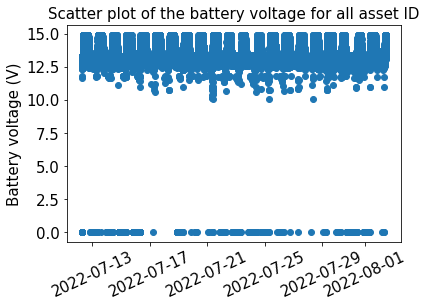

In [40]:
test = plot_scatter(noWeirdDateSorted,"Scatter plot of the battery voltage for all asset ID",True,"graphs/")

#plt.cla()
#plot_scatter(noWeirdDateSortedWithoutZeros, "Scatter plot of the battery voltage for all asset ID without the zero values")

In [46]:
# Remove the timestamp in the preprocessing because we don't care about the x distance
def preprocessing_X(df):
    X = df[["Timestamp","BatteryVoltage(V)"]].values
    for i in range(len(X)):
        X[i][0] = i
    return X
X = preprocessing_X(noWeirdDateSorted)

## Unsupervised Nearest Neighbours approach for battery voltage

In [47]:
def nearestNeighbour(nneighbors, X):
    nbrs = NearestNeighbors(n_neighbors = nneighbors)#,metric='euclidean')
    nbrs.fit(X)

    # distances is the distance to the neighbor of the corresponding point
    distances, indexes = nbrs.kneighbors(X)
    
    
    return(distances)

In [48]:
def outliers(df,distances,threshold):
    outlier_index = np.where(distances.mean(axis = 1) > threshold)
    outlier_values = df.iloc[outlier_index]
    return outlier_values

In [1055]:
def distance_plot(distances,threshold,df,k,save,PATH):
    dates=[dt.datetime.fromtimestamp(ts) for ts in list(df['Timestamp'])]
    fig = plt.figure()
    plt.plot(dates, distances.mean(axis =1))
    plt.axhline(y = threshold, color = 'r', linestyle = '-', label=threshold)
    plt.title("Mean distance of each point to its {} neighbours".format(k))
    plt.ylabel("Mean distance")
    
    ax = plt.gca()
    xfmt = md.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_formatter(xfmt)
    plt.xticks( rotation=25 )
    plt.legend(loc="upper left")
    
    if save :
        if not os.path.exists(PATH):
            os.mkdir(PATH)
        plt.savefig(PATH + "distanceNN{}".format(k), bbox_inches = "tight")
    
    
    plt.show()
#distance_plot(distances,threshold,noWeirdDateSorted,k)


In [1056]:
def plot_outliers(df,outlier_values,save,PATH,k):
        
    dates=[dt.datetime.fromtimestamp(ts) for ts in list(df['Timestamp'])]
    dates_ou=[dt.datetime.fromtimestamp(ts) for ts in list(outlier_values['Timestamp'])]

    
    plt.scatter(dates, df["BatteryVoltage(V)"], color = "b", label="inlier")# plot outlier values
    plt.scatter(dates_ou, outlier_values["BatteryVoltage(V)"], color = "r",label="outlier")# plot data
    
    ax = plt.gca()

    xfmt = md.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_formatter(xfmt)
    plt.xticks( rotation=25 )
    plt.ylabel("Battery voltage (V)")
    plt.title("Anomalies detected by NN for k = {}".format(k,threshold))
    plt.legend()
    
    
    if save :
        if not os.path.exists(PATH):
            os.mkdir(PATH)
        plt.savefig(PATH + "outliersNN{}".format(k), bbox_inches = "tight")
    
    plt.show()
#plot_outliers(noWeirdDateSorted,outlier_values)

### Hyperparamater search

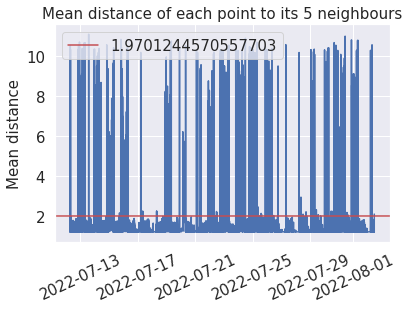

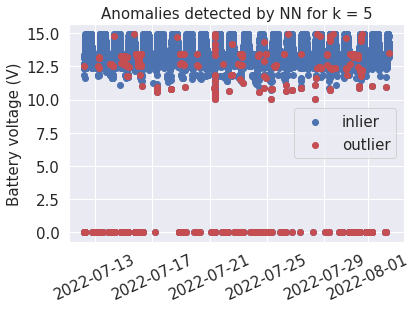

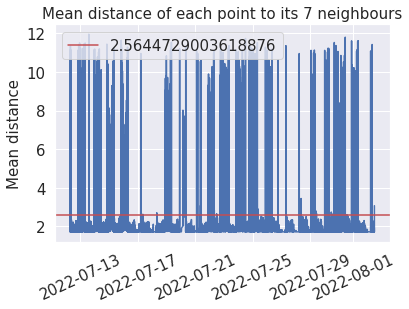

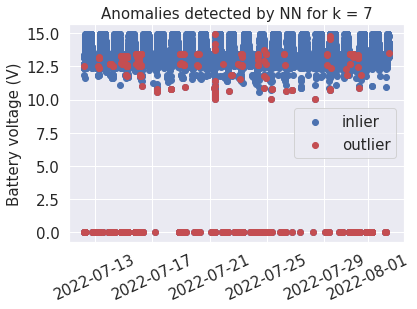

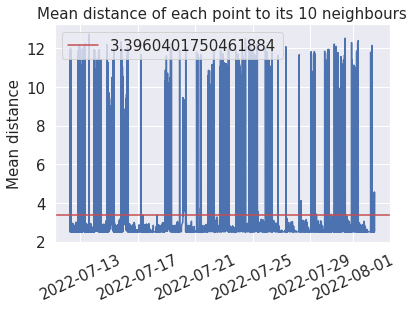

...

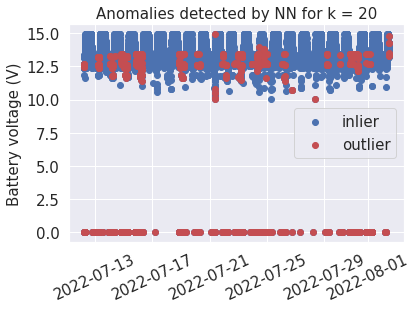

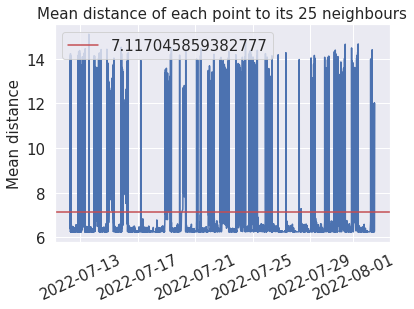

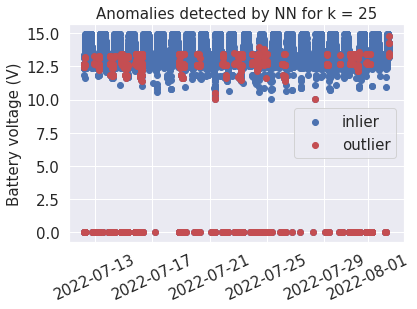

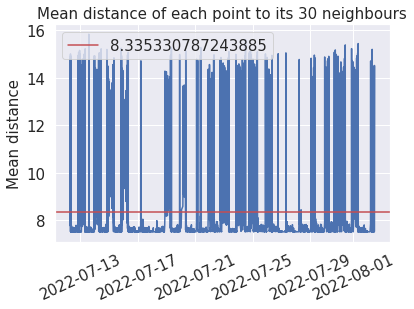

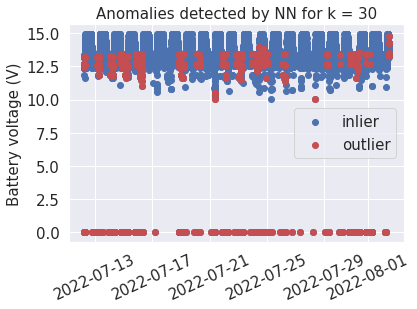

In [1057]:
# Hyperparameter search for k
from collections import defaultdict
k_hyper = [5,7,10,15,20,25,30]
dict_percentage = defaultdict(list)
for k in k_hyper:
    distances = nearestNeighbour(k,X)
    threshold = distances.mean(axis = 1).mean() + distances.mean(axis = 1).std()
    distance_plot(distances,threshold,noWeirdDateSorted,k,True,"distancesNN/")

    outlier_values = outliers(noWeirdDateSorted,distances,threshold)
    plot_outliers(noWeirdDateSorted,outlier_values,True,"outliersNN/",k)
    eva = evaluationtable(outlier_values,noWeirdDateSorted,"NN")
    for asset in noWeirdDateSorted["AssetId"].unique():
        dict_percentage[asset].append(eva["PercentageOfAnomalies_NN(%)"].loc["{}".format(asset)])
    

In [1024]:
colors = ["b","r","g","r","c","m","y","k","tab:orange","grey","tab:brown","tab:purple",
         "lime","yellow","pink","lightgray","tan","lightgreen","salmon", "darkslategray",
         "darkcyan","lavender","darkorchid","bisque","lightskyblue","thistle","palevioletred",
         "dodgerblue","darkolivegreen"]

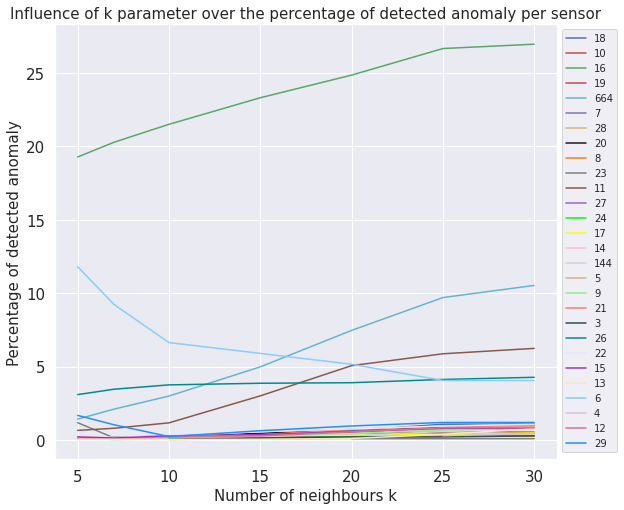

In [1058]:
plt.figure(figsize=(9, 8))
for i,k in enumerate(dict_percentage):
    plt.plot(k_hyper, dict_percentage[k], label=k,color=colors[i])
    plt.title("Influence of k parameter over the percentage of detected anomaly per sensor")
    plt.ylabel("Percentage of detected anomaly")
    plt.xlabel("Number of neighbours k")
plt.legend(bbox_to_anchor=(1,1), loc="upper left",fontsize=10)
plt.savefig("graphs/k_influence",bbox_inches='tight')
plt.show()

In [1092]:
# test NN unsupervised sur l'ensemble des données
distances = nearestNeighbour(10,X)
threshold = distances.mean(axis = 1).mean() + distances.mean(axis = 1).std()
outlier_values_NN = outliers(noWeirdDateSorted,distances,threshold)
# Remove the 0 values for the battery voltage 
#distances_noZeros = nearestNeighbour(noWeirdDateSortedWithoutZeros,3,X)
#outlier_valuesNoZeros = outliers(noWeirdDateSortedWithoutZeros,distances_noZeros,1.35)

### Evaluation

In [1093]:
def anomalyScoreTable_NN(noWeirdDateSorted,distances,threshold):
    anomalyScores_NN = noWeirdDateSorted[["Timestamp","AssetId","BatteryVoltage(V)"]].copy()
    anomalyScores_NN["AnomalyScore_NN"] = distances.mean(axis=1)
    anomalyScores_NN["Anomaly_NN?"] = anomalyScores_NN["AnomalyScore_NN"] > threshold
    return anomalyScores_NN

In [1094]:
anomalyScores_NN = anomalyScoreTable_NN(noWeirdDateSorted,distances,4.3)
#anomalyScores_NNnoZeros = anomalyScoreTable_NN(noWeirdDateSortedWithoutZeros,distances_noZeros,1.35)
anomalyScores_NN

,Timestamp,AssetId,BatteryVoltage(V),AnomalyScore_NN,Anomaly_NN?
0,1657604242,18,12.539062,4.502820,True
1,1657604332,10,12.539062,3.703314,False
2,1657604374,18,12.480469,3.105286,False
3,1657604379,10,12.480469,2.706734,False
4,1657604438,18,12.656250,2.506391,False
...,...,...,...,...,...
62916,1659435522,21,14.238281,2.611976,False
62917,1659435527,20,13.300781,2.836453,False
62918,1659435532,14,14.765625,3.370994,False
62919,1659435541,27,13.359375,3.796348,False


In [1095]:
def evaluationtable(outlier_values,noWeirdDateSorted,algo):
    groupby = outlier_values.groupby(["AssetId"])
    evaluationDF = pd.DataFrame(columns=["NumberOfAnomalies_{}".format(algo),"PercentageOfAnomalies_{}(%)".format(algo)],index=sensorDF.columns)
    for c in groupby.groups:
        evaluationDF.loc["{}".format(c)] = [len(groupby.get_group(c)), (len(groupby.get_group(c)) * 100 )/len(noWeirdDateSorted[noWeirdDateSorted["AssetId"]==c])]
    evaluationDF.loc["Dataset"] = [len(outlier_values), (len(outlier_values) * 100 )/len(noWeirdDateSorted)]
    return evaluationDF


In [1096]:
evaluationDF_NN = evaluationtable(outlier_values_NN,noWeirdDateSorted,"NN")
#evaluationDF_NNNoZeros = evaluationtable(outlier_valuesNoZeros,noWeirdDateSortedWithoutZeros,"NN")

In [1097]:
evaluationDF_NN

,NumberOfAnomalies_NN,PercentageOfAnomalies_NN(%)
15,4,0.291971
18,6,0.132597
5,5,0.227376
8,1,0.04279
664,145,3.000207
17,3,0.112402
11,16,1.175606
27,5,0.210172
14,2,0.079083
13,1,0.056117


In [1103]:
def detected_anomalies(noWeirdDateSorted,anomalyScores_NN,algo, PATH):
    if not os.path.exists(PATH):
        os.mkdir(PATH)
    fig = plt.figure()
    for sensor in noWeirdDateSorted["AssetId"].unique():
        #dates=pd.to_datetime(sensorDF.index)
        #plt.plot(dates, sensorDF[sensor].values, color='b')
        df_temp = noWeirdDateSorted[noWeirdDateSorted["AssetId"]==int(sensor)]
        dates=[dt.datetime.fromtimestamp(ts) for ts in list(df_temp['Timestamp'])]
        plt.plot(dates, df_temp["BatteryVoltage(V)"], color='b')

        plt.xticks( rotation=15 )
        anomalous = anomalyScores_NN[(anomalyScores_NN["AssetId"]==int(sensor)) & (anomalyScores_NN["Anomaly_{}?".format(algo)]==True)]
        dates_ou=[dt.datetime.fromtimestamp(ts) for ts in list(anomalous['Timestamp'])]
        plt.scatter(dates_ou, anomalous["BatteryVoltage(V)"].values, color='r')
        plt.title("Anomalies detected by the {} for asset ID {}".format(algo,sensor))
        plt.ylabel("Battery Voltage (V)")
        plt.ylim([-1,16])
        
        plt.savefig(PATH + "assetID_{}_method_{}".format(sensor,algo), bbox_inches="tight")
        
        plt.show()

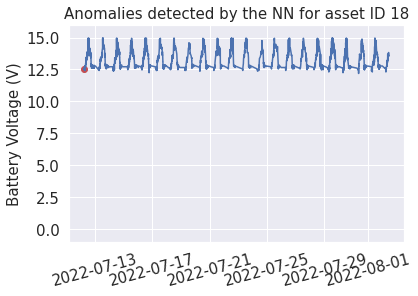

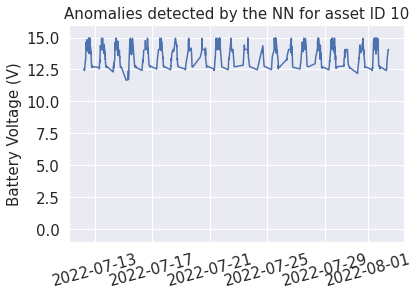

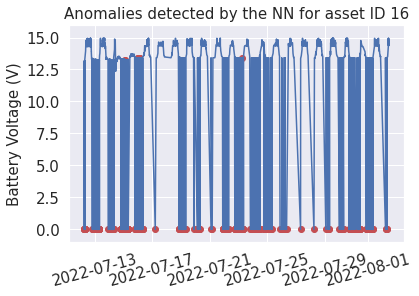

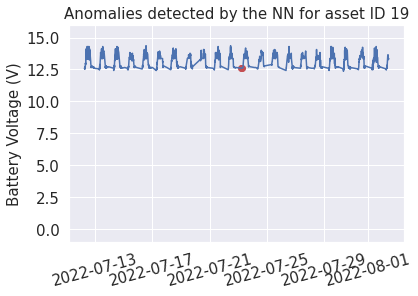

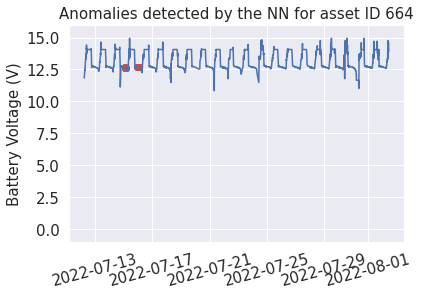

...

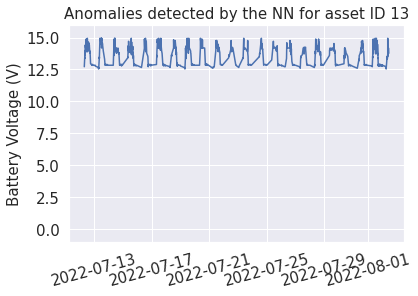

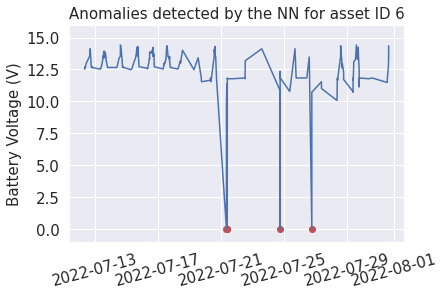

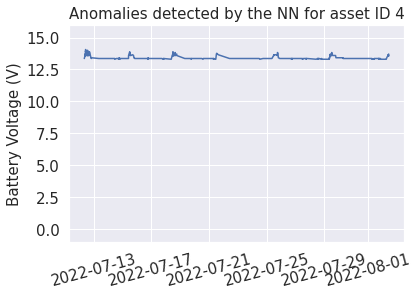

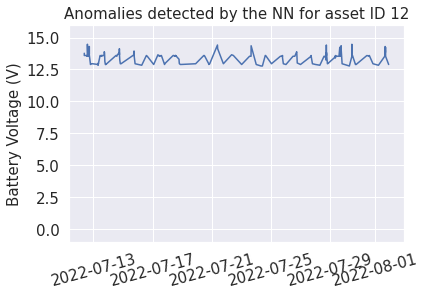

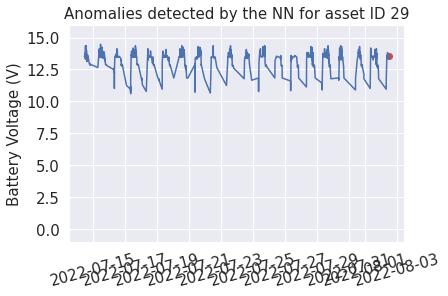

In [1104]:
detected_anomalies(noWeirdDateSorted,anomalyScores_NN,"NN", "detectedAnomalies/")

## Isolation forest for battery voltage

In [1100]:
# initializing Isolation Forest
def isolationForest(df,conta,X):
    clf = IsolationForest(max_samples='auto', contamination=conta)

    # training
    prediction_if = clf.fit_predict(X)
    
    predictions_if = np.array(prediction_if)

    
    score = clf.decision_function(X)
    
    outlier_index = np.where(predictions_if == -1)
    outlier_values = df.iloc[outlier_index]

    return (score,predictions_if,outlier_values)

In [1101]:
def plot_outlier_IF(df,predictions_if,conta,save,PATH):

    cdict = {1: 'blue', -1: 'red'}
    fig, ax = plt.subplots()
    for g in cdict:
        ix = np.where(predictions_if == g)
        dates=[dt.datetime.fromtimestamp(ts) for ts in list(df['Timestamp'].iloc[ix])]
        ax.scatter(dates, df["BatteryVoltage(V)"].iloc[ix], c = cdict[g], label = g)#, s = 100)
    
    xfmt = md.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_formatter(xfmt)
    plt.xticks( rotation=25 )
    plt.ylabel("Battery voltage (V)")
    plt.title("Anomalies detected by Isolation Forest, conta : {}".format(conta))
    ax.legend()
    
    if save :
        if not os.path.exists(PATH):
            os.mkdir(PATH)
        contaminationstr = str(conta)[2:]
        plt.savefig(PATH + "outliersIF{}".format(contaminationstr), bbox_inches = "tight")


    plt.show()

### Hyperparameter search

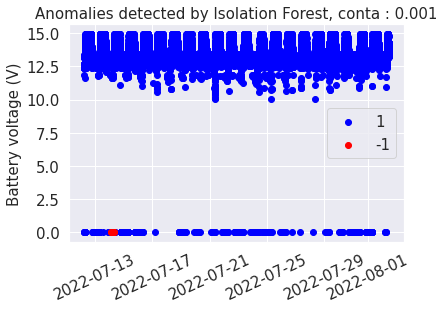

        NumberOfAnomalies_IF PercentageOfAnomalies_IF(%)
15                       NaN                         NaN
18                       NaN                         NaN
5                        NaN                         NaN
8                        NaN                         NaN
664                      NaN                         NaN
17                       NaN                         NaN
11                       NaN                         NaN
27                       NaN                         NaN
14                       NaN                         NaN
13                       NaN                         NaN
24                       NaN                         NaN
22                       NaN                         NaN
16                        21                    0.622776
21                       NaN                         NaN
9                        NaN                         NaN
4                        NaN                         NaN
28                       NaN   

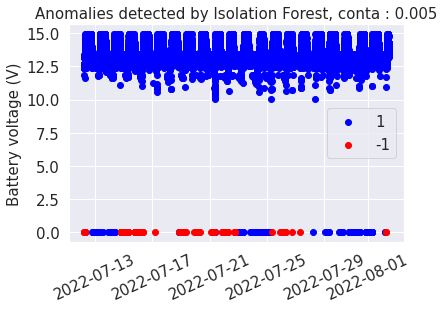

        NumberOfAnomalies_IF PercentageOfAnomalies_IF(%)
15                       NaN                         NaN
18                       NaN                         NaN
5                        NaN                         NaN
8                        NaN                         NaN
664                      NaN                         NaN
17                       NaN                         NaN
11                       NaN                         NaN
27                       NaN                         NaN
14                       NaN                         NaN
13                       NaN                         NaN
24                       NaN                         NaN
22                       NaN                         NaN
16                       256                    7.591934
21                       NaN                         NaN
9                        NaN                         NaN
4                        NaN                         NaN
28                       NaN   

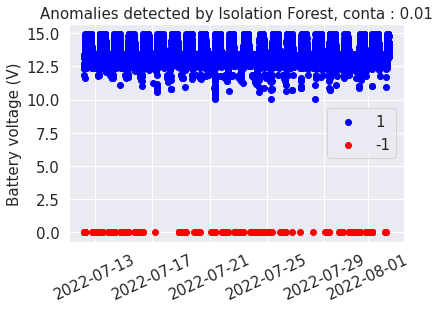

        NumberOfAnomalies_IF PercentageOfAnomalies_IF(%)
15                       NaN                         NaN
18                       NaN                         NaN
5                        NaN                         NaN
8                        NaN                         NaN
664                      NaN                         NaN
17                       NaN                         NaN
11                         1                    0.073475
27                       NaN                         NaN
14                       NaN                         NaN
13                       NaN                         NaN
24                         3                    0.050787
22                       NaN                         NaN
16                       553                   16.399763
21                       NaN                         NaN
9                        NaN                         NaN
4                        NaN                         NaN
28                       NaN   

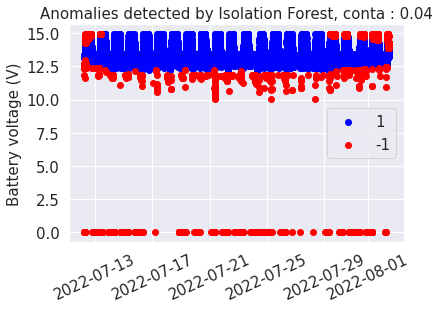

        NumberOfAnomalies_IF PercentageOfAnomalies_IF(%)
15                        33                    2.408759
18                       106                    2.342541
5                         10                    0.454752
8                         16                    0.684638
664                       58                    1.200083
17                       130                    4.870738
11                       207                   15.209405
27                       NaN                         NaN
14                       159                     6.28707
13                        34                    1.907969
24                       212                    3.588962
22                        74                    4.707379
16                       694                   20.581257
21                       116                    3.844879
9                        NaN                         NaN
4                        NaN                         NaN
28                       NaN   

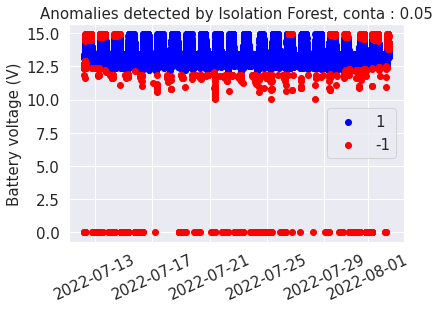

        NumberOfAnomalies_IF PercentageOfAnomalies_IF(%)
15                        43                    3.138686
18                       127                     2.80663
5                          9                    0.409277
8                         16                    0.684638
664                       50                    1.034554
17                       185                    6.931435
11                       227                   16.678913
27                       NaN                         NaN
14                       198                    7.829181
13                        86                    4.826038
24                       405                    6.856272
22                       107                    6.806616
16                       758                   22.479241
21                       153                    5.071263
9                          5                    0.125565
4                        NaN                         NaN
28                       NaN   

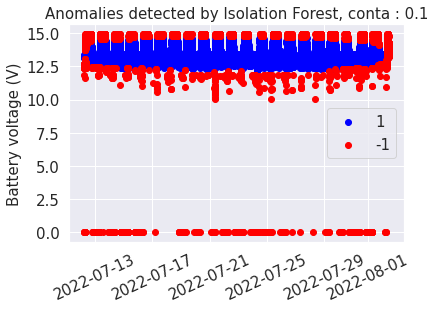

        NumberOfAnomalies_IF PercentageOfAnomalies_IF(%)
15                       182                   13.284672
18                       328                    7.248619
5                         26                    1.182356
8                         63                    2.695764
664                      190                    3.931306
17                       355                   13.300862
11                       371                   27.259368
27                        42                    1.765448
14                       441                   17.437722
13                       180                    10.10101
24                      1011                   17.115287
22                       269                   17.111959
16                       919                   27.253855
21                       391                   12.959894
9                         72                    1.808137
4                          8                    1.197605
28                         9   

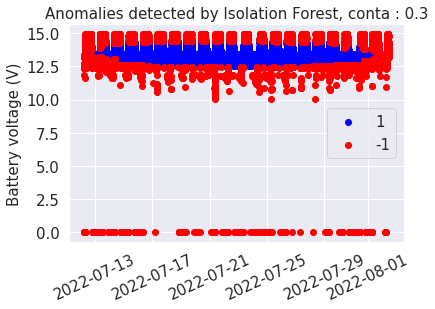

        NumberOfAnomalies_IF PercentageOfAnomalies_IF(%)
15                       424                   30.948905
18                      1445                   31.933702
5                        418                    19.00864
8                        600                   25.673941
664                     1254                   25.946617
17                       877                   32.858749
11                       705                   51.800147
27                       361                   15.174443
14                      1097                   43.376829
13                       717                    40.23569
24                      2052                   34.738446
22                       810                   51.526718
16                      1665                   49.377224
21                      1206                   39.973484
9                        443                   11.125063
4                        133                    19.91018
28                       143   

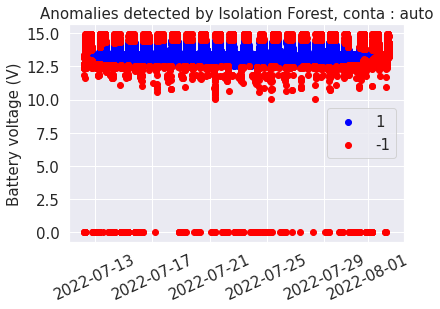

        NumberOfAnomalies_IF PercentageOfAnomalies_IF(%)
15                       319                   23.284672
18                      1083                   23.933702
5                        376                   17.098681
8                        462                   19.768935
664                     1189                   24.601697
17                       768                   28.774822
11                       656                   48.199853
27                       251                   10.550652
14                       976                   38.592329
13                       654                   36.700337
24                      1574                   26.646352
22                       696                   44.274809
16                      1446                   42.882562
21                      1043                   34.570766
9                        328                    8.237067
4                        103                   15.419162
28                        88   

In [1102]:
# Hyperparameter search for contamination
from collections import defaultdict
conta_hyper = [0.001,0.005,0.01,0.04,0.05,0.1,0.3,"auto"]
dict_percentageIF = defaultdict(list)
for conta in conta_hyper:
    score_if,pred_if,outlier_values_if = isolationForest(noWeirdDateSorted, conta, X)
    plot_outlier_IF(noWeirdDateSorted,pred_if,conta,True,"outliersIF/")
    eva_IF = evaluationtable(outlier_values_if,noWeirdDateSorted,"IF")
    print(eva_IF)
    for asset in noWeirdDateSorted["AssetId"].unique():
        dict_percentageIF[asset].append(eva_IF["PercentageOfAnomalies_IF(%)"].loc["{}".format(asset)])
    

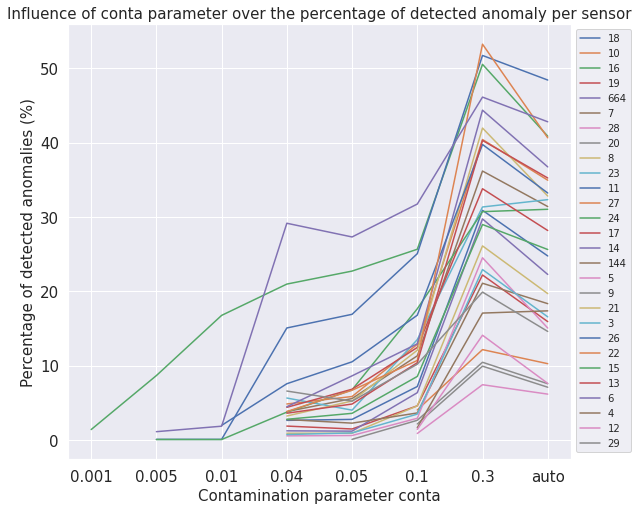

In [578]:
plt.figure(figsize=(9, 8))
for i,asset in enumerate(dict_percentageIF):
    plt.plot(conta_hyper, dict_percentageIF[asset], label=asset,color=colors[i])
    plt.title("Influence of conta parameter over the percentage of detected anomaly per sensor")
    plt.ylabel("Percentage of detected anomalies (%)")
    plt.xlabel("Contamination parameter conta")
plt.legend(bbox_to_anchor=(1,1), loc="upper left", fontsize= 10)
plt.savefig("graphs/conta_influence",bbox_inches="tight")
plt.show()

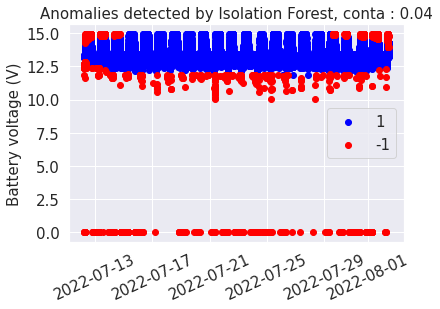

In [744]:
score_if,pred_if,outlier_values_if = isolationForest(noWeirdDateSorted, 0.04, X)
plot_outlier_IF(noWeirdDateSorted,pred_if,0.04,False,"")
#score_ifNoZeros,pred_ifNoZeros,outlier_values_ifNoZeros = isolationForest(noWeirdDateSortedWithoutZeros, 0.011)

### Evaluation

In [745]:
def anomalyScoreTable(df, score, predictions, algo):
    data_scores = pd.DataFrame(list(zip(df["Timestamp"],df["AssetId"],df["BatteryVoltage(V)"],score,predictions)),columns = ['Timestamp','AssetId','BatteryVoltage(V)','AnomalyScore_{}'.format(algo),'Anomaly_{}?'.format(algo)])
    data_scores["Anomaly_{}?".format(algo)] = data_scores["Anomaly_{}?".format(algo)].map({-1: True, 1: False}) 
    return data_scores

In [747]:
# The lower, the more abnormal. Negative scores represent outliers, positive scores represent inliers.
anomalyScores_IF = anomalyScoreTable(noWeirdDateSorted,score_if,pred_if,"IF")
#anomalyScores_IFNoZeros = anomalyScoreTable(noWeirdDateSortedWithoutZeros,score_ifNoZeros,pred_ifNoZeros,"IF")

In [748]:
evaluationDF_IF = evaluationtable(outlier_values_if,noWeirdDateSorted,"IF")
evaluationDF_IF

,NumberOfAnomalies_IF,PercentageOfAnomalies_IF(%)
15,38,2.773723
18,104,2.298343
5,10,0.454752
8,12,0.513479
664,37,0.76557
17,125,4.683402
11,225,16.531962
27,NaN,NaN
14,124,4.903124
13,59,3.310887


In [1374]:
anomalyScores_IF

,Timestamp,AssetId,BatteryVoltage(V),AnomalyScore_IF,Anomaly_IF?
0,1657604242,18,12.539062,0.007176,False
1,1657604332,10,12.539062,0.007176,False
2,1657604374,18,12.480469,-0.007010,True
3,1657604379,10,12.480469,-0.007010,True
4,1657604438,18,12.656250,0.019427,False
...,...,...,...,...,...
62917,1659435522,21,14.238281,0.041033,False
62918,1659435527,20,13.300781,0.073407,False
62919,1659435532,14,14.765625,-0.008502,True
62920,1659435541,27,13.359375,0.076151,False


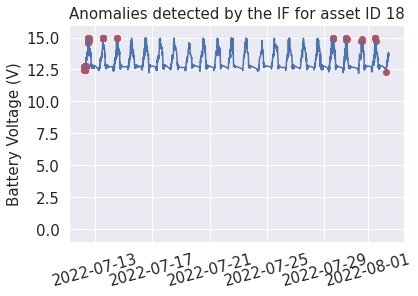

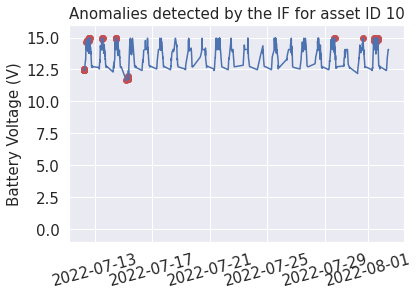

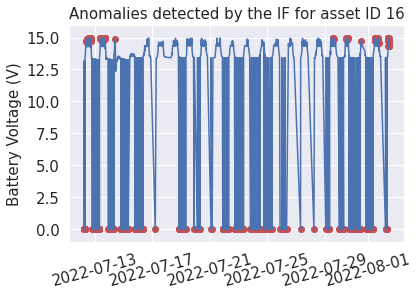

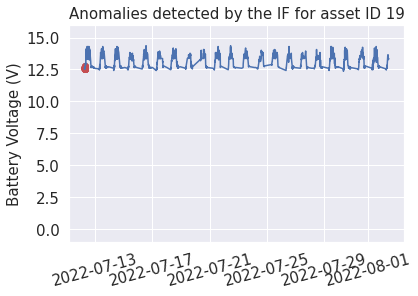

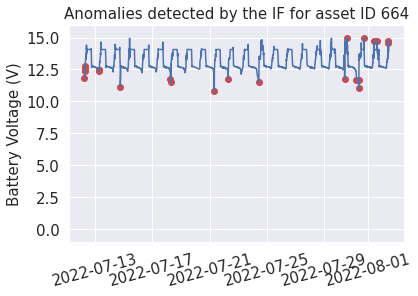

...

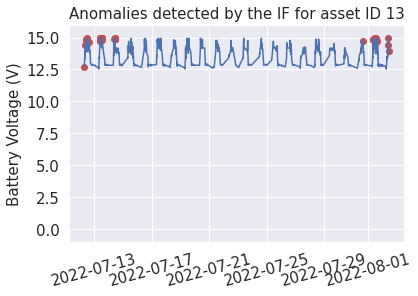

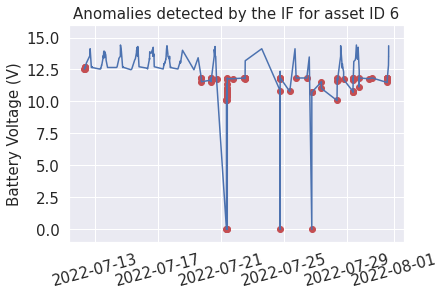

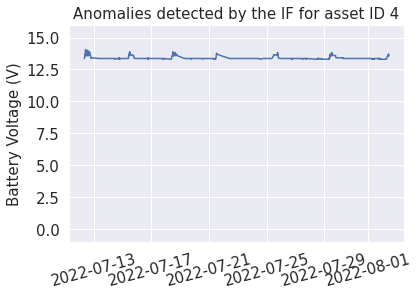

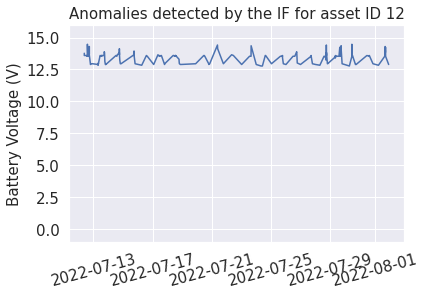

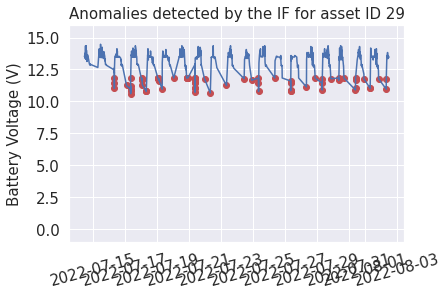

In [981]:
detected_anomalies(noWeirdDateSorted,anomalyScores_IF,"IF","detectedAnomalies/")

# Local Outlier Factor

In [211]:
def localOutlier(df, conta, n,X):
    clf = LocalOutlierFactor(n_neighbors=n, contamination=conta)

    y_pred = clf.fit_predict(X)
    X_scores = clf.negative_outlier_factor_
    
    outlier_index = np.where(y_pred == -1)
    outlier_values = df.iloc[outlier_index]
    
    
    return y_pred,X_scores,outlier_values

In [206]:
def plot_scores(X,X_scores,df):
    dates=[dt.datetime.fromtimestamp(ts) for ts in list(df['Timestamp'])]
    fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
    plt.title("Local Outlier Factor (LOF)")
    plt.scatter(dates,X[:,1], edgecolor='grey', s=30, label='Data points',facecolors='none') #plotting circles with radius proportional to the outlier scores
    radius = (X_scores.max() - X_scores) / (X_scores.max() - X_scores.min())
    plt.scatter(dates,X[:,1], s=1300 * radius, edgecolors='pink',facecolors='none', label='Outlier scores')
    plt.axis('tight')
    legend = plt.legend(loc='upper left')
    legend.legendHandles[0]._sizes = [10]
    legend.legendHandles[1]._sizes = [20]
    plt.show()
    

In [587]:
def plot_outliers_lof(conta,y_pred,X,df,k,save,PATH):
    dates=[dt.datetime.fromtimestamp(ts) for ts in list(df['Timestamp'])]
    
    fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
    plt.title("Anomalies detected by the Local Outlier Factor (LOF), conta : {}, k : {}".format(conta,k))
    lofs_index = np.where(y_pred==-1)
    values = X[lofs_index]
    dates_ou=[dt.datetime.fromtimestamp(ts) for ts in list(df['Timestamp'].loc[lofs_index])]
    plt.scatter(dates, X[:,1], label="normal")
    plt.scatter(dates_ou,values[:,1], color='r', label = "outlier")
    plt.ylabel("BatteryVoltage(V)")
    plt.legend()

    if save :
        if not os.path.exists(PATH):
            os.mkdir(PATH)
        contaminationstr = str(conta)[2:]
        plt.savefig(PATH + "outliersLOF{}_{}".format(k,contaminationstr), bbox_inches = "tight")


    
    plt.show()

### Hyperparameter search

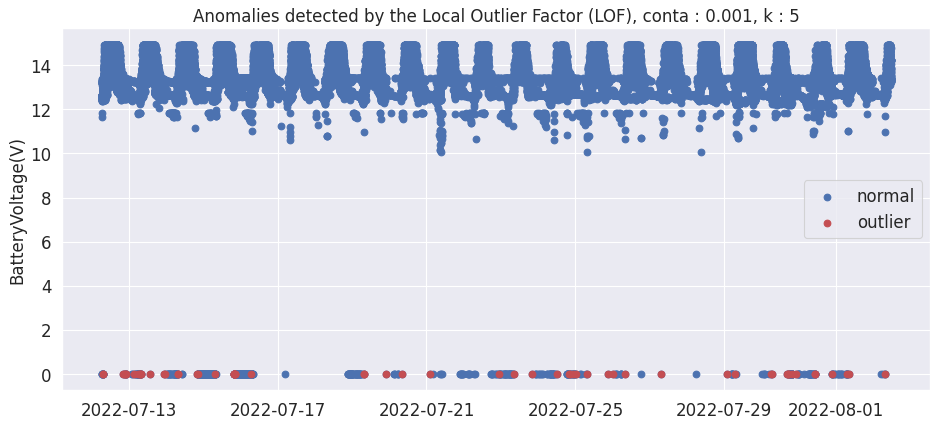

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          1                     0.016929
22                        NaN                          NaN
16                         62                     1.838671
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

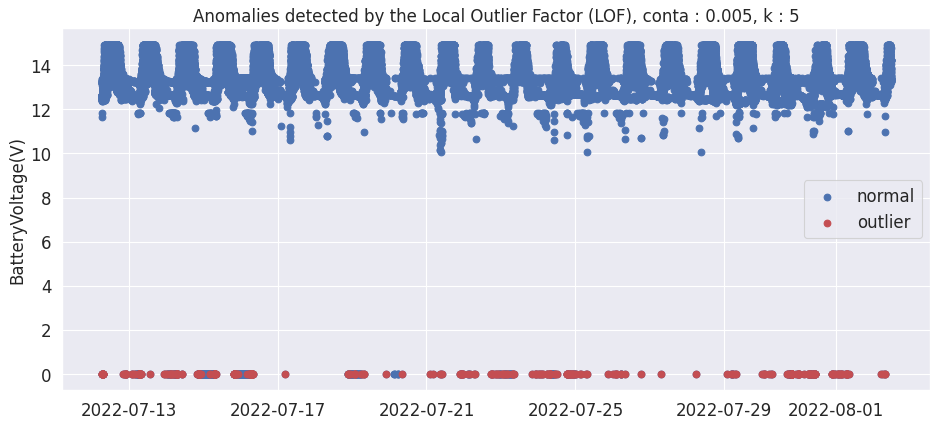

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        306                     9.074733
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

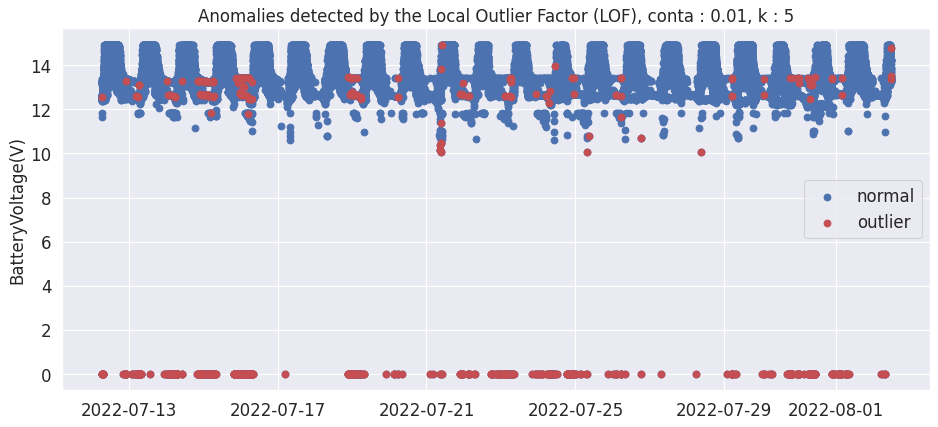

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                          2                     0.044199
5                           1                     0.045475
8                           1                      0.04279
664                        70                     1.448376
17                          1                     0.037467
11                          5                     0.367377
27                          3                     0.126103
14                          3                     0.118624
13                          1                     0.056117
24                          5                     0.084645
22                        NaN                          NaN
16                        489                    14.501779
21                          3                     0.099437
9                           1                     0.025113
4                         NaN                          N

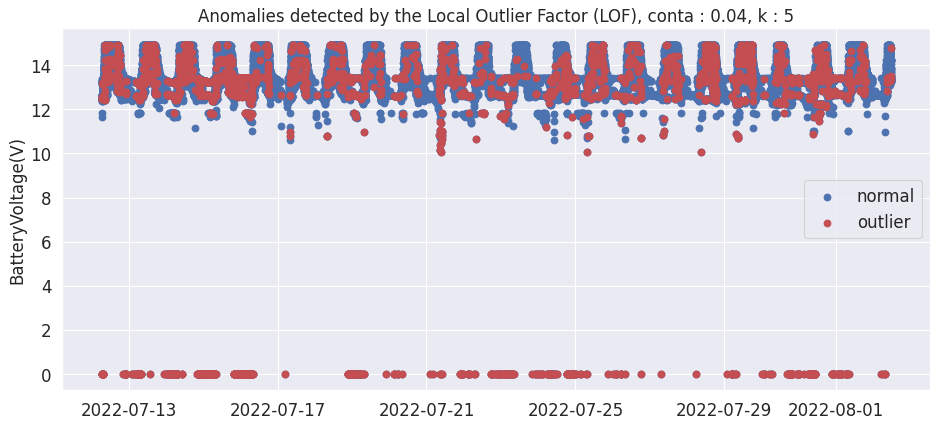

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         38                     2.773723
18                        104                     2.298343
5                          45                     2.046385
8                          63                     2.695764
664                       344                     7.117732
17                         53                     1.985762
11                         60                     4.408523
27                         70                     2.942413
14                         73                     2.886516
13                         32                     1.795735
24                        144                     2.437786
22                         47                     2.989822
16                        734                    21.767497
21                         91                     3.016241
9                          66                     1.657459
4                           7                     1.0479

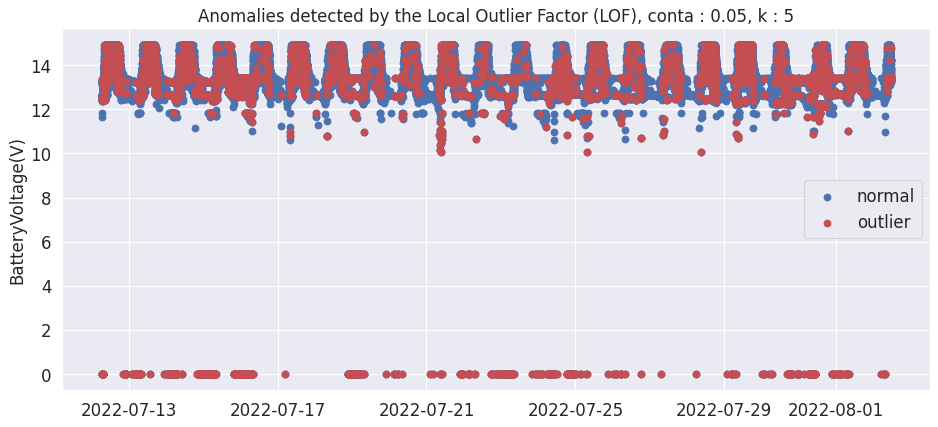

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         53                     3.868613
18                        145                      3.20442
5                          65                     2.955889
8                          83                     3.551562
664                       379                      7.84192
17                         76                     2.847508
11                         71                     5.216752
27                         86                     3.614964
14                        110                     4.349545
13                         48                     2.693603
24                        200                     3.385813
22                         65                      4.13486
16                        778                    23.072361
21                        119                     3.944316
9                         100                     2.511301
4                          14                     2.0958

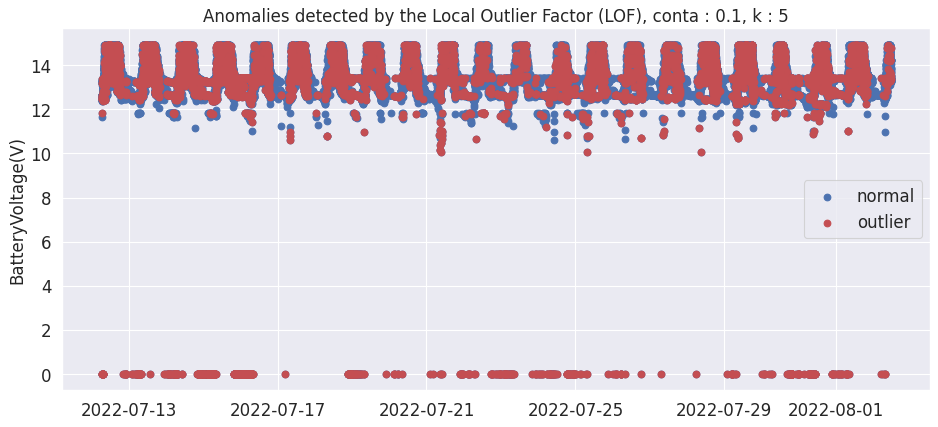

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        117                     8.540146
18                        361                     7.977901
5                         175                     7.958163
8                         193                     8.258451
664                       558                    11.545624
17                        221                     8.280255
11                        158                    11.609111
27                        216                     9.079445
14                        257                    10.162119
13                        140                     7.856341
24                        498                     8.430675
22                        153                     9.732824
16                        946                    28.054567
21                        273                     9.048724
9                         287                     7.207433
4                          39                     5.8383

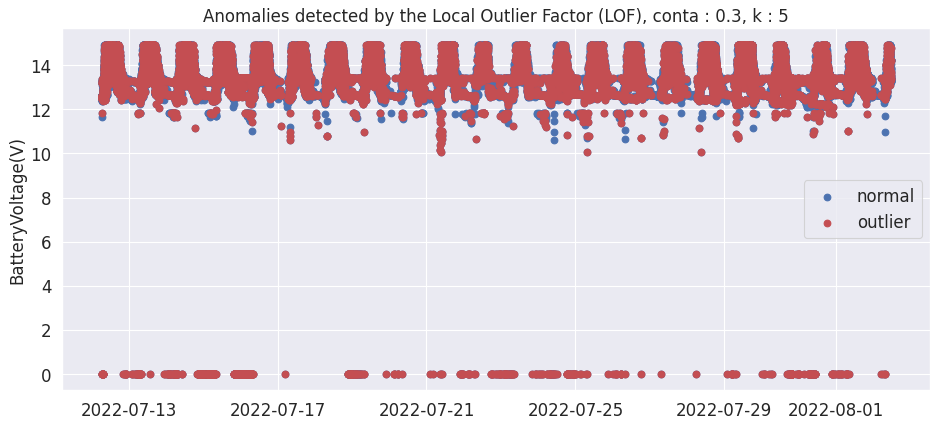

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        385                     28.10219
18                       1284                    28.375691
5                         621                    28.240109
8                         685                    29.311083
664                      1401                    28.988206
17                        778                    29.149494
11                        448                    32.916973
27                        661                    27.784784
14                        792                    31.316726
13                        493                    27.665544
24                       1660                    28.102252
22                        485                    30.852417
16                       1576                    46.737841
21                        913                     30.26185
9                        1106                    27.774987
4                         183                     27.395

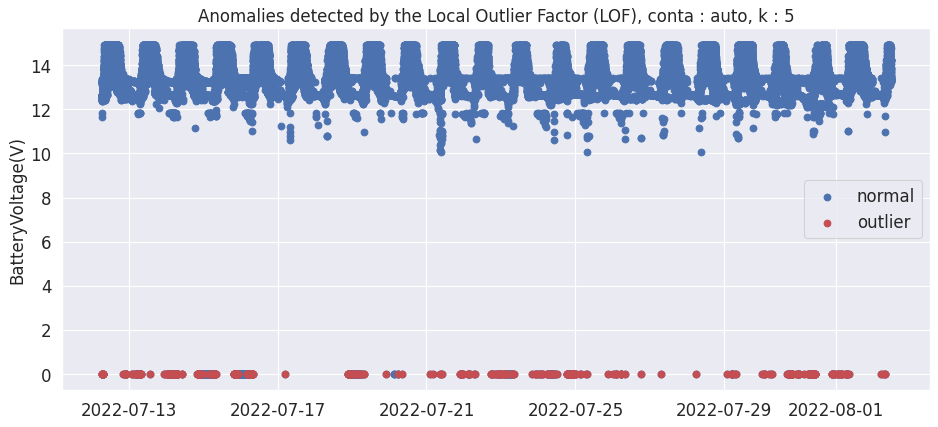

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        363                    10.765125
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

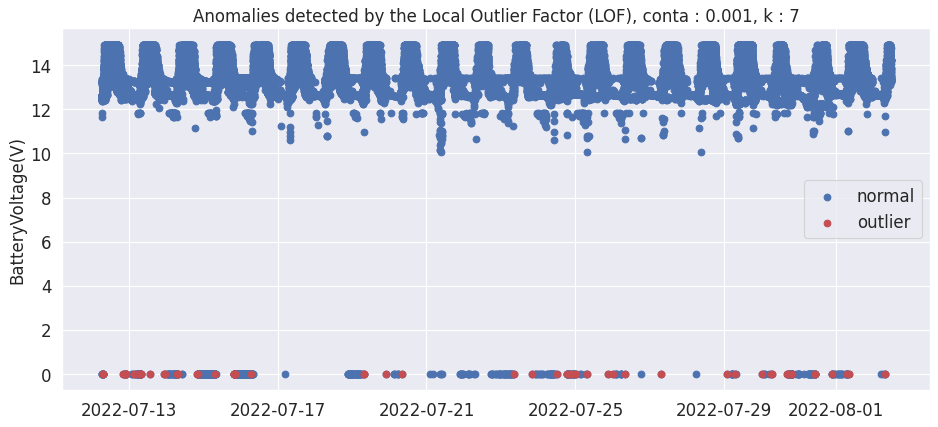

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          1                     0.016929
22                        NaN                          NaN
16                         62                     1.838671
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

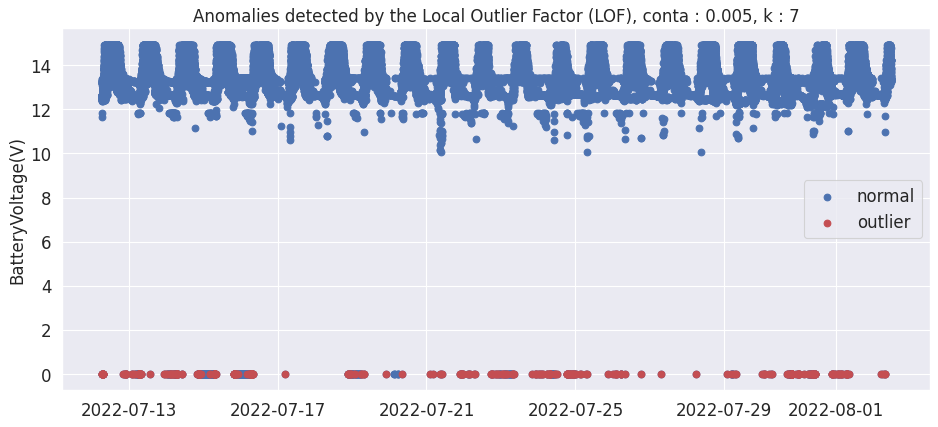

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        306                     9.074733
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

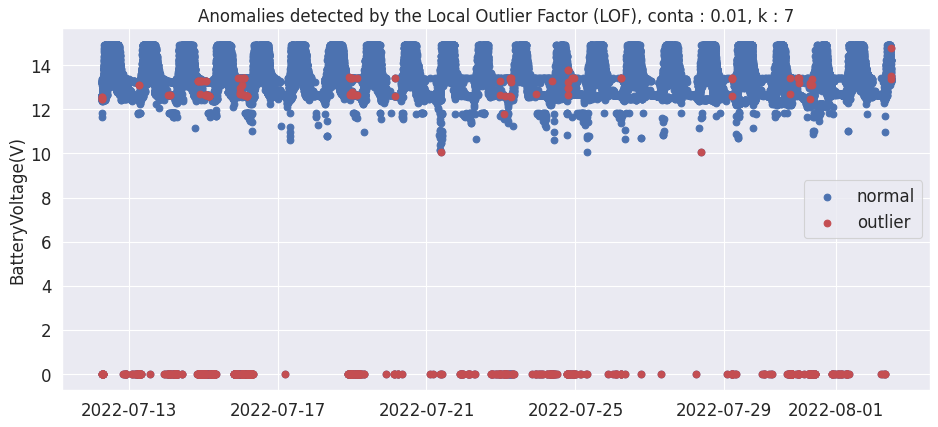

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                          1                     0.072993
18                          4                     0.088398
5                           1                     0.045475
8                         NaN                          NaN
664                        35                     0.724188
17                          2                     0.074934
11                          2                     0.146951
27                          4                     0.168138
14                          2                     0.079083
13                          1                     0.056117
24                          4                     0.067716
22                          1                     0.063613
16                        545                    16.162515
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

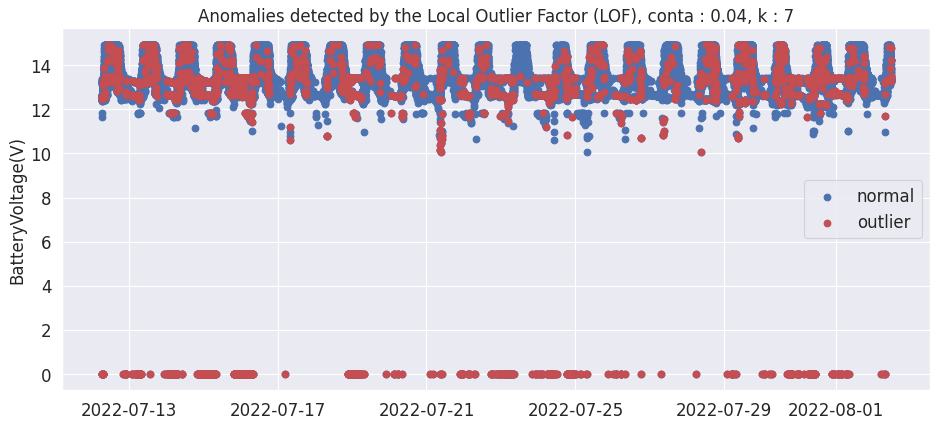

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         27                     1.970803
18                        107                     2.364641
5                          32                     1.455207
8                          53                     2.267865
664                       409                     8.462653
17                         47                     1.760959
11                         68                     4.996326
27                         71                     2.984447
14                         64                     2.530645
13                         28                     1.571268
24                        116                     1.963772
22                         38                     2.417303
16                        815                    24.169632
21                         71                     2.353331
9                          54                     1.356102
4                          11                     1.6467

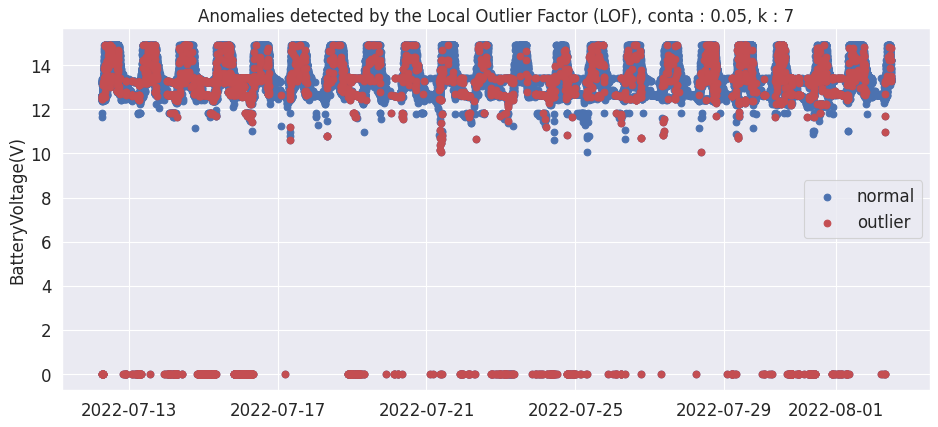

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         38                     2.773723
18                        145                      3.20442
5                          59                     2.683038
8                          68                     2.909713
664                       453                      9.37306
17                         69                     2.585238
11                         81                     5.951506
27                         98                     4.119378
14                        101                     3.993673
13                         38                     2.132435
24                        178                     3.013374
22                         54                     3.435115
16                        845                    25.059312
21                        107                     3.546569
9                          92                     2.310397
4                          15                     2.2455

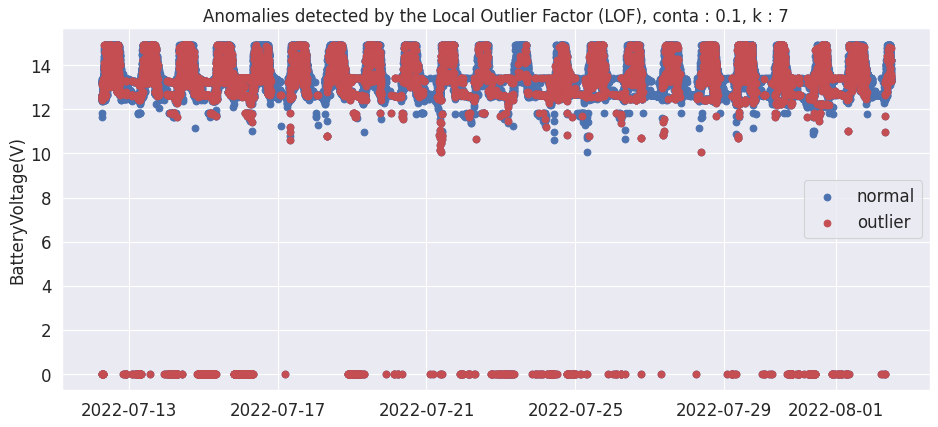

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        116                     8.467153
18                        344                      7.60221
5                         169                     7.685312
8                         192                     8.215661
664                       624                    12.911235
17                        177                     6.631697
11                        170                    12.490816
27                        220                     9.247583
14                        248                     9.806248
13                        110                      6.17284
24                        497                     8.413746
22                        155                     9.860051
16                        985                    29.211151
21                        259                     8.584687
9                         278                     6.981416
4                          38                     5.6886

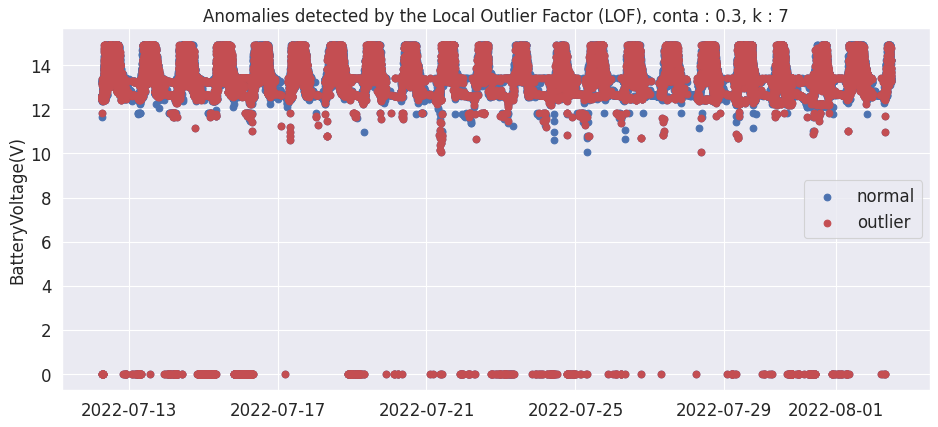

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        406                    29.635036
18                       1252                    27.668508
5                         601                    27.330605
8                         674                    28.840394
664                      1379                    28.533002
17                        732                    27.426002
11                        449                    32.990448
27                        694                    29.171921
14                        781                    30.881771
13                        452                    25.364759
24                       1638                    27.729812
22                        485                    30.852417
16                       1572                    46.619217
21                        897                    29.731521
9                        1084                    27.222501
4                         198                    29.6407

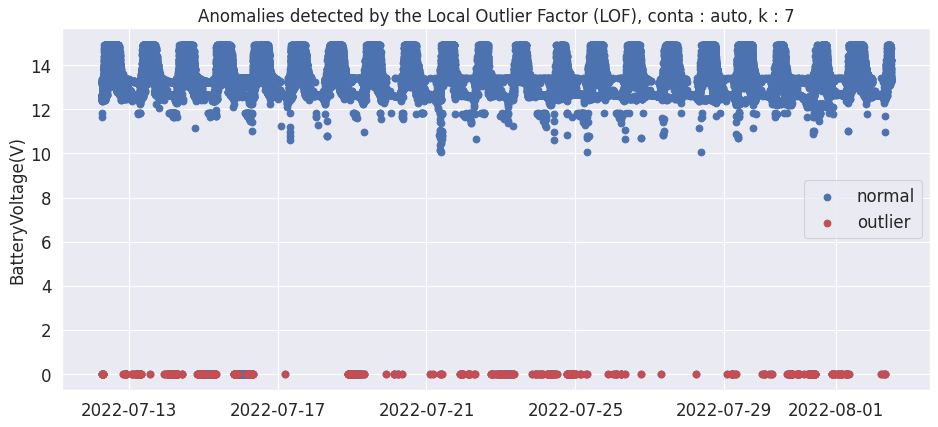

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        399                     11.83274
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

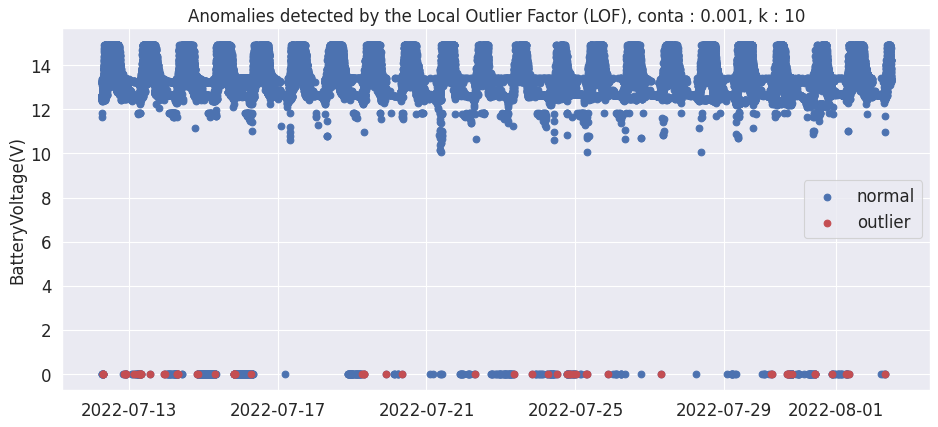

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          1                     0.016929
22                        NaN                          NaN
16                         62                     1.838671
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

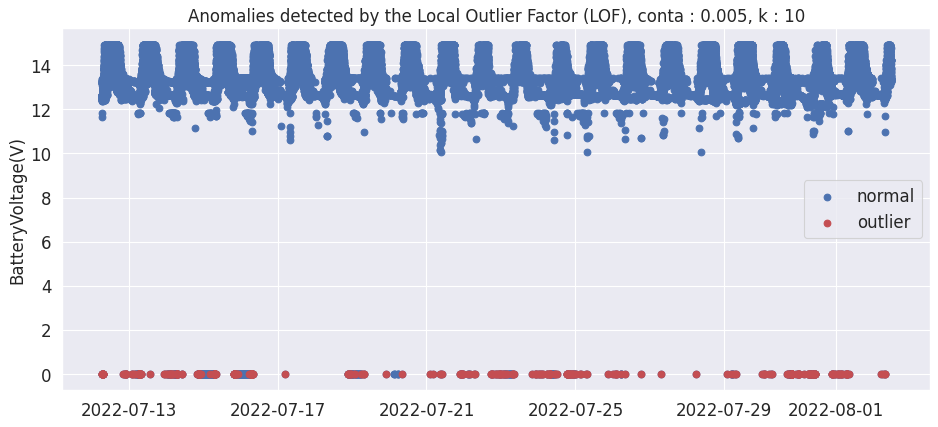

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        306                     9.074733
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

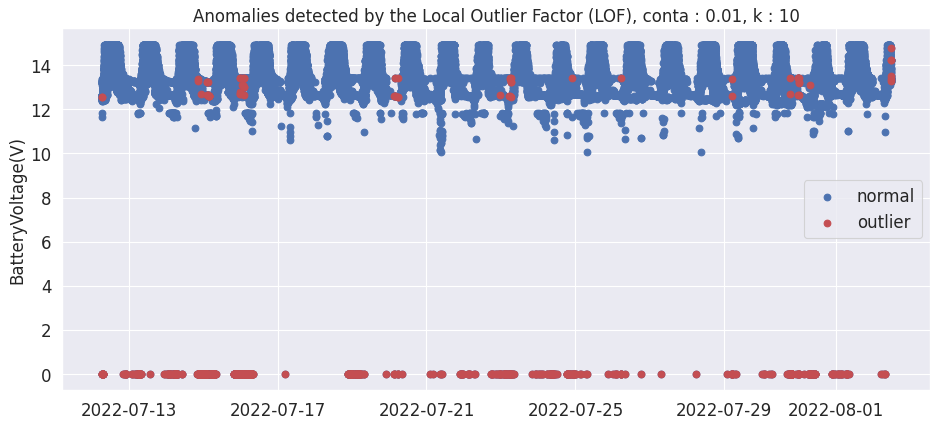

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                          3                     0.066298
5                         NaN                          NaN
8                         NaN                          NaN
664                        22                     0.455204
17                        NaN                          NaN
11                          1                     0.073475
27                          3                     0.126103
14                          2                     0.079083
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        563                    16.696323
21                          2                     0.066291
9                           2                     0.050226
4                         NaN                          N

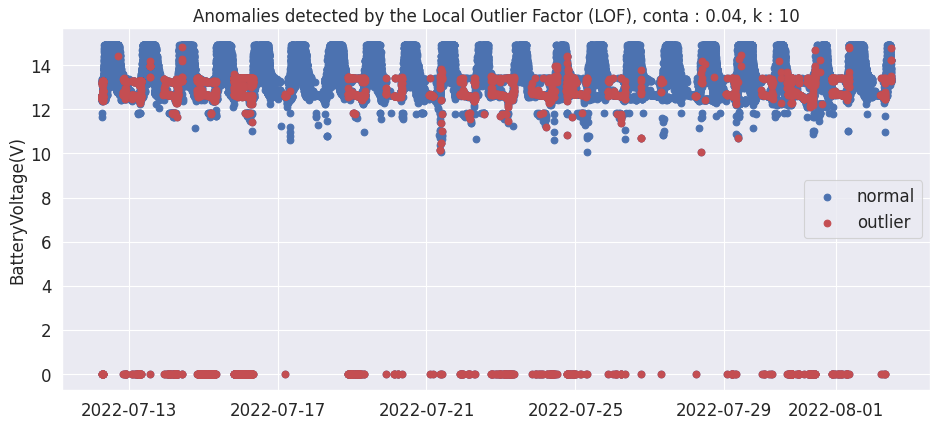

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         22                     1.605839
18                        111                     2.453039
5                          48                      2.18281
8                          36                     1.540436
664                       567                    11.731844
17                         45                     1.686025
11                         59                     4.335048
27                         59                     2.480034
14                         47                     1.858442
13                         29                     1.627385
24                        112                     1.896056
22                         31                      1.97201
16                        883                     26.18624
21                         63                     2.088167
9                          61                     1.531894
4                          12                     1.7964

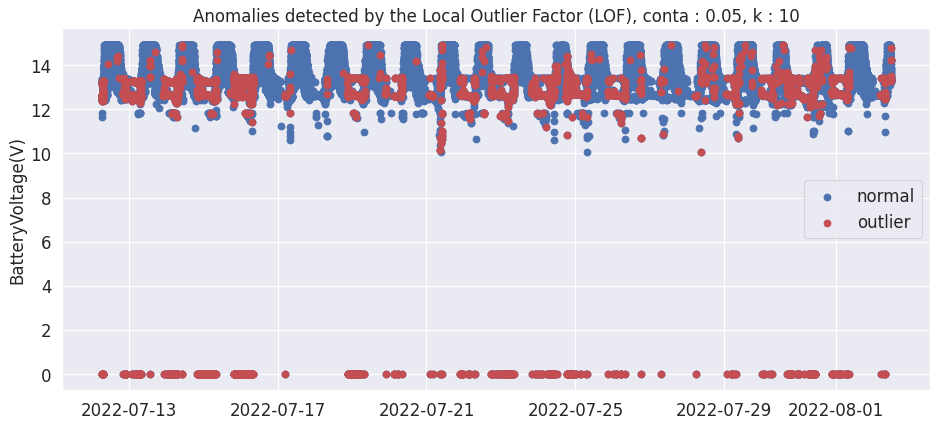

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         32                     2.335766
18                        153                     3.381215
5                          65                     2.955889
8                          54                     2.310655
664                       703                    14.545831
17                         65                     2.435369
11                         88                     6.465834
27                         83                     3.488861
14                         69                     2.728351
13                         37                     2.076319
24                        166                     2.810225
22                         43                     2.735369
16                        921                    27.313167
21                         89                      2.94995
9                          94                     2.360623
4                          14                     2.0958

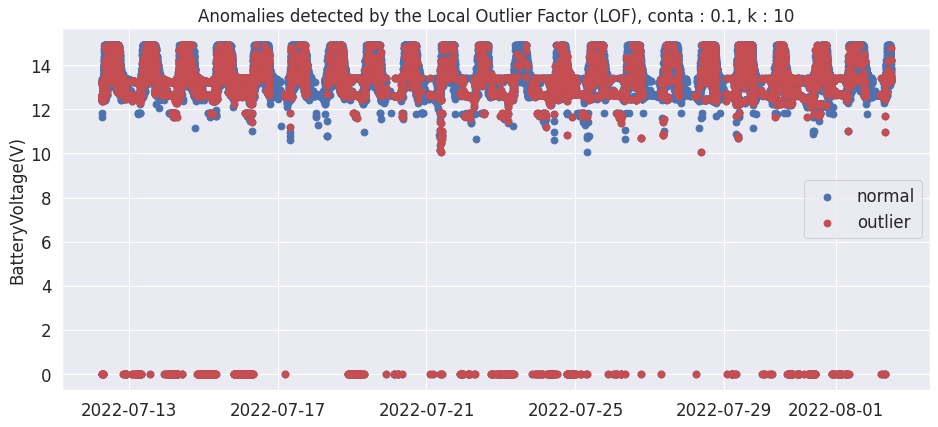

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         96                     7.007299
18                        374                     8.265193
5                         160                     7.276035
8                         156                     6.675225
664                       943                     19.51169
17                        186                     6.968902
11                        183                    13.445996
27                        208                     8.743169
14                        216                     8.540925
13                        123                     6.902357
24                        445                     7.533435
22                        142                     9.033079
16                       1060                     31.43535
21                        249                     8.253232
9                         271                     6.805625
4                          54                     8.0838

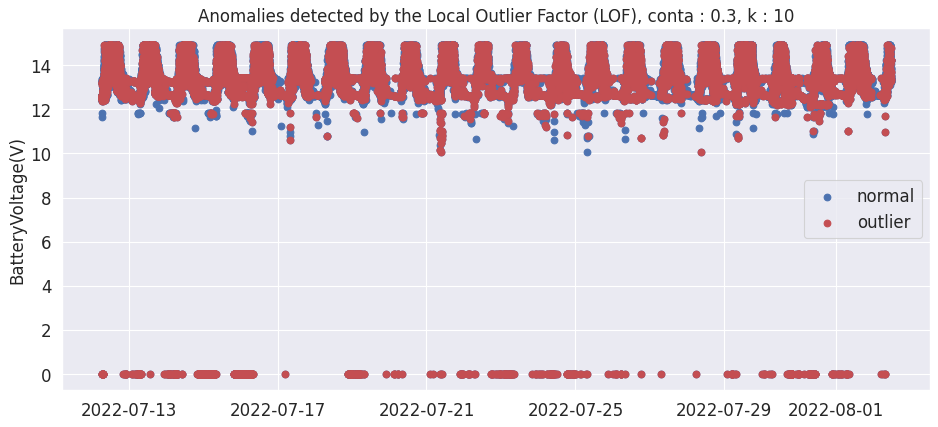

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        394                    28.759124
18                       1262                    27.889503
5                         594                    27.012278
8                         643                    27.513907
664                      1676                    34.678254
17                        775                    29.037093
11                        448                    32.916973
27                        714                     30.01261
14                        749                    29.616449
13                        513                    28.787879
24                       1579                    26.730997
22                        488                    31.043257
16                       1554                    46.085409
21                        897                    29.731521
9                        1069                    26.845806
4                         183                     27.395

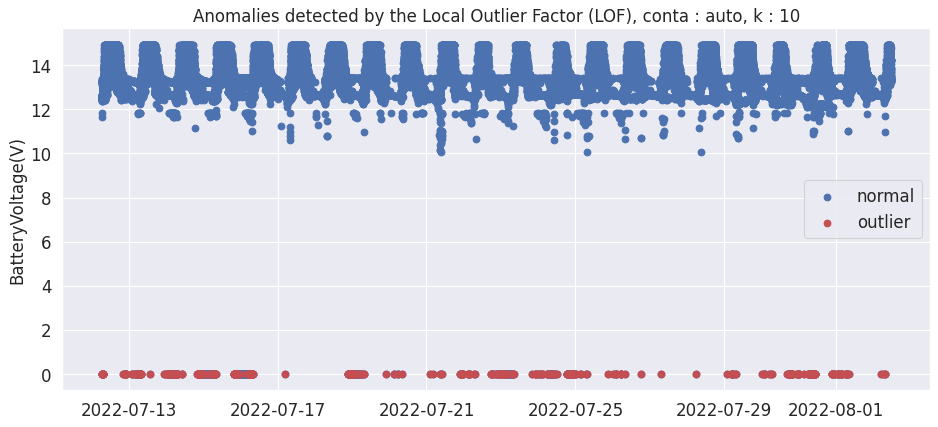

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        397                    11.773428
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

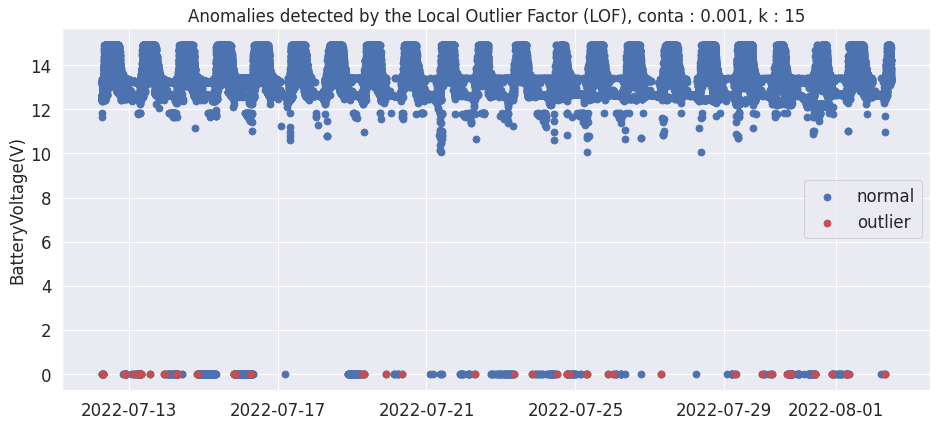

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          1                     0.016929
22                        NaN                          NaN
16                         62                     1.838671
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

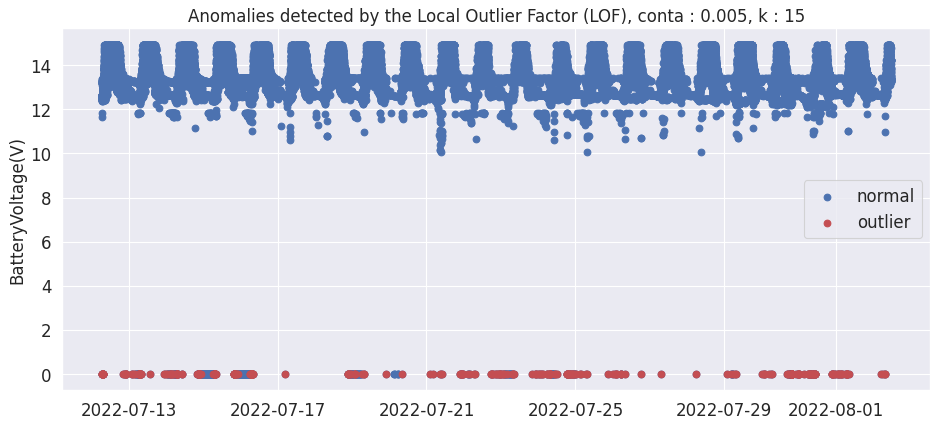

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        306                     9.074733
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

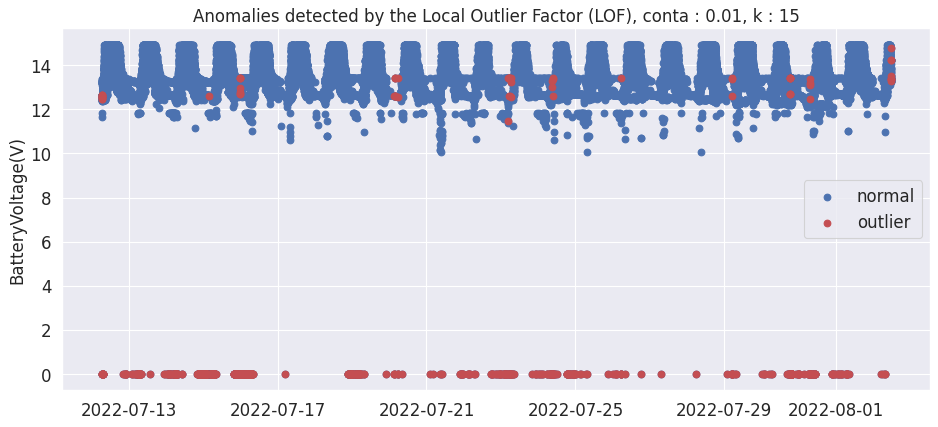

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                          1                     0.072993
18                          8                     0.176796
5                           2                      0.09095
8                           1                      0.04279
664                        10                     0.206911
17                        NaN                          NaN
11                          2                     0.146951
27                          4                     0.168138
14                          2                     0.079083
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        563                    16.696323
21                          2                     0.066291
9                         NaN                          NaN
4                         NaN                          N

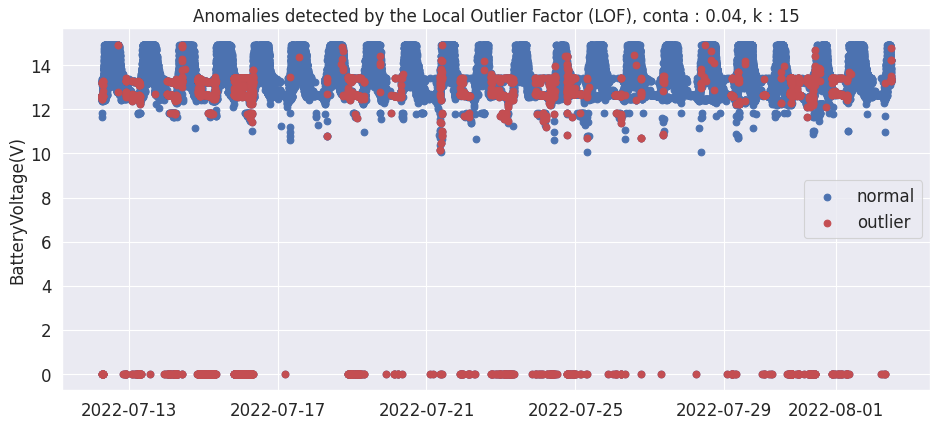

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         25                     1.824818
18                        139                     3.071823
5                          30                     1.364256
8                          37                     1.583226
664                       605                    12.518105
17                         36                      1.34882
11                         75                     5.510654
27                         66                     2.774275
14                         51                     2.016607
13                         15                     0.841751
24                         60                     1.015744
22                         27                     1.717557
16                        897                    26.601423
21                         58                      1.92244
9                          58                     1.456554
4                          13                     1.9461

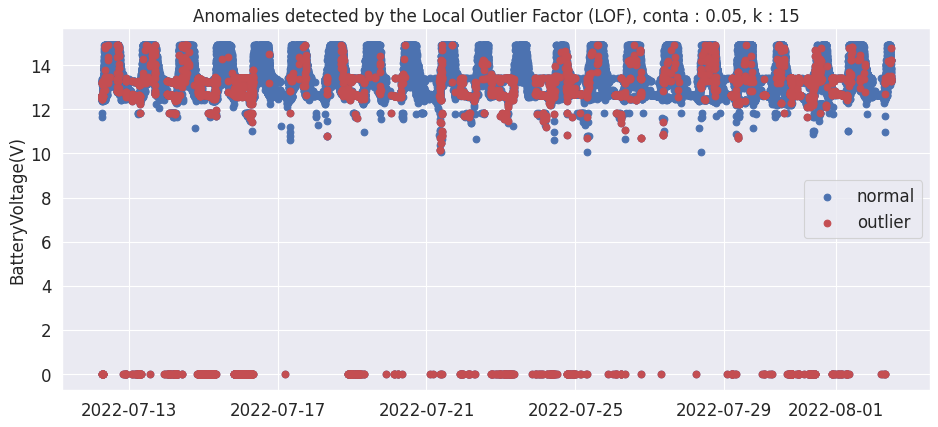

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         38                     2.773723
18                        181                          4.0
5                          54                     2.455662
8                          61                     2.610184
664                       659                    13.635423
17                         66                     2.472836
11                         90                     6.612785
27                        102                     4.287516
14                         80                     3.163306
13                         24                     1.346801
24                        114                     1.929914
22                         53                     3.371501
16                        924                    27.402135
21                         89                      2.94995
9                          91                     2.285284
4                          16                      2.395

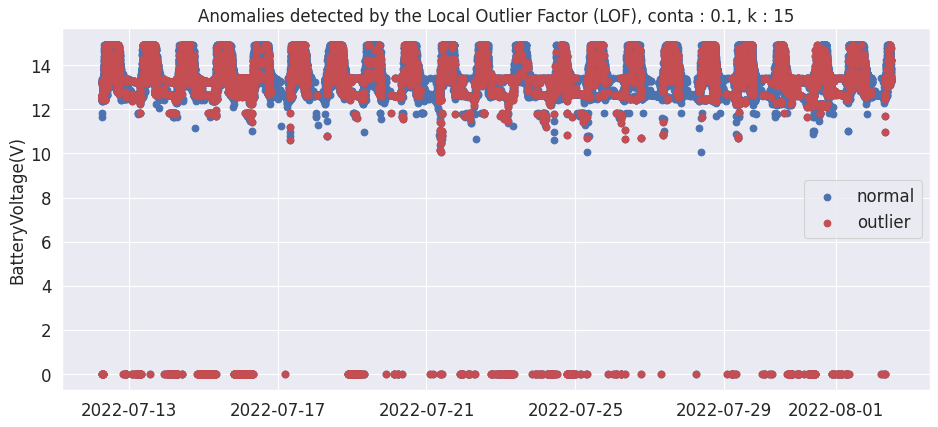

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        105                     7.664234
18                        398                      8.79558
5                         168                     7.639836
8                         191                     8.172871
664                       824                    17.049452
17                        193                     7.231173
11                        190                    13.960323
27                        237                     9.962169
14                        218                     8.620008
13                        106                     5.948373
24                        414                     7.008634
22                        154                     9.796438
16                       1069                    31.702254
21                        256                      8.48525
9                         257                     6.454043
4                          46                     6.8862

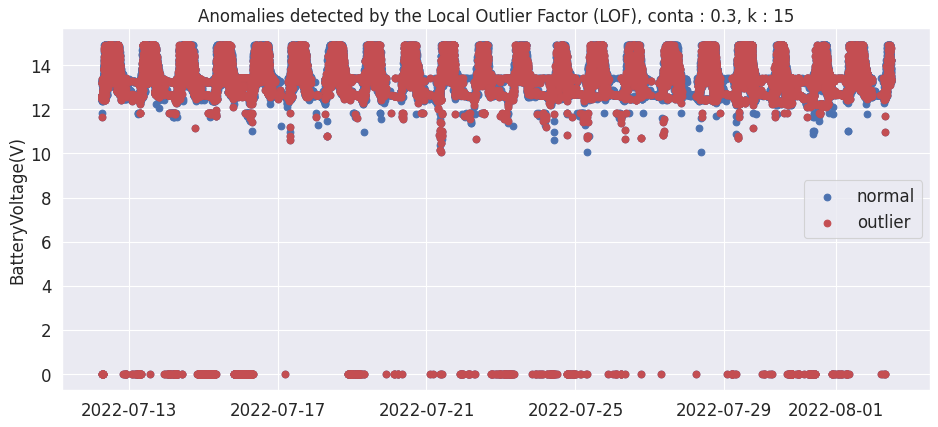

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        397                    28.978102
18                       1332                    29.436464
5                         617                    28.058208
8                         680                    29.097133
664                      1511                    31.264225
17                        737                    27.613338
11                        454                    33.357825
27                        713                    29.970576
14                        736                    29.102412
13                        455                    25.533109
24                       1599                    27.069578
22                        458                     29.13486
16                       1579                    46.826809
21                        883                    29.267484
9                        1130                      28.3777
4                         185                    27.6946

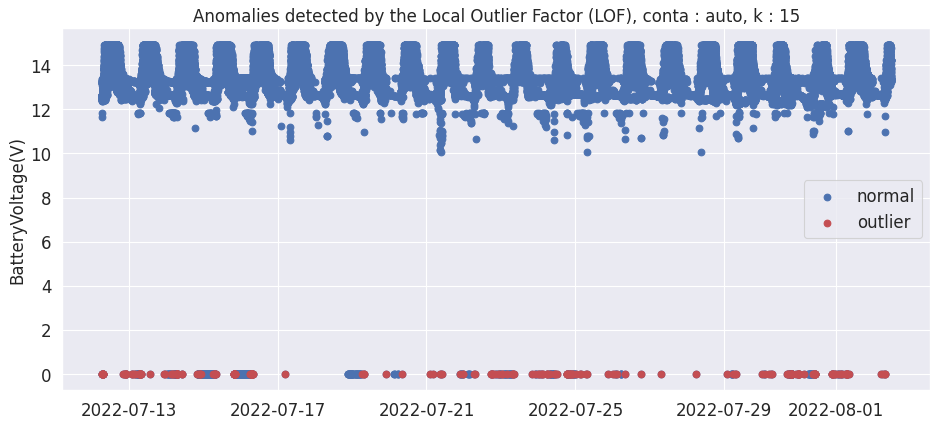

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        203                     6.020166
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

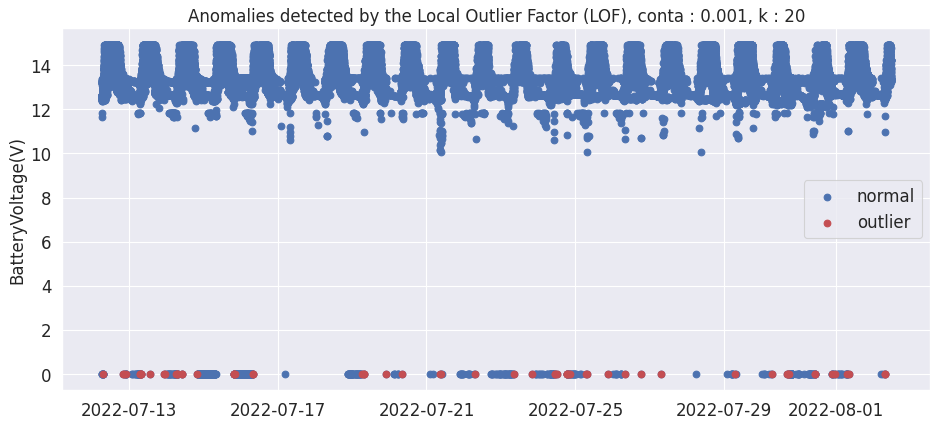

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                        NaN                          NaN
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                        NaN                          NaN
14                        NaN                          NaN
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                         56                     1.660735
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

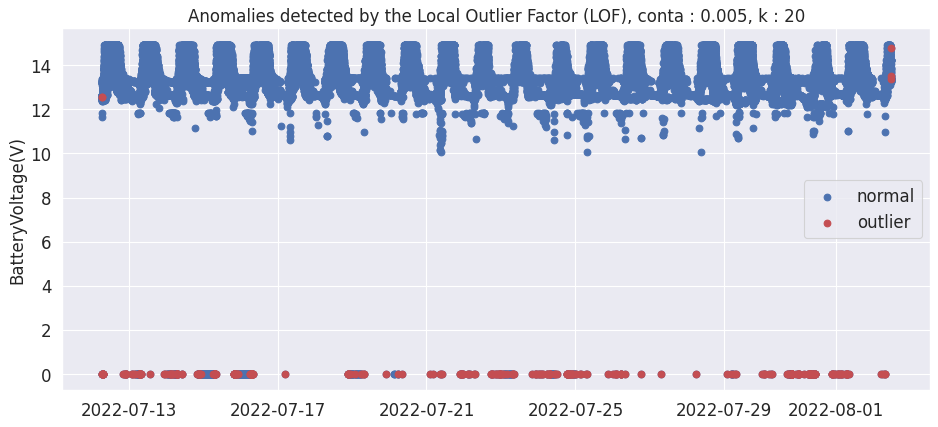

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                          1                     0.022099
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                          1                     0.042034
14                          1                     0.039541
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        301                     8.926453
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

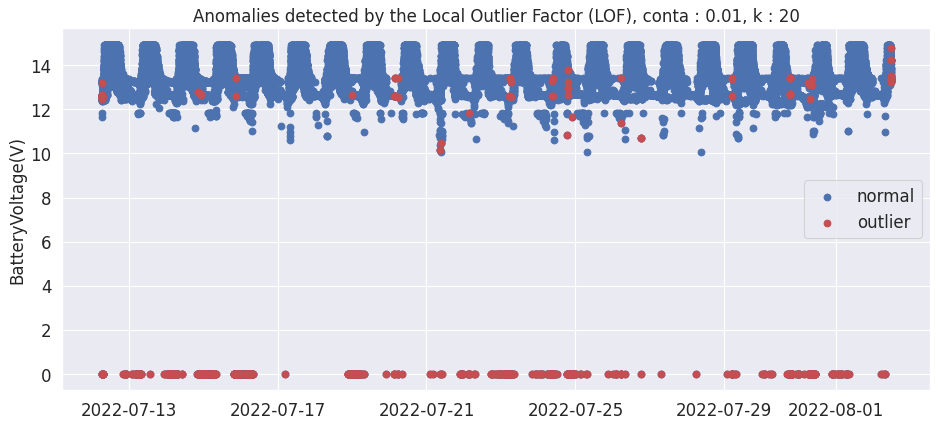

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                          9                     0.198895
5                           3                     0.136426
8                           1                      0.04279
664                        17                     0.351748
17                          2                     0.074934
11                          4                     0.293902
27                          3                     0.126103
14                          2                     0.079083
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        545                    16.162515
21                          2                     0.066291
9                         NaN                          NaN
4                         NaN                          N

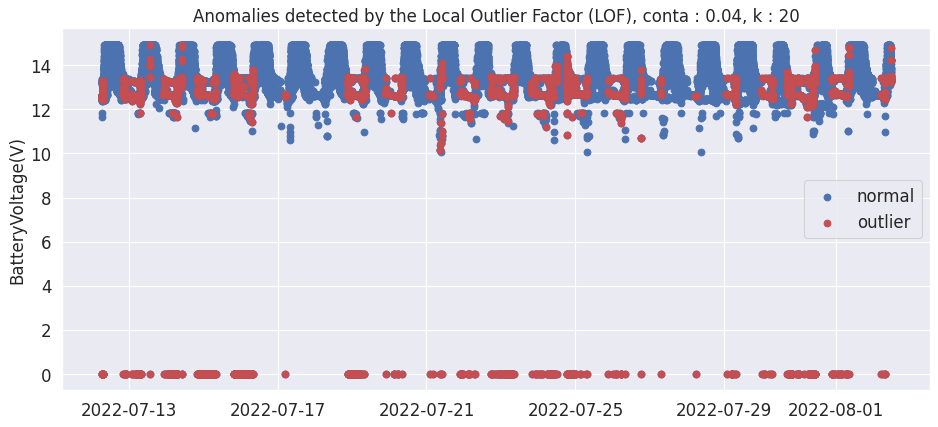

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         21                     1.532847
18                        117                     2.585635
5                          46                      2.09186
8                          36                     1.540436
664                       557                    11.524933
17                         47                     1.760959
11                         63                     4.628949
27                         59                     2.480034
14                         56                     2.214314
13                         31                     1.739618
24                        114                     1.929914
22                         35                     2.226463
16                        844                    25.029656
21                         60                     1.988731
9                          67                     1.682572
4                          13                     1.9461

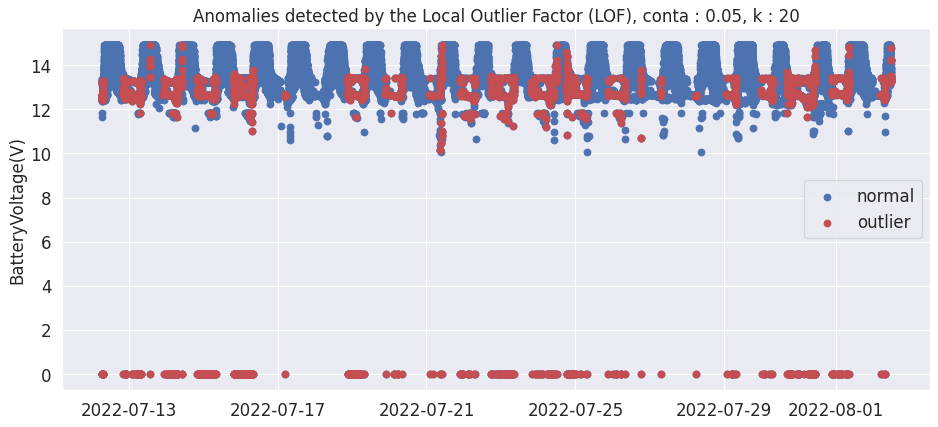

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         28                     2.043796
18                        154                     3.403315
5                          65                     2.955889
8                          54                     2.310655
664                       729                    15.083799
17                         68                     2.547771
11                         85                     6.245408
27                         80                     3.362757
14                         74                     2.926058
13                         37                     2.076319
24                        172                       2.9118
22                         42                     2.671756
16                        893                      26.4828
21                         83                     2.751077
9                          96                     2.410849
4                          14                     2.0958

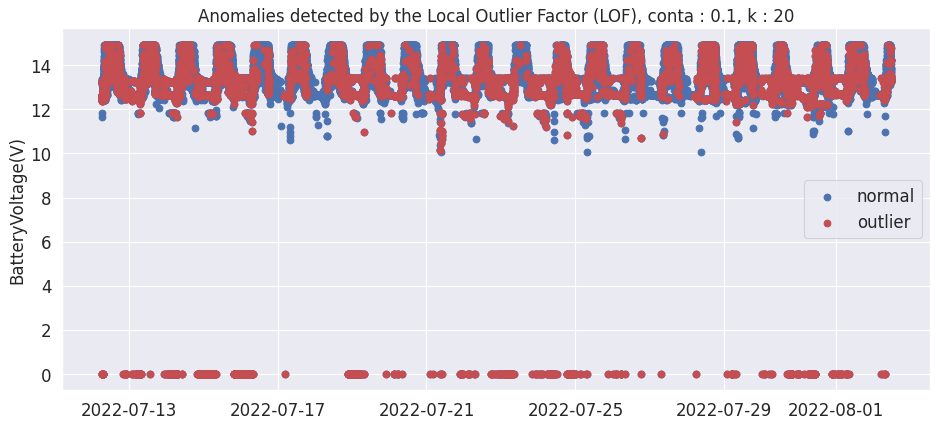

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         97                     7.080292
18                        373                     8.243094
5                         149                     6.775807
8                         169                     7.231493
664                      1081                     22.36706
17                        192                     7.193706
11                        169                     12.41734
27                        201                     8.448928
14                        210                     8.303677
13                         99                     5.555556
24                        435                     7.364144
22                        133                      8.46056
16                       1049                    31.109134
21                        255                     8.452105
9                         258                     6.479156
4                          49                     7.3353

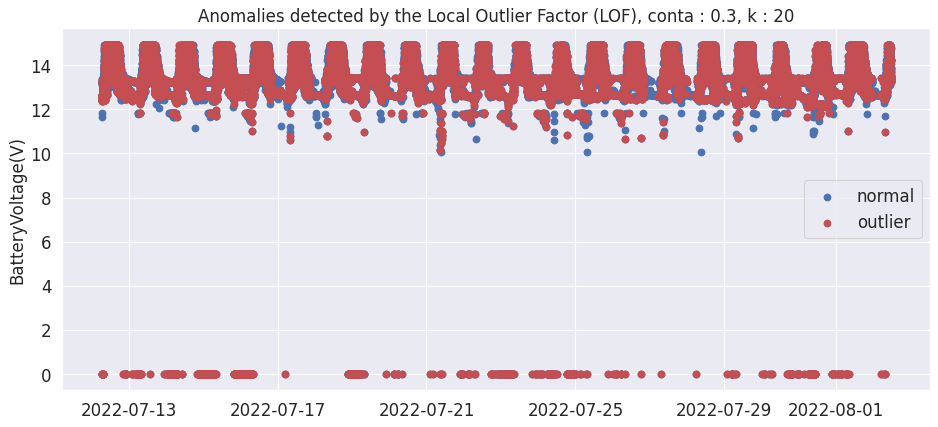

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        403                    29.416058
18                       1321                     29.19337
5                         587                    26.693952
8                         634                    27.128798
664                      1761                    36.436996
17                        760                    28.475084
11                        434                    31.888317
27                        723                    30.390921
14                        754                    29.814156
13                        453                    25.420875
24                       1558                    26.375487
22                        477                    30.343511
16                       1533                    45.462633
21                        891                    29.532648
9                        1105                    27.749874
4                         183                     27.395

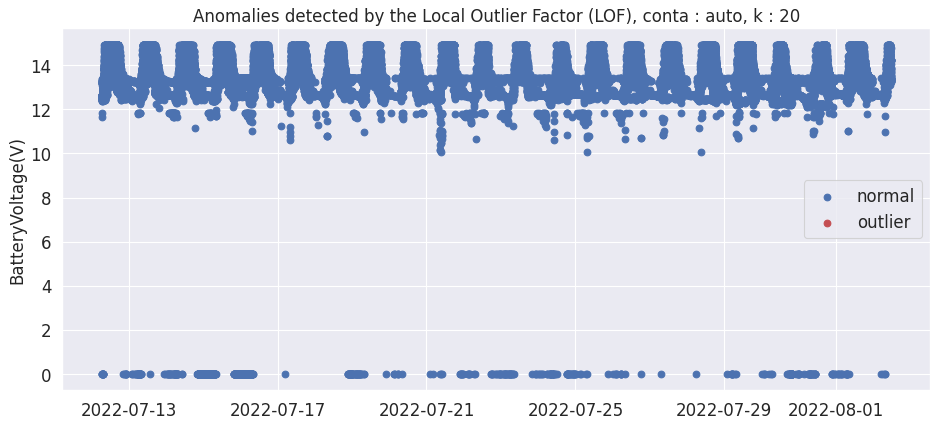

         NumberOfAnomalies_LOF  PercentageOfAnomalies_LOF(%)
15                         NaN                           NaN
18                         NaN                           NaN
5                          NaN                           NaN
8                          NaN                           NaN
664                        NaN                           NaN
17                         NaN                           NaN
11                         NaN                           NaN
27                         NaN                           NaN
14                         NaN                           NaN
13                         NaN                           NaN
24                         NaN                           NaN
22                         NaN                           NaN
16                         NaN                           NaN
21                         NaN                           NaN
9                          NaN                           NaN
4                       

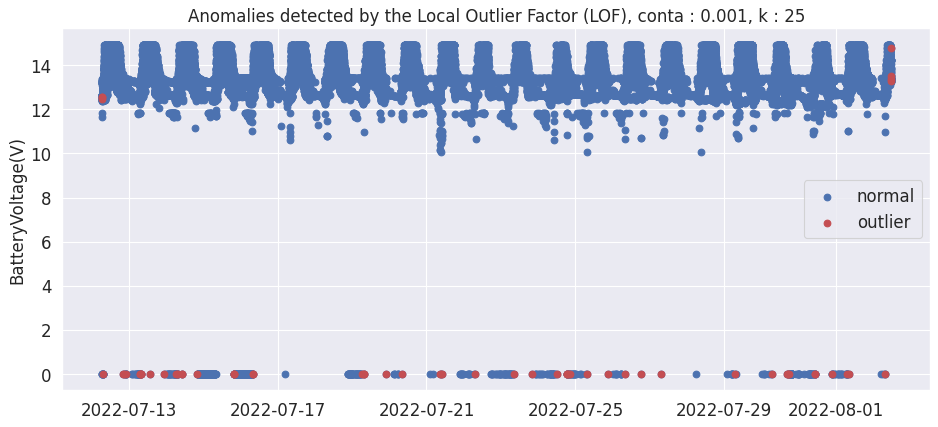

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                          2                     0.044199
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                          1                     0.042034
14                          1                     0.039541
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                         48                     1.423488
21                        NaN                          NaN
9                         NaN                          NaN
4                         NaN                          N

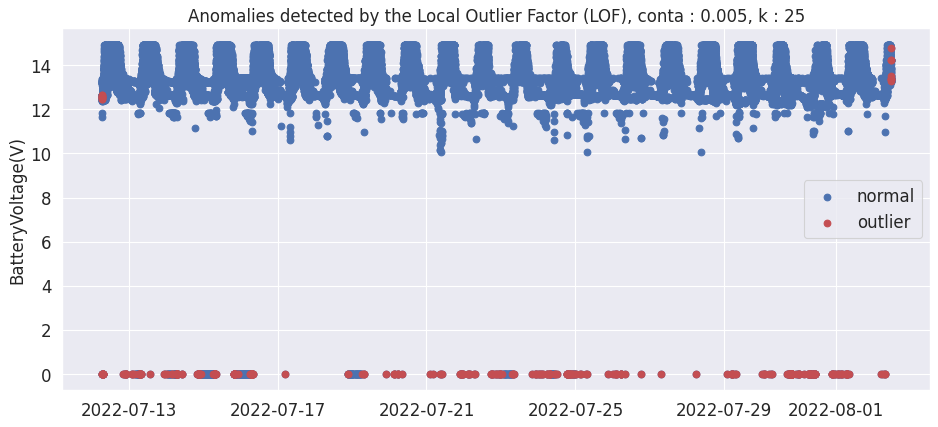

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                          5                     0.110497
5                         NaN                          NaN
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                          2                     0.084069
14                          1                     0.039541
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                        289                     8.570581
21                          2                     0.066291
9                         NaN                          NaN
4                         NaN                          N

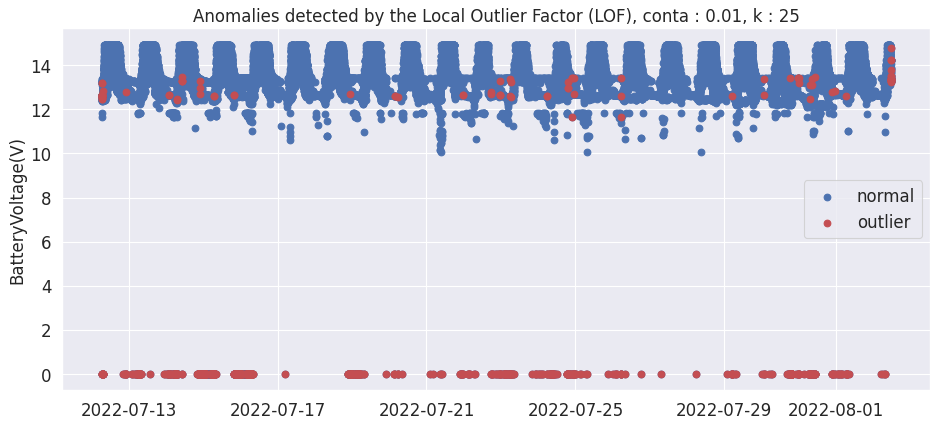

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                          1                     0.072993
18                         13                     0.287293
5                           3                     0.136426
8                           3                      0.12837
664                        20                     0.413822
17                          3                     0.112402
11                          2                     0.146951
27                          5                     0.210172
14                          2                     0.079083
13                          2                     0.112233
24                          6                     0.101574
22                        NaN                          NaN
16                        535                    15.865955
21                          2                     0.066291
9                         NaN                          NaN
4                         NaN                          N

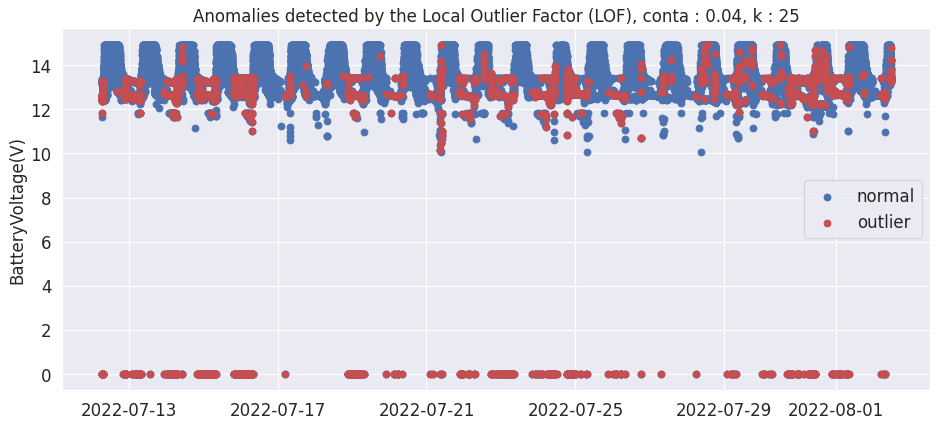

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         26                      1.89781
18                        151                     3.337017
5                          47                     2.137335
8                          55                     2.353445
664                       555                    11.483551
17                         44                     1.648558
11                         76                     5.584129
27                         60                     2.522068
14                         50                     1.977066
13                         31                     1.739618
24                         72                     1.218893
22                         24                     1.526718
16                        812                    24.080664
21                         67                     2.220749
9                          50                      1.25565
4                           5                     0.7485

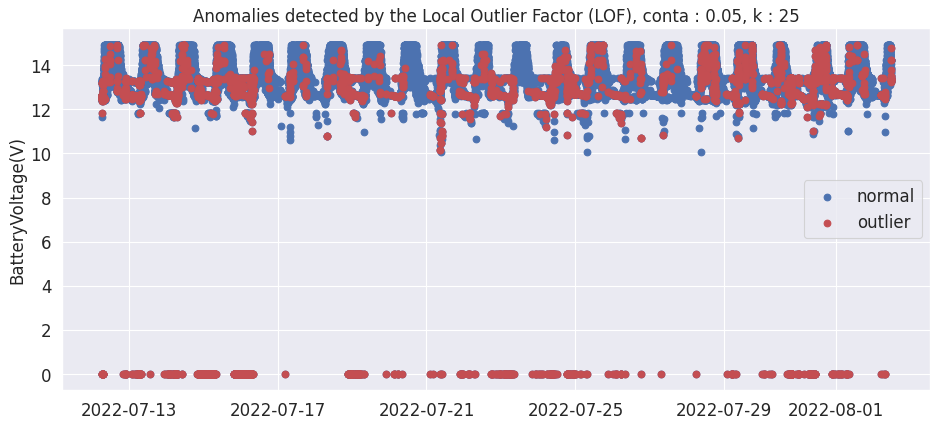

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         45                     3.284672
18                        187                     4.132597
5                          67                     3.046839
8                          82                     3.508772
664                       596                    12.331885
17                         76                     2.847508
11                         86                     6.318883
27                         87                     3.656999
14                         75                     2.965599
13                         41                     2.300786
24                        122                     2.065346
22                         42                     2.671756
16                        837                    24.822064
21                        109                      3.61286
9                          83                      2.08438
4                          13                     1.9461

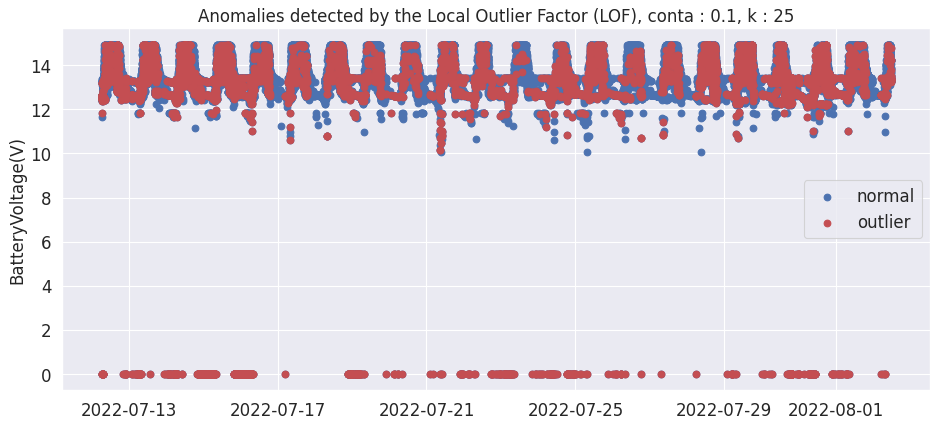

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        112                     8.175182
18                        382                     8.441989
5                         181                     8.231014
8                         231                     9.884467
664                       743                    15.373474
17                        213                     7.980517
11                        179                    13.152094
27                        210                     8.827238
14                        207                     8.185053
13                        123                     6.902357
24                        408                     6.907059
22                        147                     9.351145
16                        962                    28.529063
21                        285                      9.44647
9                         250                     6.278252
4                          42                     6.2874

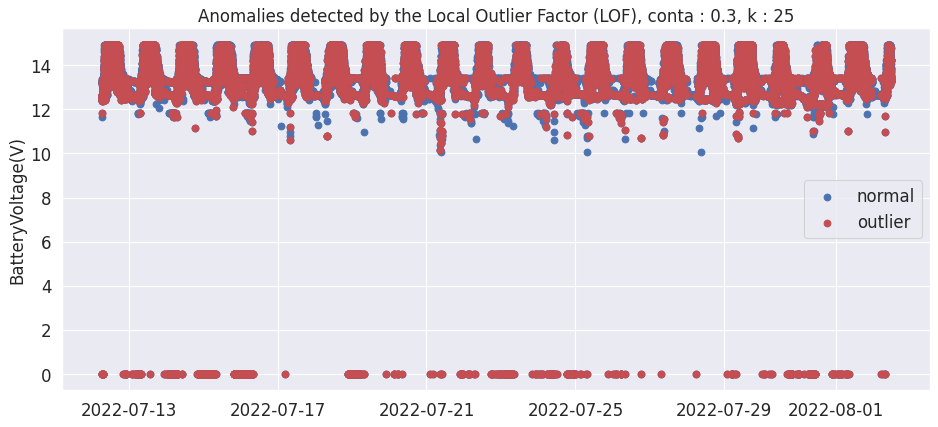

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        399                    29.124088
18                       1308                    28.906077
5                         634                    28.831287
8                         724                    30.979889
664                      1363                    28.201945
17                        747                     27.98801
11                        429                     31.52094
27                        736                    30.937369
14                        744                    29.418743
13                        494                    27.721661
24                       1564                    26.477061
22                        480                    30.534351
16                       1474                     43.71293
21                        905                    29.996685
9                        1127                    28.302361
4                         169                    25.2994

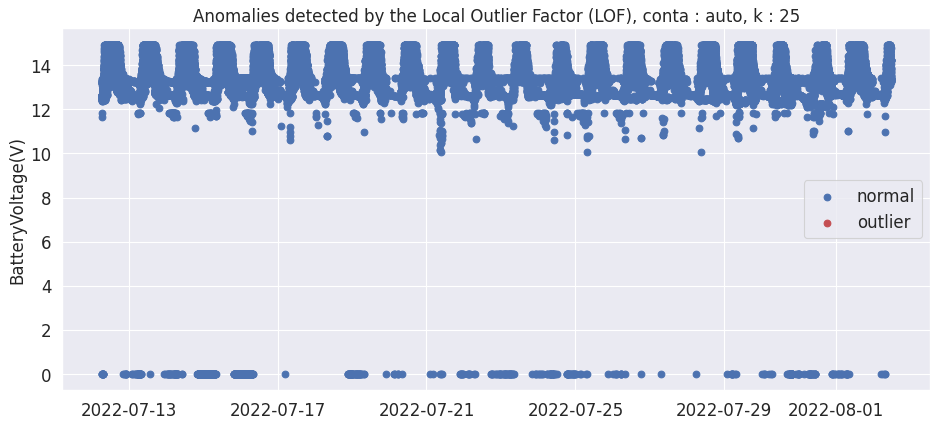

         NumberOfAnomalies_LOF  PercentageOfAnomalies_LOF(%)
15                         NaN                           NaN
18                         NaN                           NaN
5                          NaN                           NaN
8                          NaN                           NaN
664                        NaN                           NaN
17                         NaN                           NaN
11                         NaN                           NaN
27                         NaN                           NaN
14                         NaN                           NaN
13                         NaN                           NaN
24                         NaN                           NaN
22                         NaN                           NaN
16                         NaN                           NaN
21                         NaN                           NaN
9                          NaN                           NaN
4                       

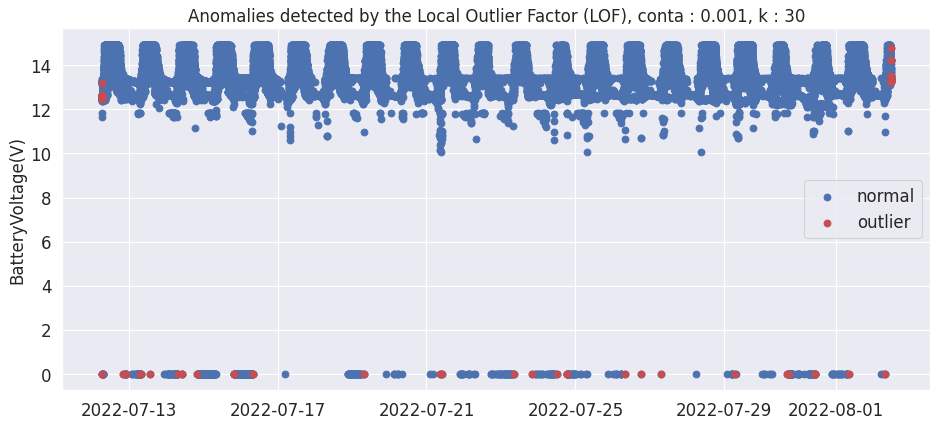

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                          8                     0.176796
5                           1                     0.045475
8                         NaN                          NaN
664                       NaN                          NaN
17                        NaN                          NaN
11                        NaN                          NaN
27                          3                     0.126103
14                          1                     0.039541
13                        NaN                          NaN
24                          3                     0.050787
22                        NaN                          NaN
16                         31                     0.919336
21                          2                     0.066291
9                         NaN                          NaN
4                         NaN                          N

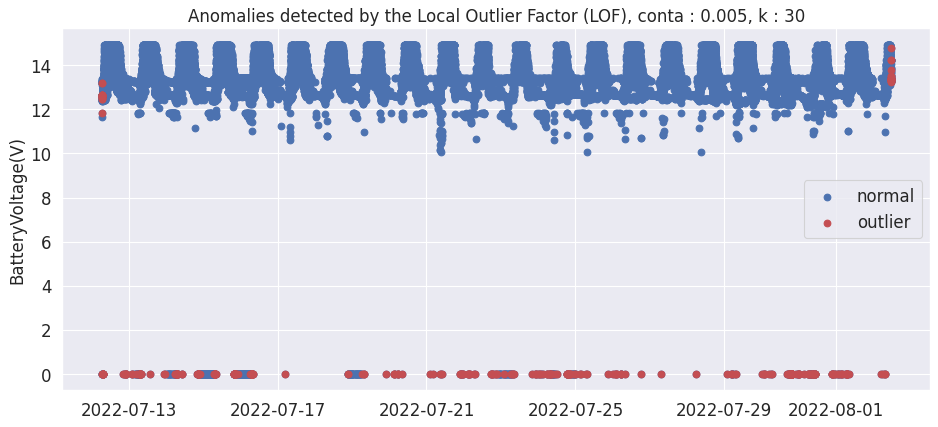

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                          9                     0.198895
5                           1                     0.045475
8                         NaN                          NaN
664                         1                     0.020691
17                        NaN                          NaN
11                        NaN                          NaN
27                          4                     0.168138
14                          1                     0.039541
13                          1                     0.056117
24                          3                     0.050787
22                        NaN                          NaN
16                        276                     8.185053
21                          2                     0.066291
9                         NaN                          NaN
4                         NaN                          N

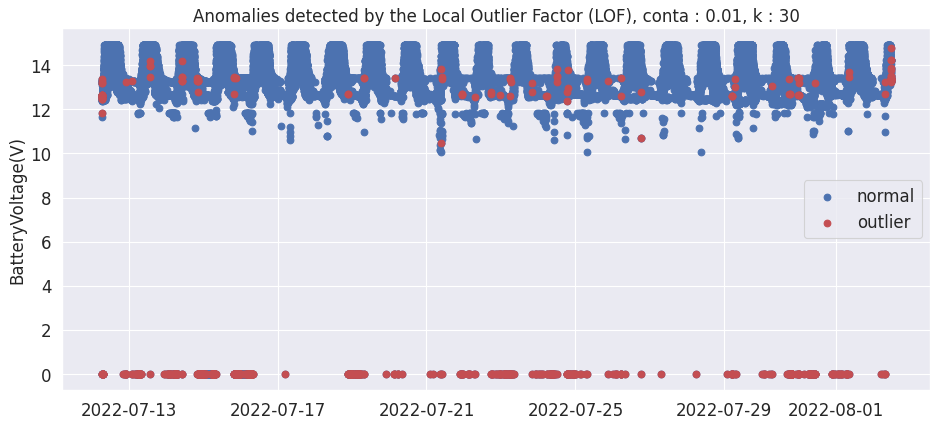

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        NaN                          NaN
18                         13                     0.287293
5                           2                      0.09095
8                         NaN                          NaN
664                        19                     0.393131
17                          2                     0.074934
11                          1                     0.073475
27                          8                     0.336276
14                          4                     0.158165
13                          1                     0.056117
24                         11                      0.18622
22                          2                     0.127226
16                        513                    15.213523
21                          3                     0.099437
9                           3                     0.075339
4                           1                     0.1497

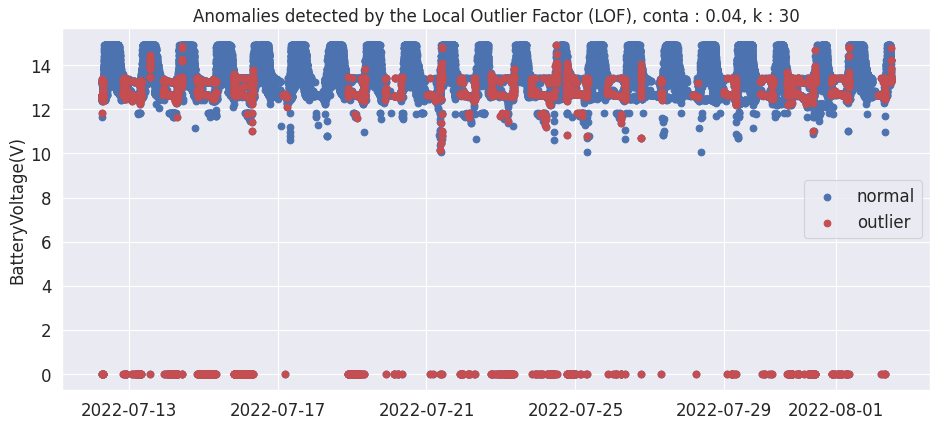

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         22                     1.605839
18                        127                      2.80663
5                          61                     2.773988
8                          49                     2.096705
664                       459                     9.497207
17                         63                     2.360435
11                         67                     4.922851
27                         76                      3.19462
14                         58                     2.293397
13                         32                     1.795735
24                        148                     2.505502
22                         31                      1.97201
16                        759                    22.508897
21                         67                     2.220749
9                          81                     2.034154
4                          13                     1.9461

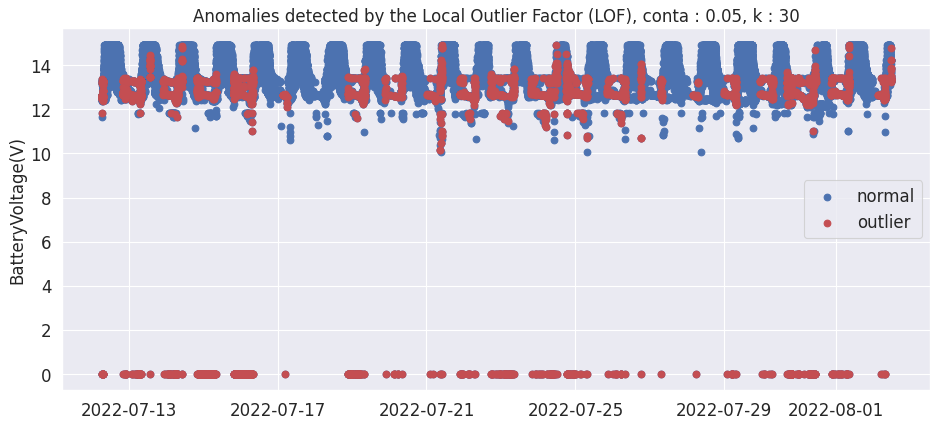

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         30                     2.189781
18                        172                     3.801105
5                          73                     3.319691
8                          75                     3.209243
664                       602                    12.456031
17                         87                     3.259648
11                         91                      6.68626
27                         99                     4.161412
14                         70                     2.767892
13                         49                     2.749719
24                        200                     3.385813
22                         43                     2.735369
16                        808                     23.96204
21                         93                     3.082532
9                         115                     2.887996
4                          22                     3.2934

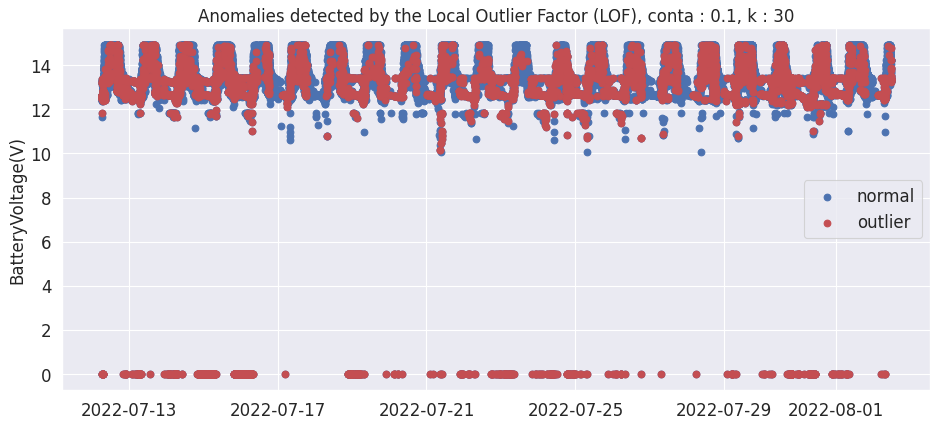

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                         83                     6.058394
18                        392                     8.662983
5                         165                     7.503411
8                         197                     8.429611
664                       943                     19.51169
17                        223                     8.355189
11                        186                    13.666422
27                        240                    10.088272
14                        199                     7.868723
13                        127                     7.126824
24                        441                     7.465719
22                        120                     7.633588
16                        958                    28.410439
21                        243                     8.054359
9                         284                     7.132094
4                          44                     6.5868

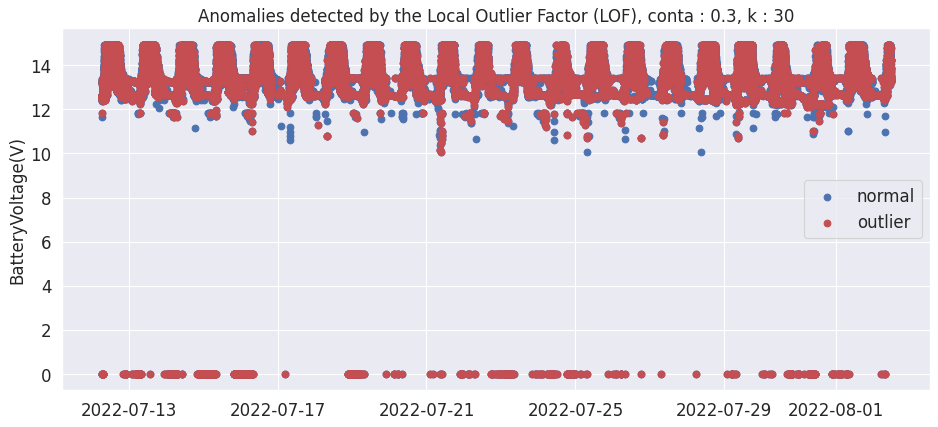

        NumberOfAnomalies_LOF PercentageOfAnomalies_LOF(%)
15                        385                     28.10219
18                       1262                    27.889503
5                         626                    28.467485
8                         682                    29.182713
664                      1527                    31.595282
17                        835                    31.285126
11                        463                    34.019104
27                        728                    30.601093
14                        768                    30.367734
13                        509                    28.563412
24                       1608                     27.22194
22                        472                    30.025445
16                       1460                    43.297746
21                        860                    28.505138
9                        1130                      28.3777
4                         174                    26.0479

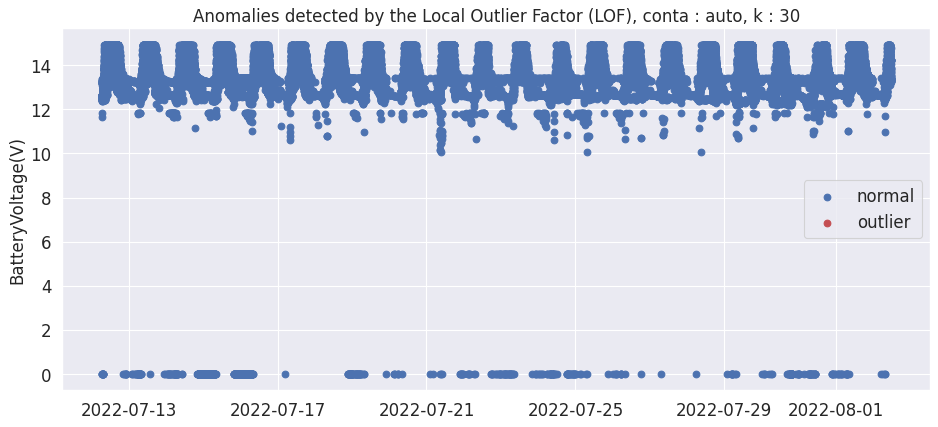

         NumberOfAnomalies_LOF  PercentageOfAnomalies_LOF(%)
15                         NaN                           NaN
18                         NaN                           NaN
5                          NaN                           NaN
8                          NaN                           NaN
664                        NaN                           NaN
17                         NaN                           NaN
11                         NaN                           NaN
27                         NaN                           NaN
14                         NaN                           NaN
13                         NaN                           NaN
24                         NaN                           NaN
22                         NaN                           NaN
16                         NaN                           NaN
21                         NaN                           NaN
9                          NaN                           NaN
4                       

In [590]:
# Hyperparameter search for contamination
from collections import defaultdict
conta_hyper_lof = [0.001,0.005,0.01,0.04,0.05,0.1,0.3,"auto"]
k_hyper_lof = [5,7,10,15,20,25,30]
dict_percentageLOF = defaultdict(list)
for k in k_hyper_lof:
    for conta in conta_hyper_lof:
        y_pred_lof, scores_lof, outlier_values_lof = localOutlier(noWeirdDateSorted, conta,k,X)    
        plot_outliers_lof(conta,y_pred_lof,X,noWeirdDateSorted,k,True,"outliersLOF/")
        eva_LOF = evaluationtable(outlier_values_lof,noWeirdDateSorted,"LOF")
        print(eva_LOF)
        for asset in noWeirdDateSorted["AssetId"].unique():
            dict_percentageLOF[asset].append(eva_LOF["PercentageOfAnomalies_LOF(%)"].loc["{}".format(asset)])
    

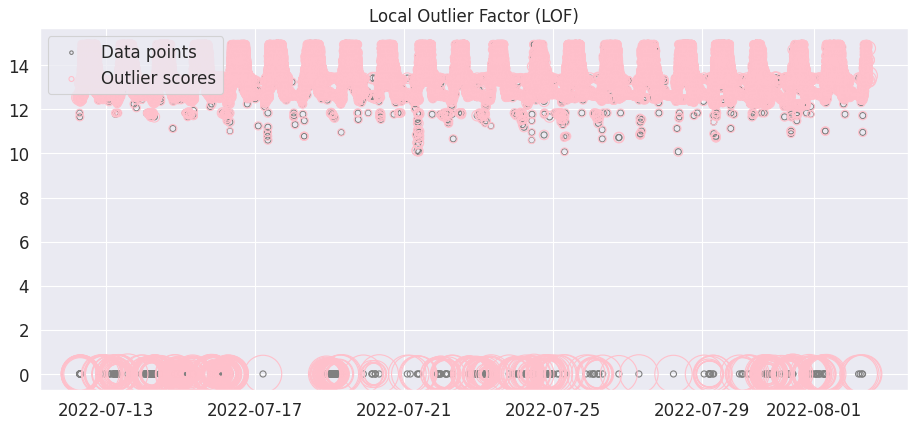

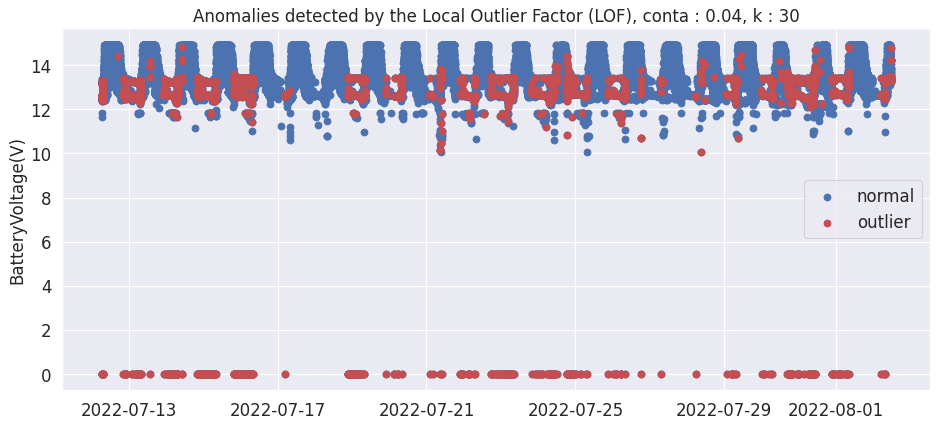

In [740]:
y_pred_lof, scores_lof, outlier_values_lof = localOutlier(noWeirdDateSorted, 0.04, 10,X)    
plot_scores(X,scores_lof,noWeirdDateSorted)
plot_outliers_lof(0.04,y_pred_lof,X,noWeirdDateSorted,k,False,"")
#y_pred_lofNoZeros,scores_lofNoZeros,outlier_values_lofNoZeros = localOutlier(noWeirdDateSortedWithoutZeros, 0.1, 50,15,X)  

### Evaluation

In [882]:
#-1 normal while
anomalyScores_LOF = anomalyScoreTable(noWeirdDateSorted,scores_lof, y_pred_lof,"LOF")
#anomalyScores_LOFNoZeros = anomalyScoreTable(noWeirdDateSortedWithoutZeros,scores_lofNoZeros, y_pred_lofNoZeros,"LOF")

In [883]:
anomalyScores_LOF

,Timestamp,AssetId,BatteryVoltage(V),AnomalyScore_LOF,Anomaly_LOF?
0,1657604242,18,12.539062,-1.158927,True
1,1657604332,10,12.539062,-1.091867,True
2,1657604374,18,12.480469,-1.058492,True
3,1657604379,10,12.480469,-1.041769,True
4,1657604438,18,12.656250,-1.041769,True
...,...,...,...,...,...
62916,1659435522,21,14.238281,-1.076947,True
62917,1659435527,20,13.300781,-1.093322,True
62918,1659435532,14,14.765625,-1.134827,True
62919,1659435541,27,13.359375,-1.179527,True


In [742]:
evaluationDF_LOF = evaluationtable(outlier_values_lof,noWeirdDateSorted,"LOF")
evaluationDF_LOF

,NumberOfAnomalies_LOF,PercentageOfAnomalies_LOF(%)
15,22,1.605839
18,111,2.453039
5,48,2.18281
8,36,1.540436
664,567,11.731844
17,45,1.686025
11,59,4.335048
27,59,2.480034
14,47,1.858442
13,29,1.627385


In [1390]:
def scaleAnomalyScore(anomalyScores_NN,anomalyScores_LOF,anomalyScores_IF):
    anomalyScores_NNcopy,anomalyScores_LOFcopy,anomalyScores_IFcopy = anomalyScores_NN.copy(deep=True),anomalyScores_LOF.copy(deep=True),anomalyScores_IF.copy(deep=True)
    scaler = MinMaxScaler()
    anomalyScores_NNcopy["AnomalyScore_NN"] = scaler.fit_transform(anomalyScores_NNcopy["AnomalyScore_NN"].to_numpy().reshape(-1, 1))
    
    anomalyScores_LOFcopy["AnomalyScore_LOF"]  =  - anomalyScores_LOFcopy["AnomalyScore_LOF"]
    scaler = MinMaxScaler()
    anomalyScores_LOFcopy["AnomalyScore_LOF"] = scaler.fit_transform(anomalyScores_LOFcopy["AnomalyScore_LOF"].to_numpy().reshape(-1, 1))
    
    scaler = MinMaxScaler()
    anomalyScores_IFcopy["AnomalyScore_IF"] = scaler.fit_transform(anomalyScores_IFcopy["AnomalyScore_IF"].to_numpy().reshape(-1, 1))
    anomalyScores_IFcopy["AnomalyScore_IF"]  = 1 - anomalyScores_IFcopy["AnomalyScore_IF"]
    return (anomalyScores_NNcopy,anomalyScores_LOFcopy,anomalyScores_IFcopy)

In [1398]:
anomalyScores_NNscaled,anomalyScores_LOFscaled,anomalyScores_IFscaled = scaleAnomalyScore(anomalyScores_NN,anomalyScores_LOF,anomalyScores_IF)

In [1399]:
anomalyScores_LOF

,Timestamp,AssetId,BatteryVoltage(V),AnomalyScore_LOF,Anomaly_LOF?
0,1657604242,18,12.539062,-1.246836,True
1,1657604332,10,12.539062,-1.230710,True
2,1657604374,18,12.480469,-1.215249,True
3,1657604379,10,12.480469,-1.200471,True
4,1657604438,18,12.656250,-1.186405,True
...,...,...,...,...,...
62917,1659435522,21,14.238281,-1.197808,True
62918,1659435527,20,13.300781,-1.212192,True
62919,1659435532,14,14.765625,-1.227244,True
62920,1659435541,27,13.359375,-1.242853,True


https://medium.com/mlpoint/local-outlier-factor-a-way-to-detect-outliers-dde335d77e1a

In [1400]:

mergePD = anomalyScores_NNscaled.merge(anomalyScores_LOFscaled, on=['Timestamp','AssetId','BatteryVoltage(V)'], how='outer')
anomalyScoresPD = mergePD.merge(anomalyScores_IFscaled, on=['Timestamp','AssetId','BatteryVoltage(V)'], how='outer')

In [1401]:
anomalyScoresPD

,Timestamp,AssetId,BatteryVoltage(V),AnomalyScore_NN,Anomaly_NN?,AnomalyScore_LOF,Anomaly_LOF?,AnomalyScore_IF,Anomaly_IF?
0,1657604242,18,12.539062,0.125563,False,0.960037,True,0.494168,False
1,1657604332,10,12.539062,0.055866,False,0.907834,True,0.494168,False
2,1657604374,18,12.480469,0.014150,False,0.857781,True,0.457875,True
3,1657604379,10,12.480469,0.000317,False,0.809944,True,0.457875,True
4,1657604438,18,12.656250,0.000481,False,0.764408,True,0.525512,False
...,...,...,...,...,...,...,...,...,...
66877,1659435522,21,14.238281,0.012214,False,0.801321,True,0.580791,False
66878,1659435527,20,13.300781,0.019017,False,0.847885,True,0.663618,False
66879,1659435532,14,14.765625,0.044648,False,0.896613,True,0.454057,True
66880,1659435541,27,13.359375,0.069212,False,0.947142,True,0.670639,False


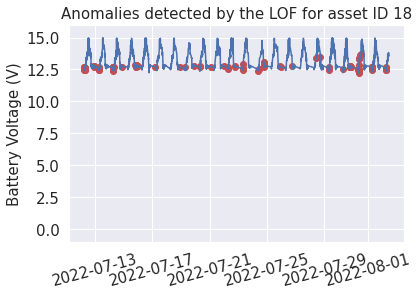

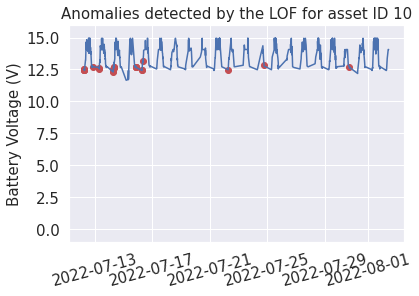

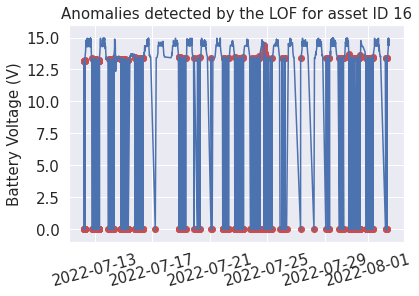

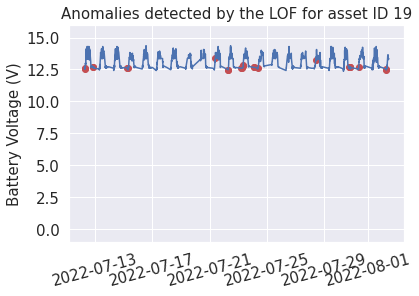

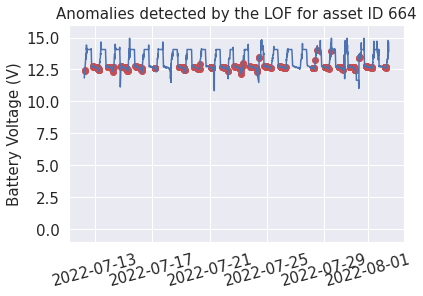

...

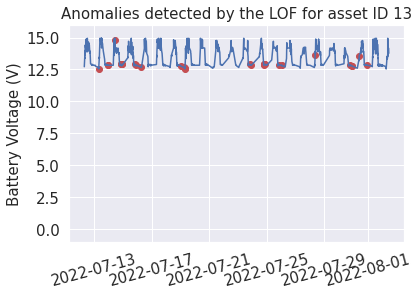

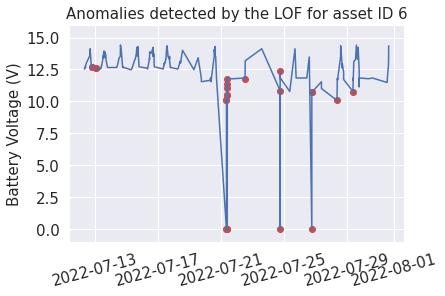

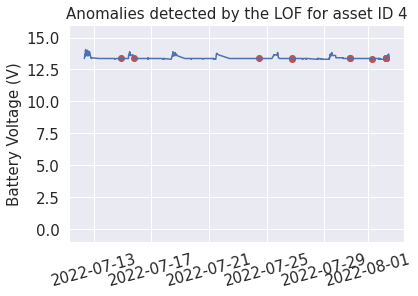

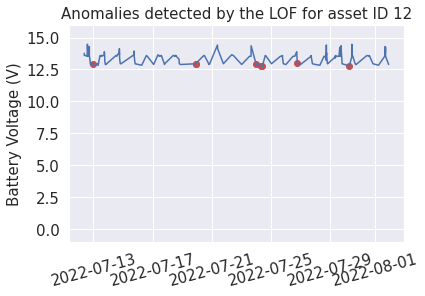

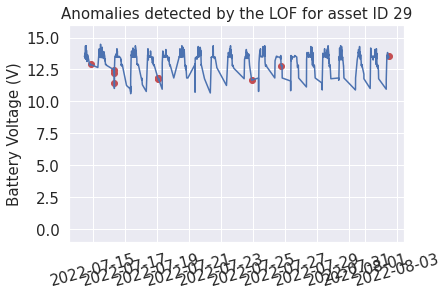

In [982]:
detected_anomalies(noWeirdDateSorted,anomalyScores_LOF,"LOF","detectedAnomalies/")

# Weather 

In [382]:
import json

In [996]:
# Read the dataset
weather = json.load(open('meteo/Jarreng_2022-07-12_to_2022-08-18.txt'))
weatherDF = pd.DataFrame(weather["days"])

In [997]:
display(weatherDF)

,datetime,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,sunrise,sunriseEpoch,sunset,sunsetEpoch,moonphase,conditions,description,icon,stations,source
0,2022-07-12,1657584000,96.2,79.6,86.9,103.6,79.6,93.3,72.5,63.6,...,06:40:19,1657608019,19:32:32,1657654352,0.49,"Rain, Partially cloudy",Partly cloudy throughout the day with early mo...,rain,"[61721099999, remote]",obs
1,2022-07-13,1657670400,98.9,78.5,86.7,112.1,78.5,93.5,73.1,65.9,...,06:40:36,1657694436,19:32:29,1657740749,0.50,"Rain, Partially cloudy",Partly cloudy throughout the day with rain.,rain,"[61721099999, remote]",obs
2,2022-07-14,1657756800,97.8,78.5,86.1,103.5,78.5,91.1,71.8,64.2,...,06:40:53,1657780853,19:32:25,1657827145,0.51,"Rain, Overcast",Cloudy skies throughout the day with early mor...,rain,"[61721099999, remote]",obs
3,2022-07-15,1657843200,97.4,79.2,86.9,102.9,79.2,92.3,72.0,63.8,...,06:41:10,1657867270,19:32:20,1657913540,0.53,"Rain, Overcast",Cloudy skies throughout the day with late afte...,rain,"[61721099999, remote]",obs
4,2022-07-16,1657929600,96.2,80.3,86.3,104.3,85.2,93.1,73.0,66.1,...,06:41:27,1657953687,19:32:15,1657999935,0.55,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"[61721099999, remote]",obs
5,2022-07-17,1658016000,99.2,77.8,86.2,107.5,77.8,89.3,69.5,60.9,...,06:41:44,1658040104,19:32:08,1658086328,0.60,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"[61733099999, remote]",obs
6,2022-07-18,1658102400,93.6,77.1,84.1,98.1,77.1,87.5,69.8,63.7,...,06:42:00,1658126520,19:32:01,1658172721,0.65,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"[61733099999, remote]",obs
7,2022-07-19,1658188800,91.3,77.4,83.7,97.6,77.4,87.5,71.6,67.9,...,06:42:17,1658212937,19:31:52,1658259112,0.70,"Rain, Partially cloudy",Partly cloudy throughout the day with rain.,rain,[remote],obs
8,2022-07-20,1658275200,91.1,76.6,82.6,97.2,76.6,85.6,72.1,72.3,...,06:42:33,1658299353,19:31:43,1658345503,0.75,"Rain, Partially cloudy",Partly cloudy throughout the day with rain.,rain,[remote],obs
9,2022-07-21,1658361600,91.1,76.0,81.5,96.9,76.0,84.4,72.8,76.5,...,06:42:49,1658385769,19:31:33,1658431893,0.80,"Rain, Overcast",Cloudy skies throughout the day with a chance ...,rain,"[61733099999, remote]",obs


In [385]:
weatherDF.columns

Index(['datetime', 'datetimeEpoch', 'tempmax', 'tempmin', 'temp',
       'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity',
       'precip', 'precipprob', 'precipcover', 'preciptype', 'snow',
       'snowdepth', 'windgust', 'windspeed', 'winddir', 'pressure',
       'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex',
       'severerisk', 'sunrise', 'sunriseEpoch', 'sunset', 'sunsetEpoch',
       'moonphase', 'conditions', 'description', 'icon', 'stations', 'source'],
      dtype='object')

## Correlation between the number of Getting water operation and the weather by day

In [387]:
def corrGettingWater(weatherDF,df):
    t = pd.DataFrame(columns=["datetime","NbGettingWater"])
    for date in df["Date"].unique():
        df_temp = df[(df["Date"]==date) & (df["Operation"]=="Getting water")]
        nbGettingwater = len(df_temp)
        dateKey = "20"+date[6:]+"-"+date[3:5]+"-"+date[:2]

        dataToAppend = {"datetime": dateKey, "NbGettingWater" : float(nbGettingwater)}
        t = t.append(dataToAppend, ignore_index=True)
        
    return t.merge(weatherDF)

In [388]:
correlationWater = corrGettingWater(weatherDF,noWeirdDate)
correlationWater.corr()

,NbGettingWater,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,pressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,sunriseEpoch,sunsetEpoch,moonphase
NbGettingWater,1.000000,-0.417000,0.570438,0.509876,0.586717,0.459646,0.461564,0.630774,-0.040950,-0.516795,...,0.046871,-0.109728,0.301592,0.442350,0.443267,0.226700,0.486719,-0.417005,-0.417020,-0.467486
datetimeEpoch,-0.417000,1.000000,-0.759803,-0.795123,-0.800365,-0.628299,-0.711093,-0.776104,0.294199,0.788412,...,0.470697,-0.081027,-0.286365,-0.187820,-0.186157,-0.223787,-0.457332,1.000000,1.000000,-0.300195
tempmax,0.570438,-0.759803,1.000000,0.723408,0.939041,0.890609,0.654267,0.910032,-0.401516,-0.931811,...,-0.390846,-0.366509,0.433073,0.596529,0.597389,0.596808,0.561182,-0.759805,-0.759811,0.151855
tempmin,0.509876,-0.795123,0.723408,1.000000,0.882283,0.585870,0.939100,0.882306,-0.006803,-0.786962,...,-0.479137,-0.221768,0.469584,0.292289,0.293402,0.118365,0.669672,-0.795124,-0.795127,0.098719
temp,0.586717,-0.800365,0.939041,0.882283,1.000000,0.806366,0.798082,0.986008,-0.265155,-0.961181,...,-0.446818,-0.330475,0.539014,0.568869,0.569779,0.455573,0.674710,-0.800367,-0.800372,0.130700
feelslikemax,0.459646,-0.628299,0.890609,0.585870,0.806366,1.000000,0.538139,0.800981,-0.216460,-0.762790,...,-0.143976,-0.287034,0.316436,0.556585,0.558298,0.454524,0.557152,-0.628300,-0.628304,0.251877
feelslikemin,0.461564,-0.711093,0.654267,0.939100,0.798082,0.538139,1.000000,0.822461,0.051133,-0.696530,...,-0.435318,-0.270566,0.434086,0.191837,0.191107,-0.015562,0.630365,-0.711094,-0.711096,0.068956
feelslike,0.630774,-0.776104,0.910032,0.882306,0.986008,0.800981,0.822461,1.000000,-0.137436,-0.915417,...,-0.379525,-0.317881,0.514275,0.537800,0.538626,0.392966,0.749928,-0.776107,-0.776113,0.099749
dew,-0.040950,0.294199,-0.401516,-0.006803,-0.265155,-0.216460,0.051133,-0.137436,1.000000,0.508420,...,0.274131,0.152749,-0.270345,-0.325619,-0.320671,-0.553592,0.369307,0.294198,0.294195,-0.055822
humidity,-0.516795,0.788412,-0.931811,-0.786962,-0.961181,-0.762790,-0.696530,-0.915417,0.508420,1.000000,...,0.481732,0.340321,-0.585197,-0.599029,-0.597913,-0.552789,-0.496258,0.788414,0.788417,-0.150857


## Correlation between the number of dispensed water liters and the weather by day

In [389]:
def corrLiterWater(weatherDF,df):
    t = pd.DataFrame(columns=["datetime","Liters"])
    for date in df["Date"].unique():
        df_temp = df[(df["Date"]==date) & (df["Liters(l)"]!=0)]
        dateKey = "20"+date[6:]+"-"+date[3:5]+"-"+date[:2]
        nbLiters = df_temp["Liters(l)"].sum()

        dataToAppend = {"datetime": dateKey, "Liters" : nbLiters}
        t = t.append(dataToAppend, ignore_index=True)
    return t.merge(weatherDF)

In [390]:
correlationLiters = corrLiterWater(weatherDF,noWeirdDate)
correlationLiters.corr()
#plt.matshow(correlationLiters.corr())

,Liters,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,pressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,sunriseEpoch,sunsetEpoch,moonphase
Liters,1.000000,-0.430093,0.571819,0.511460,0.591508,0.464267,0.441393,0.633628,-0.041257,-0.523629,...,0.039725,-0.093964,0.287031,0.412040,0.413879,0.232280,0.472742,-0.430098,-0.430113,-0.456718
datetimeEpoch,-0.430093,1.000000,-0.759803,-0.795123,-0.800365,-0.628299,-0.711093,-0.776104,0.294199,0.788412,...,0.470697,-0.081027,-0.286365,-0.187820,-0.186157,-0.223787,-0.457332,1.000000,1.000000,-0.300195
tempmax,0.571819,-0.759803,1.000000,0.723408,0.939041,0.890609,0.654267,0.910032,-0.401516,-0.931811,...,-0.390846,-0.366509,0.433073,0.596529,0.597389,0.596808,0.561182,-0.759805,-0.759811,0.151855
tempmin,0.511460,-0.795123,0.723408,1.000000,0.882283,0.585870,0.939100,0.882306,-0.006803,-0.786962,...,-0.479137,-0.221768,0.469584,0.292289,0.293402,0.118365,0.669672,-0.795124,-0.795127,0.098719
temp,0.591508,-0.800365,0.939041,0.882283,1.000000,0.806366,0.798082,0.986008,-0.265155,-0.961181,...,-0.446818,-0.330475,0.539014,0.568869,0.569779,0.455573,0.674710,-0.800367,-0.800372,0.130700
feelslikemax,0.464267,-0.628299,0.890609,0.585870,0.806366,1.000000,0.538139,0.800981,-0.216460,-0.762790,...,-0.143976,-0.287034,0.316436,0.556585,0.558298,0.454524,0.557152,-0.628300,-0.628304,0.251877
feelslikemin,0.441393,-0.711093,0.654267,0.939100,0.798082,0.538139,1.000000,0.822461,0.051133,-0.696530,...,-0.435318,-0.270566,0.434086,0.191837,0.191107,-0.015562,0.630365,-0.711094,-0.711096,0.068956
feelslike,0.633628,-0.776104,0.910032,0.882306,0.986008,0.800981,0.822461,1.000000,-0.137436,-0.915417,...,-0.379525,-0.317881,0.514275,0.537800,0.538626,0.392966,0.749928,-0.776107,-0.776113,0.099749
dew,-0.041257,0.294199,-0.401516,-0.006803,-0.265155,-0.216460,0.051133,-0.137436,1.000000,0.508420,...,0.274131,0.152749,-0.270345,-0.325619,-0.320671,-0.553592,0.369307,0.294198,0.294195,-0.055822
humidity,-0.523629,0.788412,-0.931811,-0.786962,-0.961181,-0.762790,-0.696530,-0.915417,0.508420,1.000000,...,0.481732,0.340321,-0.585197,-0.599029,-0.597913,-0.552789,-0.496258,0.788414,0.788417,-0.150857


## Correlation between the weather and the battery voltage by hour

In [998]:
# Read the dataset
weatherhour = json.load(open('meteo/Jarreng_hourly_2022-07-12_to_2022-08-18.txt'))
#weatherHourDF = pd.DataFrame(weatherhour["days"]["hours"])

In [392]:
def pandasHour(weatherhour):
    t = pd.DataFrame(columns=["date"])
    for i in range(len(weatherhour["days"])):
        day = weatherhour["days"][i]["datetime"]
        test = pd.DataFrame(weatherhour["days"][i]["hours"])
        test["date"] = day
        t = pd.concat([t, test], ignore_index=True)
    return t
weatherHourDF = pandasHour(weatherhour)

In [393]:
display(weatherHourDF)

,date,datetime,datetimeEpoch,temp,feelslike,humidity,dew,precip,precipprob,snow,...,visibility,cloudcover,solarradiation,solarenergy,uvindex,severerisk,conditions,icon,stations,source
0,2022-07-12,00:00:00,1.657584e+09,84.3,90.2,67.20,72.2,0.01,100.0,0.0,...,15.0,32.8,0.0,NaN,0.0,30.0,"Rain, Partially cloudy",rain,[remote],obs
1,2022-07-12,01:00:00,1.657588e+09,83.2,88.9,70.43,72.6,0.00,0.0,0.0,...,15.0,25.0,0.0,NaN,0.0,30.0,Partially cloudy,partly-cloudy-night,[remote],obs
2,2022-07-12,02:00:00,1.657591e+09,81.9,87.2,73.81,72.8,0.00,0.0,0.0,...,15.0,50.9,0.0,NaN,0.0,30.0,Partially cloudy,partly-cloudy-night,[remote],obs
3,2022-07-12,03:00:00,1.657595e+09,81.2,86.1,75.56,72.8,0.00,0.0,0.0,...,15.0,100.0,0.0,NaN,0.0,8.0,Overcast,cloudy,[remote],obs
4,2022-07-12,04:00:00,1.657598e+09,81.1,85.7,75.54,72.6,0.00,0.0,0.0,...,15.0,100.0,0.0,NaN,0.0,8.0,Overcast,cloudy,[remote],obs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
907,2022-08-18,19:00:00,1.660849e+09,80.4,84.6,77.19,72.6,0.00,81.0,0.0,...,15.0,100.0,163.3,0.6,2.0,10.0,"Rain, Overcast",rain,None,fcst
908,2022-08-18,20:00:00,1.660853e+09,79.4,79.4,79.33,72.4,0.00,81.0,0.0,...,15.0,100.0,84.7,0.3,0.0,10.0,"Rain, Overcast",rain,None,fcst
909,2022-08-18,21:00:00,1.660856e+09,78.3,78.3,81.53,72.2,0.01,81.0,0.0,...,15.0,100.0,6.0,0.0,0.0,10.0,"Rain, Overcast",rain,None,fcst
910,2022-08-18,22:00:00,1.660860e+09,77.3,77.3,82.80,71.7,0.00,81.0,0.0,...,15.0,99.8,4.0,0.0,0.0,10.0,"Rain, Overcast",rain,None,fcst


In [395]:
# Returns a pandas df with the average of the battery voltage value for each hour for a specific asset ID
def AverageBatteryVoltage(noWeirdDate, assetID):
    t = pd.DataFrame(columns=["Date","Hours","BatteryVoltage(V)"])
    df = noWeirdDate[noWeirdDate["AssetId"]==assetID]
    for date in df["Date"].unique():
        df_temp = df[(df["Date"]==date)][["BatteryVoltage(V)","Hours"]]
        agg = df_temp.groupby(df_temp.Hours.str[:2])["BatteryVoltage(V)"].mean().reset_index()
        agg["Date"] = date
        t = t.append(agg, ignore_index=True)
    t["Hours"] = t["Hours"]+":00:00"
    t.rename(columns = {'Date':'date', 'Hours':'datetime'}, inplace = True)
    return t

In [396]:
def changeFormatDate(t,date):
    format1 ="%d/%m/%y"
    format2 = "%Y-%m-%d"
    t[date] = t[date].apply(lambda x: datetime.strptime(x, format1).strftime(format2))
    return t

In [397]:
noWeirdDate["AssetId"].unique()
# Grosses erreurs : 11, 24, 16, 26, 6
# Assez plats : 4,28,20
# Devient plat : 23
# Bizarre : 29
#

array([ 15,  18,   5,   8, 664,  17,  11,  27,  14,  13,  24,  22,  16,
        21,   9,   4,  28,  19,  20,   3,  10,   7,  26, 144,  12,  23,
        29,   6])

In [398]:
def mergeWeatherBattery(assetID,noWeirdDate,weatherHourDF):
    # Compute the pd df that contains the battery average per hour
    averagevoltageperhour = changeFormatDate(AverageBatteryVoltage(noWeirdDate,assetID),"date")
    # Merge that df with the weather one
    mergepd = pd.merge(averagevoltageperhour, weatherHourDF, on=['date','datetime'])
    
    mergepd = mergepd.sort_values(by='datetimeEpoch')
    return mergepd


In [410]:
test = mergeWeatherBattery(4,noWeirdDate,weatherHourDF)
test.corr()

,BatteryVoltage(V),datetimeEpoch,temp,feelslike,humidity,dew,precip,precipprob,snow,snowdepth,windgust,windspeed,winddir,pressure,visibility,cloudcover,solarradiation,solarenergy,uvindex,severerisk
BatteryVoltage(V),1.000000,-0.155504,0.290141,0.287328,-0.266840,-0.073691,-0.119014,-0.082522,NaN,NaN,-0.248727,-0.091157,-0.229682,-0.055644,0.032998,0.021765,0.302964,0.290245,0.300032,0.079169
datetimeEpoch,-0.155504,1.000000,-0.528327,-0.483886,0.516394,0.243618,0.216442,0.275831,NaN,NaN,0.369786,0.137048,0.007590,0.301306,-0.226003,-0.115204,-0.053201,-0.026428,-0.058712,-0.221717
temp,0.290141,-0.528327,1.000000,0.955934,-0.953024,-0.368254,-0.290634,-0.235595,NaN,NaN,-0.322721,0.115081,0.057876,-0.642529,0.160122,0.040503,0.514245,0.496881,0.513905,0.444325
feelslike,0.287328,-0.483886,0.955934,1.000000,-0.860447,-0.127793,-0.289174,-0.215164,NaN,NaN,-0.315623,0.075085,0.087317,-0.540538,0.036094,0.010044,0.519670,0.503361,0.519205,0.525049
humidity,-0.266840,0.516394,-0.953024,-0.860447,1.000000,0.600681,0.317612,0.247912,NaN,NaN,0.309437,-0.190465,-0.003352,0.643462,-0.301678,-0.041942,-0.502515,-0.482929,-0.500744,-0.300541
dew,-0.073691,0.243618,-0.368254,-0.127793,0.600681,1.000000,0.133190,0.151164,NaN,NaN,0.118844,-0.232754,0.130145,0.405873,-0.457226,-0.053157,-0.171813,-0.155803,-0.169818,0.270737
precip,-0.119014,0.216442,-0.290634,-0.289174,0.317612,0.133190,1.000000,0.583056,NaN,NaN,0.096596,0.019961,-0.040751,0.093451,-0.478357,0.160940,-0.146076,-0.140579,-0.149609,-0.076418
precipprob,-0.082522,0.275831,-0.235595,-0.215164,0.247912,0.151164,0.583056,1.000000,NaN,NaN,-0.016033,-0.012278,0.039400,0.195984,-0.368794,0.161092,-0.078360,-0.079411,-0.080011,0.009524
snow,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
snowdepth,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,datetime,solarradiation,BatteryVoltage(V)
134,06:00:00,0.0,12.773438
135,07:00:00,1.0,12.726562
136,08:00:00,17.0,13.095703
137,09:00:00,22.0,13.554688
138,10:00:00,25.0,14.531250
139,11:00:00,71.0,14.843750
140,12:00:00,187.0,14.238281
141,13:00:00,378.0,14.121094
142,14:00:00,605.0,14.326172
143,15:00:00,705.0,14.238281


,solarradiation,BatteryVoltage(V)
solarradiation,1.000000,0.480751
BatteryVoltage(V),0.480751,1.000000


,datetime,solarradiation,BatteryVoltage(V)
62,07:00:00,3.0,12.817383
63,08:00:00,72.0,13.309152
64,09:00:00,241.0,13.734375
65,10:00:00,501.0,14.445613
66,11:00:00,719.0,14.373047
67,12:00:00,822.0,14.121094
68,13:00:00,884.0,14.648438
69,14:00:00,912.0,14.121094
70,15:00:00,867.0,14.272748
71,16:00:00,706.0,14.289551


,solarradiation,BatteryVoltage(V)
solarradiation,1.000000,0.855322
BatteryVoltage(V),0.855322,1.000000


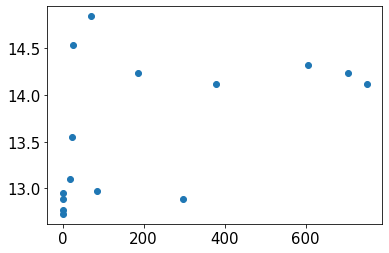

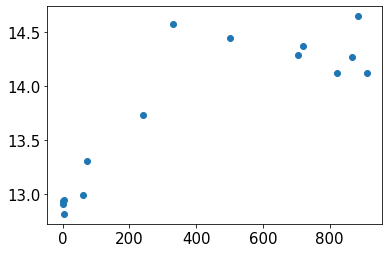

In [791]:
test = mergeWeatherBattery(15,noWeirdDate,weatherHourDF)
t = test[test["date"]=="2022-07-21"][["datetime","solarradiation","BatteryVoltage(V)"]]
d = test[test["date"]=="2022-07-12"][["datetime","solarradiation","BatteryVoltage(V)"]]
display(t,t.corr(),d,d.corr())
plt.scatter(t["solarradiation"],t["BatteryVoltage(V)"])
plt.show()
plt.scatter(d["solarradiation"],d["BatteryVoltage(V)"])
plt.show()

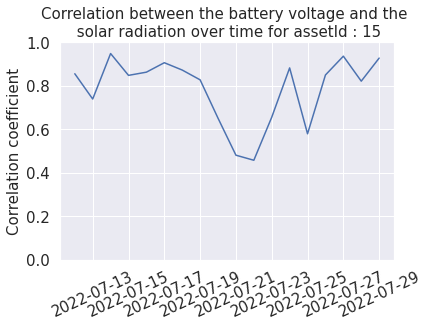

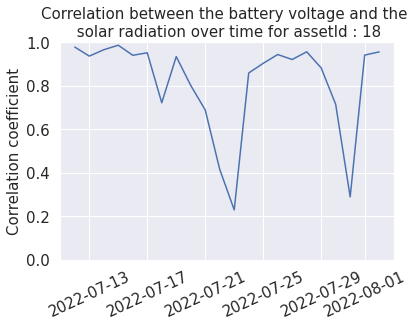

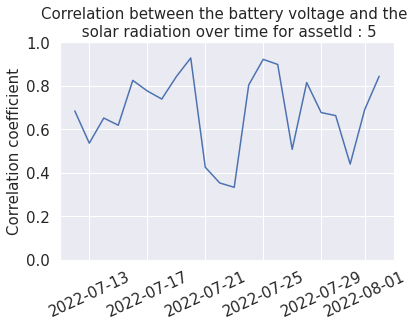

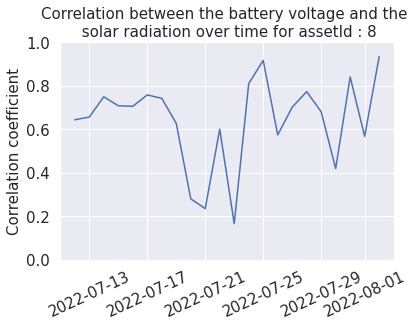

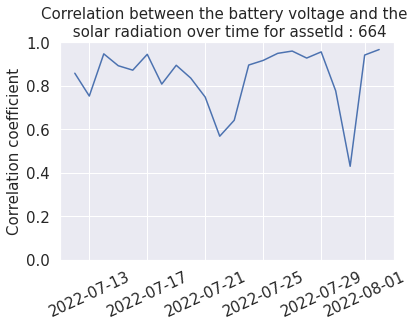

...

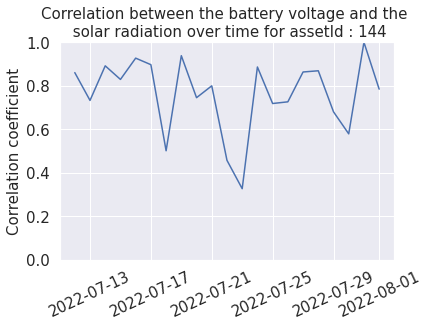

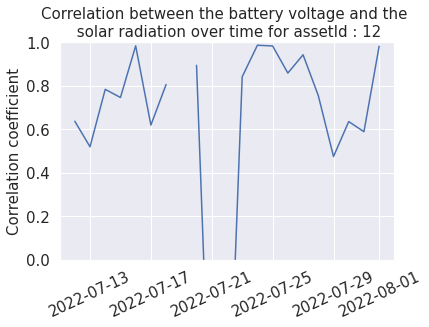

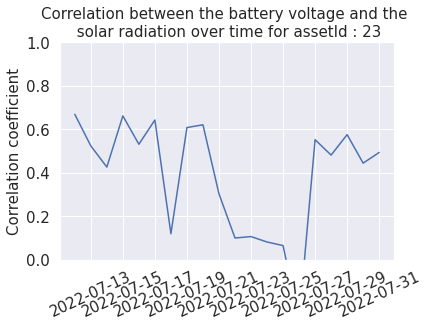

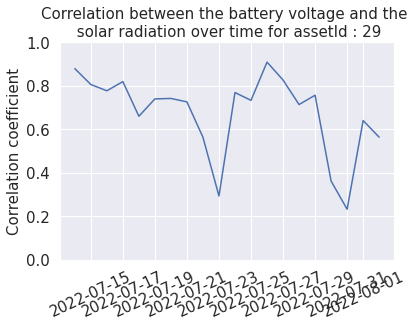

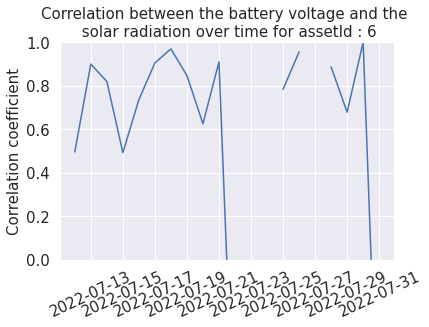

In [521]:
# For each assetID
#fig = plt.figure(figsize=(30,100))
for i,assetID in enumerate(noWeirdDate["AssetId"].unique()):
#for i,assetID in enumerate([15]):
    mergepd = mergeWeatherBattery(assetID,noWeirdDate,weatherHourDF)

    #print("AssetId:",e)
    
    dates = []
    valuesCorr = []
    # For each day do the correlation
    for date in mergepd["date"].unique():
        dates.append(date)
        correlation = mergepd[mergepd["date"]==date].corr()
        valuesCorr.append(mergepd[mergepd["date"]==date].corr().iloc[16]["BatteryVoltage(V)"])
    
    x = [dt.datetime.strptime(d,'%Y-%m-%d').date() for d in dates]
    #print(dates[9])
    fig = plt.figure()
    #ax1 =  fig.add_subplot(20,2,i+1)
    plt.plot(x, valuesCorr)
    plt.title("Correlation between the battery voltage and the \n solar radiation over time for assetId : {}".format(assetID))
    #plt.xlabel("Timestamp (s)")
    plt.ylabel("Correlation coefficient")

    # gca (Get the Current Axis) to set the y limit
    ax = plt.gca()
    ax.set_ylim([0, 1])

    xfmt = md.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_formatter(xfmt)
    plt.xticks( rotation=25 )
    
    PATH_CORR = "CorrGraphs/"
    if not os.path.exists(PATH_CORR):
        os.mkdir(PATH_CORR)
    plt.savefig(PATH_CORR + "correlation{}".format(assetID),bbox_inches="tight")  # write image to file
    
    plt.show()

In [762]:
pd.set_option('display.max_rows', None)
t = AverageBatteryVoltage(noWeirdDate, 15)
t

,date,datetime,BatteryVoltage(V)
0,19/07/22,06:00:00,12.714844
1,19/07/22,07:00:00,12.890625
2,19/07/22,08:00:00,13.154297
3,19/07/22,09:00:00,13.710938
4,19/07/22,10:00:00,14.289551
5,19/07/22,11:00:00,14.121094
6,19/07/22,12:00:00,14.472656
7,19/07/22,13:00:00,14.199219
8,19/07/22,14:00:00,14.306641
9,19/07/22,16:00:00,14.121094


## LSTM Autoencoders anomaly detection for battery voltage

In [11]:
!pip3 install tensorflow

Defaulting to user installation because normal site-packages is not writeable
--- Logging error ---
Traceback (most recent call last):
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_internal/utils/logging.py", line 177, in emit
    self.console.print(renderable, overflow="ignore", crop=False, style=style)
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_vendor/rich/console.py", line 1752, in print
    extend(render(renderable, render_options))
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_vendor/rich/console.py", line 1390, in render
    for render_output in iter_render:
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_internal/utils/logging.py", line 134, in __rich_console__
    for line in lines:
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_vendor/rich/segment.py", line 245, in split_lines
    for segment in segments:
  File "/home/drys/.local/lib/python3.8/site-packages/pip/_vendor/rich/console.py", line 1368, in render
    

In [58]:
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import joblib
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
%matplotlib inline


from numpy.random import seed
#from tensorflow import set_random_seed
import tensorflow as tf
#tf.logging.set_verbosity(tf.logging.ERROR)µ


from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers


### Preprocessing

In [219]:
# set random seed
seed(10)
tf.random.set_seed(10)

In [220]:
# Returns a pandas df with the average of the battery voltage value for each hour for a specific asset ID
def AverageBatteryVoltage(noWeirdDate, assetID):
    t = pd.DataFrame()
    df = noWeirdDate[noWeirdDate["AssetId"]==assetID]
    for date in df["Date"].unique():
        df_temp = df[(df["Date"]==date)][["BatteryVoltage(V)","Hours"]]
        agg = df_temp.groupby(df_temp.Hours.str[:4])["BatteryVoltage(V)"].mean().reset_index()
        agg["Date"] = date
        t = t.append(agg, ignore_index=True)
    t["Hours"] = t["Hours"]+"0:00"
    t.rename(columns = {'Date':'date', 'Hours':'datetime', "BatteryVoltage(V)":"{}".format(assetID)}, inplace = True)
    return t

In [221]:
AverageBatteryVoltage(noWeirdDate, 15)

,datetime,15,date
0,06:50:00,12.714844,19/07/22
1,07:40:00,12.890625,19/07/22
2,08:20:00,13.125000,19/07/22
3,08:30:00,13.183594,19/07/22
4,09:30:00,13.671875,19/07/22
...,...,...,...
571,11:10:00,14.667969,29/07/22
572,12:00:00,14.414062,29/07/22
573,13:00:00,14.941406,29/07/22
574,13:10:00,14.121094,29/07/22


In [222]:
# Create a pd dataframe with the timestamp and the value of the battery voltage for each sensor
# Fill the nan values with the mean of the column
def SensorDataframe(noWeirdDate):
    sensorDF = pd.DataFrame(columns=["date","datetime","DateTime"])
    for assetID in noWeirdDate["AssetId"].unique():
        t = AverageBatteryVoltage(noWeirdDate, assetID)
        sensorDF = pd.merge(sensorDF,t, on=["date","datetime"],how="outer")

    sensorDF["DateTime"] = sensorDF['date'] + ' ' + sensorDF['datetime']

    sensorDF = sensorDF.set_index('DateTime')
    sensorDF.index = pd.to_datetime(sensorDF.index, format = '%d/%m/%y %H:%M:%S').strftime('%Y-%m-%d %H:%M:%S')
    return sensorDF.fillna(sensorDF.mean())  


In [223]:
sensorDF = SensorDataframe(noWeirdDate)
sensorDF.drop('datetime', axis=1, inplace=True)
sensorDF.drop('date', axis=1, inplace=True)
sensorDF = sensorDF.sort_index()

In [224]:
sensorDF

,15,18,5,8,664,17,11,27,14,13,...,20,3,10,7,26,144,12,23,29,6
DateTime,,,,,,,,,,,,,,,,,,,,,
2022-07-12 06:30:00,13.768577,12.509766,13.142507,13.176981,13.153637,13.730110,13.319121,13.381555,14.022108,13.548308,...,13.299644,13.169075,12.509766,13.756977,13.680606,13.174205,13.408345,13.035562,13.192638,12.738892
2022-07-12 06:40:00,13.768577,12.636719,13.142507,13.176981,11.835938,13.730110,13.319121,13.381555,14.022108,13.548308,...,13.299644,13.169075,12.539062,13.756977,13.680606,13.174205,13.408345,13.035562,13.192638,12.738892
2022-07-12 06:50:00,13.768577,12.558594,13.142507,12.597656,13.153637,13.730110,11.660156,13.381555,14.022108,13.548308,...,13.300781,13.169075,12.465820,12.474609,13.680606,13.174205,13.408345,12.597656,13.192638,12.738892
2022-07-12 07:00:00,13.768577,12.558594,13.142507,12.597656,13.153637,13.730110,13.319121,13.242188,14.022108,13.548308,...,13.300781,13.169075,13.580217,13.756977,13.680606,13.174205,13.408345,12.597656,13.192638,12.738892
2022-07-12 07:10:00,13.768577,12.578125,12.597656,13.176981,13.153637,12.832031,13.319121,13.242188,13.320312,13.548308,...,13.300781,13.169075,13.580217,12.547433,13.680606,12.597656,13.408345,13.035562,13.192638,12.738892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-02 10:30:00,13.768577,13.491211,13.142507,13.710938,13.681641,14.135742,13.319121,13.315430,14.453125,13.548308,...,13.299644,13.710938,13.580217,13.756977,14.379883,13.174205,13.408345,13.035562,13.491211,12.738892
2022-08-02 10:40:00,13.768577,13.593750,13.142507,13.710938,14.062500,14.179688,13.319121,13.339844,14.560547,14.015625,...,13.299644,13.125000,14.062500,13.756977,14.238281,13.174205,13.408345,13.035562,13.476562,12.738892
2022-08-02 10:50:00,13.768577,13.341285,13.142507,13.615723,14.296875,14.736328,13.319121,13.359375,14.472656,14.179688,...,13.299644,13.476562,13.580217,14.179688,14.390625,13.174205,13.408345,13.035562,13.476562,12.738892


In [232]:
nonAnomalousSensors = ["15","18","5","8","17","13","14","22","21","19","7"]
anomalousSensors = ["664","11","27","4", "28","20","24","26","16","12","29","6","23","9","10","144","3"]

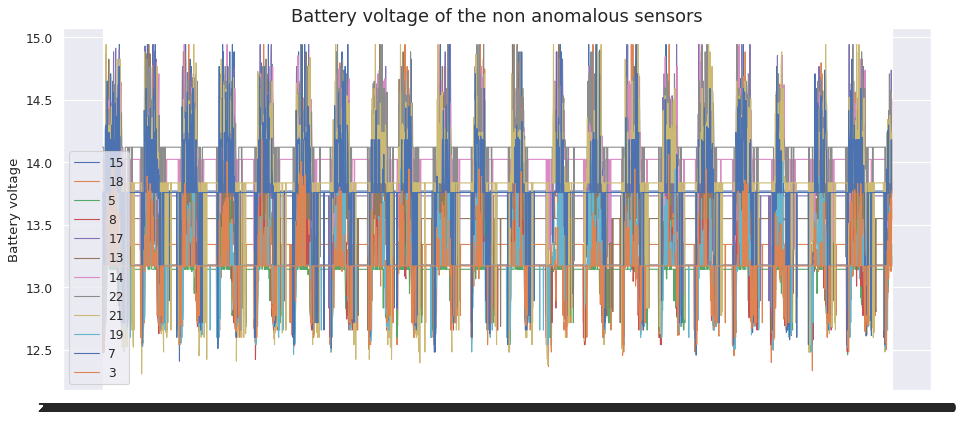

In [23]:
train = sensorDF[nonAnomalousSensors]
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
for assetId in train.columns:
    ax.plot(train['{}'.format(assetId)], label='{}'.format(assetId), animated = True, linewidth=1)
plt.legend(loc='lower left')
ax.set_title('Battery voltage of the non anomalous sensors', fontsize=16)
plt.ylabel("Battery voltage")
plt.show()



In [277]:
# Scale the data between 0 and 1
# HERE how to test on unseen sensors
def scale(train,scaler_filename):
    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(train)
    joblib.dump(scaler, scaler_filename)
    return (X_train)


In [278]:
def preprocessTrainTest(X_train,timestep):
    X_train = X_train.reshape(X_train.shape[0], timestep, X_train.shape[1])
    #X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    return(X_train)

#X_train =  preprocessTrainTest(X_train)
#print("Training data shape:", X_train.shape)
#print("Test data shape:", X_test.shape)

### Design of the ensemble of autoencoders

In [370]:
# define the autoencoder network model
def autoencoder_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))
    L1 = LSTM(200, activation='relu', return_sequences=True, kernel_regularizer=regularizers.l2(0.00))(inputs)
    L2 = Dropout(.2)(L1)   
    L3 = LSTM(100, activation='relu', return_sequences=False)(L2)
    L4 = RepeatVector(X.shape[1])(L3)
    L5 = LSTM(100, activation='relu', return_sequences=True)(L4)
    L6 = LSTM(200, activation='relu', return_sequences=True)(L5)
    L7 = Dropout(.2)(L6)   
    output = TimeDistributed(Dense(X.shape[2]))(L7)    
    model = Model(inputs=inputs, outputs=output)
    return model


In [371]:
# create the autoencoder model
def createAutoencoder(X_train):
    model = autoencoder_model(X_train)
    model.compile(optimizer='adam', loss='mae')
    #model.summary()
    return model

model = createAutoencoder(X_train)
model.summary()

Model: "model_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_33 (InputLayer)       [(None, 1, 1)]            0         
                                                                 
 lstm_128 (LSTM)             (None, 1, 200)            161600    
                                                                 
 dropout_64 (Dropout)        (None, 1, 200)            0         
                                                                 
 lstm_129 (LSTM)             (None, 100)               120400    
                                                                 
 repeat_vector_32 (RepeatVec  (None, 1, 100)           0         
 tor)                                                            
                                                                 
 lstm_130 (LSTM)             (None, 1, 100)            80400     
                                                          

In [372]:
# fit the model to the data
def fitModel(model,X_train):
    nb_epochs = 50
    batch_size = 20
    history = model.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                        validation_split=0.05).history
    return model, history
#model, history = fitModel(model,X_train)

In [373]:
PATH_STORE="autoencoders/"
PATH_STORE_MODELS = PATH_STORE + "models/"
PATH_STORE_SCALERS =  PATH_STORE + "scalers/"



In [374]:
import time

def createEnsembleAutoencoders(nonAnomalousSensors,timestep,PATH_STORE,PATH_STORE_MODELS,PATH_STORE_SCALERS):
    if not os.path.isdir(PATH_STORE):
        os.mkdir(PATH_STORE)
    if not os.path.isdir(PATH_STORE_MODELS):
        os.mkdir(PATH_STORE_MODELS)
    if not os.path.isdir(PATH_STORE_SCALERS):
        os.mkdir(PATH_STORE_SCALERS)
    
    
    dictModels ={}
    dictHistories = {}
    #dictScalers = {}
    dictX_train = {}
    
    # For all the sensors that are non anomalous
    for sensor in nonAnomalousSensors :
        # Preprocess the training set
        train = pd.DataFrame(sensorDF[sensor])
        train.rename(columns = {'{}'.format(sensor):'BatteryVoltage(V)'}, inplace = True)
        X_train =scale(train,PATH_STORE_SCALERS+"scaler_{}".format(sensor))
        X_train = preprocessTrainTest(X_train,timestep)
        
        # Create the model and train it
        model = createAutoencoder(X_train)
        model,history = fitModel(model,X_train)
        model.save(PATH_STORE_MODELS + "model_{}".format(sensor))
        
        # Store the corresponding variables
        dictX_train[sensor] = X_train
        #dictScalers[sensor] = scaler
        dictModels[sensor] = model
        dictHistories[sensor] = history
    
    store_history = open(PATH_STORE+'store_history', 'wb')
    pickle.dump(dictHistories, store_history)
    store_history.close()
    
    store_Xtrain = open(PATH_STORE+'store_Xtrain', 'wb')
    pickle.dump(dictX_train, store_Xtrain)
    store_Xtrain.close()    
    
    store_models = open(PATH_STORE+'store_models', 'wb')
    pickle.dump(dictModels, store_models)
    store_models.close()  
    return dictModels



In [375]:
nonAnomalousSensors = ["15","18","5","8","17","13","14","22","21","19","7"]
start = time.time()       
dictModels = createEnsembleAutoencoders(nonAnomalousSensors,1,PATH_STORE,PATH_STORE_MODELS,PATH_STORE_SCALERS)   
end = time.time()
print((end-start)/60, "min")

Epoch 1/50
142/142 [==============================] - 5s 11ms/step - loss: 0.1674 - val_loss: 0.0013
Epoch 2/50
142/142 [==============================] - 1s 6ms/step - loss: 0.0549 - val_loss: 0.0014
Epoch 3/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0406 - val_loss: 0.0073
Epoch 4/50
142/142 [==============================] - 1s 6ms/step - loss: 0.0376 - val_loss: 0.0030
Epoch 5/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0353 - val_loss: 0.0080
Epoch 6/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0341 - val_loss: 2.5028e-04
Epoch 7/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0323 - val_loss: 0.0125
Epoch 8/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0304 - val_loss: 0.0180
Epoch 9/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0284 - val_loss: 0.0017
Epoch 10/50
142/142 [==============================] - 1s 8ms/step - loss: 0.0265 - val_loss: 0

142/142 [==============================] - 1s 8ms/step - loss: 0.0137 - val_loss: 0.0062
Epoch 32/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0139 - val_loss: 0.0028
Epoch 33/50
142/142 [==============================] - 1s 10ms/step - loss: 0.0134 - val_loss: 0.0077
Epoch 34/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0137 - val_loss: 0.0047
Epoch 35/50
142/142 [==============================] - 1s 6ms/step - loss: 0.0135 - val_loss: 0.0023
Epoch 36/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0138 - val_loss: 0.0038
Epoch 37/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0142 - val_loss: 0.0054
Epoch 38/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0138 - val_loss: 0.0066
Epoch 39/50
142/142 [==============================] - 1s 8ms/step - loss: 0.0136 - val_loss: 0.0023
Epoch 40/50
142/142 [==============================] - 1s 8ms/step - loss: 0.0132 - val_loss: 0.0040
E

Epoch 11/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0181 - val_loss: 0.0040
Epoch 12/50
142/142 [==============================] - 1s 8ms/step - loss: 0.0181 - val_loss: 0.0039
Epoch 13/50
142/142 [==============================] - 1s 6ms/step - loss: 0.0183 - val_loss: 0.0105
Epoch 14/50
142/142 [==============================] - 1s 8ms/step - loss: 0.0180 - val_loss: 0.0084
Epoch 15/50
142/142 [==============================] - 1s 9ms/step - loss: 0.0171 - val_loss: 0.0042
Epoch 16/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0167 - val_loss: 0.0055
Epoch 17/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0171 - val_loss: 0.0098
Epoch 18/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0155 - val_loss: 0.0044
Epoch 19/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0163 - val_loss: 0.0056
Epoch 20/50
142/142 [==============================] - 1s 9ms/step - loss: 0.0165 - val_los

Epoch 21/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0156 - val_loss: 0.0144
Epoch 22/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0160 - val_loss: 0.0059
Epoch 23/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0153 - val_loss: 0.0063
Epoch 24/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0147 - val_loss: 0.0044
Epoch 25/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0140 - val_loss: 0.0069
Epoch 26/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0139 - val_loss: 0.0064
Epoch 27/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0135 - val_loss: 0.0022
Epoch 28/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0134 - val_loss: 0.0067
Epoch 29/50
142/142 [==============================] - 1s 6ms/step - loss: 0.0133 - val_loss: 0.0054
Epoch 30/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0131 - val_los

Epoch 1/50
142/142 [==============================] - 6s 10ms/step - loss: 0.2055 - val_loss: 0.0796
Epoch 2/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0610 - val_loss: 0.0302
Epoch 3/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0488 - val_loss: 0.0260
Epoch 4/50
142/142 [==============================] - 1s 8ms/step - loss: 0.0441 - val_loss: 0.0360
Epoch 5/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0409 - val_loss: 0.0083
Epoch 6/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0328 - val_loss: 0.0178
Epoch 7/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0327 - val_loss: 0.0120
Epoch 8/50
142/142 [==============================] - 1s 6ms/step - loss: 0.0312 - val_loss: 0.0092
Epoch 9/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0303 - val_loss: 0.0103
Epoch 10/50
142/142 [==============================] - 1s 7ms/step - loss: 0.0291 - val_loss: 0.007

### Loss plots

In [376]:
import pickle
# Get the dictionary of history
unpickleFile = open(PATH_STORE+"store_history", 'rb')
dictHistories = pickle.load(unpickleFile)
unpickleFile.close()

# Get the dictionnary of X_train
unpickleFile = open(PATH_STORE+"store_Xtrain", 'rb')
dictX_train = pickle.load(unpickleFile)
unpickleFile.close()

from keras import models

dictModels = {}
dictScalers = {}
for file in os.listdir(PATH_STORE_SCALERS):
    if file[-2].isdigit():
        dictScalers[file[-2:]]= joblib.load(PATH_STORE_SCALERS+file)
    else :
        dictScalers[file[-1:]]= joblib.load(PATH_STORE_SCALERS+file)

for file in os.listdir(PATH_STORE_MODELS):
    if file[-2].isdigit():
        dictModels[file[-2:]]= models.load_model(PATH_STORE_MODELS+file)
    else :
        dictModels[file[-1:]]= models.load_model(PATH_STORE_MODELS+file)

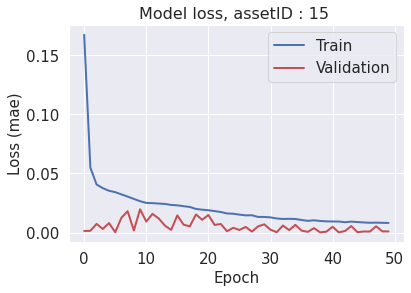

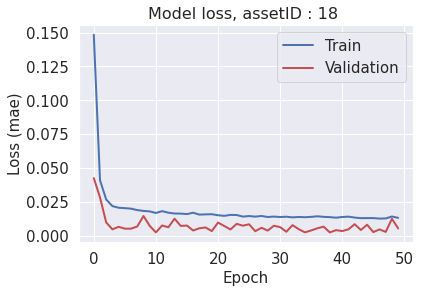

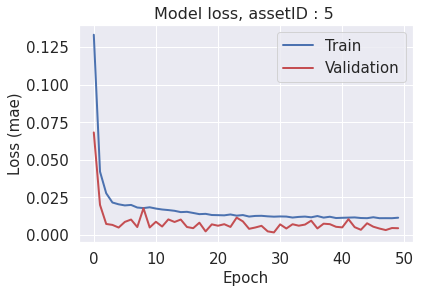

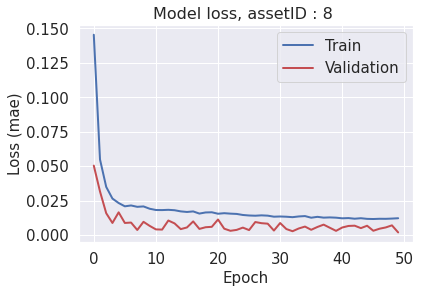

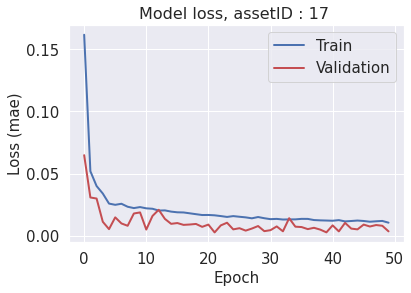

...

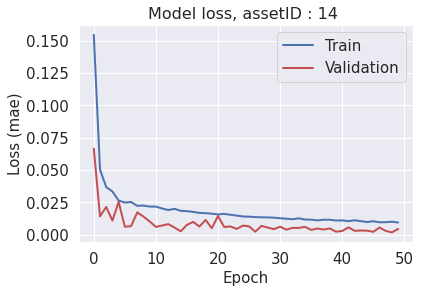

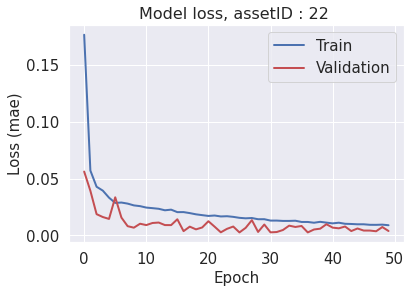

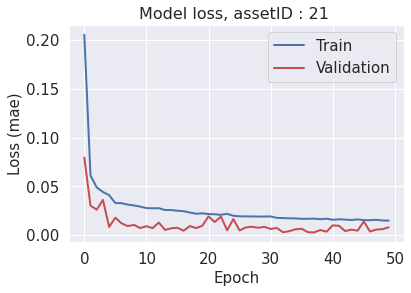

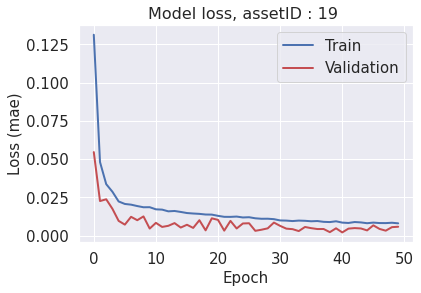

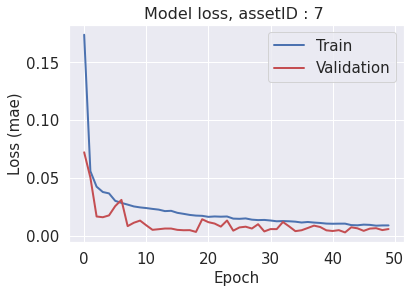

In [600]:
# plot the training losses
def plotTrainingLoss(dictHistories,PATH,save):
    #fig = plt.figure(figsize=(20,100))
    for i,sensor in enumerate(dictHistories.keys()) : 
        #fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
        #ax =  fig.add_subplot(20,2,i+1)
        fig = plt.figure()
        plt.plot(dictHistories[sensor]['loss'], 'b', label='Train', linewidth=2)
        plt.plot(dictHistories[sensor]['val_loss'], 'r', label='Validation', linewidth=2)
        plt.title('Model loss, assetID : {} '.format(sensor), fontsize=16)
        plt.ylabel('Loss (mae)')
        plt.xlabel('Epoch')
        plt.legend(loc='upper right')
        
        if save : 
            if not os.path.exists(PATH):
                os.mkdir(PATH)
            plt.savefig(PATH + "trainingloss{}".format(sensor),bbox_inches="tight")  # write image to file

    # set the spacing between subplots
    #fig.tight_layout()
    plt.show()

plotTrainingLoss(dictHistories,"trainingloss/",True)

94/94 [==============================] - 1s 2ms/step


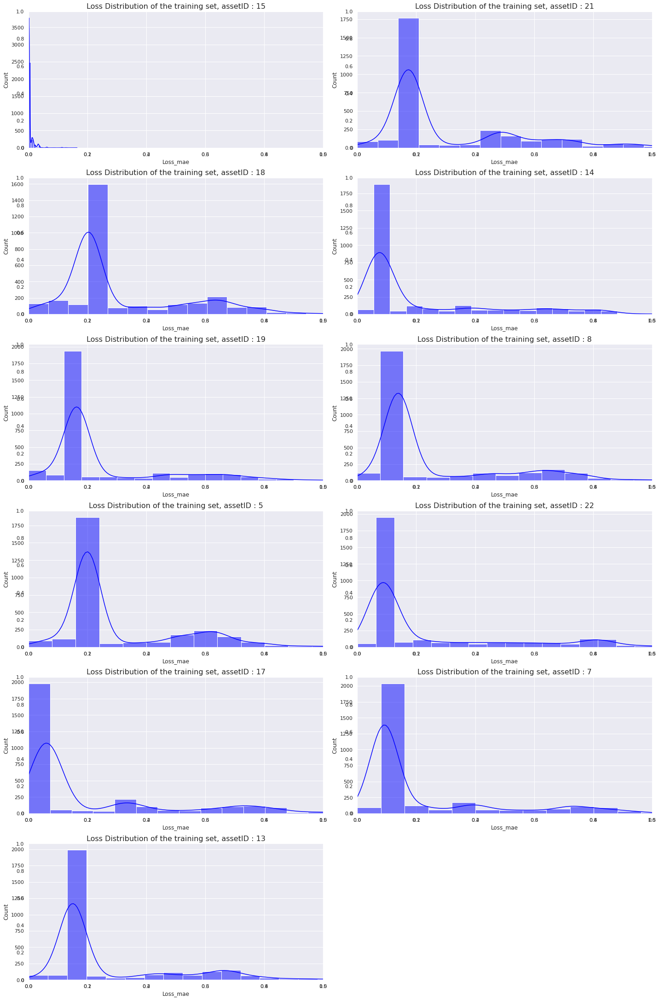

In [378]:
# Plot the loss distribution of the training set
def lossDistribution(dictX_train,dictModels,dictHistories):
    fig = plt.figure(figsize=(20,100))
    dictScoredTrain = {}
    for i,sensor in enumerate(dictModels.keys()) : 
        ax =  fig.add_subplot(20,2,i+1)
        X_pred = dictModels[sensor].predict(dictX_train[sensor])
        X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
        X_pred = pd.DataFrame(X_pred, columns=["{}".format(sensor)])
        train = pd.DataFrame(sensorDF[sensor])
        X_pred.index = train.index
        
        scored = pd.DataFrame(index=train.index)
        Xtrain = X_train.reshape(dictX_train[sensor].shape[0], dictX_train[sensor].shape[2])
        scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)
        dictScoredTrain[sensor] = scored
        
        ax =  fig.add_subplot(20,2,i+1)
        ax.set_title('Loss Distribution of the training set, assetID : {}'.format(sensor), fontsize=16)
        sns.histplot(scored['Loss_mae'], bins = 20, kde= True, color = 'blue');
        plt.xlim([0.0,.5])

    plt.tight_layout()
    plt.show()
    return dictScoredTrain
dictScoredTrain = lossDistribution(dictX_train,dictModels,dictHistories)

In [353]:
def lossTest(dictScaler,dictModels,sensorDF):
    dictScored = {}
    #variance = {}
    dictPred = {}
    dictXtest={}
    # s is the testing sensor
    for s in sensorDF.keys():
        test = pd.DataFrame(sensorDF[s])
        test.rename(columns = {'{}'.format(s):'BatteryVoltage(V)'}, inplace = True)
        scored = pd.DataFrame(index=test.index)
        dictPred[s] = {}
        dictXtest[s] = {}
        for sensor in dictScaler.keys():
            # Pre processing
            #print("sensor tested:",s, "sensor f autoencoder:",sensor)
            X_test = dictScaler[sensor].transform(test)
            #print(X_test)
            X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
            
            # Predict
            X_pred = dictModels[sensor].predict(X_test)
            
            # Post processing
            X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
            X_pred = pd.DataFrame(X_pred, columns=test.columns)
            X_pred.index = test.index

            # Compute the loss and add it in a column for each model
            Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
            
            #display(Xtest)
            #display(X_pred)
            #display(np.abs(X_pred-Xtest))
            scored['Loss_mae_{}'.format(sensor)] = np.mean(np.abs(X_pred-Xtest), axis = 1)
            dictPred[s][sensor] = X_pred
            dictXtest[s][sensor] = Xtest
            
        # Compute the mean of the mae loss and determine if something is an anomaly or not
        scored["Mean_loss_mae"] = scored.mean(axis=1)
        #variance[s] = scored["Mean_loss_mae"].var()
        #scored['Threshold'] = 0.275
        #scored['Anomaly'] = scored['Mean_loss_mae'] > scored['Threshold']
        dictScored[s] = scored

    return (dictScored,dictXtest,dictPred)

dictScored,dictXtest,dictPred = lossTest(dictScalers,dictModels, sensorDF)#anomalousSensors+nonAnomalousSensors)

94/94 [==============================] - 0s 1ms/step


In [967]:
variance ={}
mean = {}
for k in dictScored:
    variance[k] = dictScored[k]["Mean_loss_mae"].var()
    mean[k] = dictScored[k]["Mean_loss_mae"].mean()

In [969]:
variance

{'15': 0.004082846593823609,
 '18': 0.00930030107861357,
 '5': 0.0056032959061046075,
 '8': 0.005876773863309349,
 '664': 0.023947364385038326,
 '17': 0.005466059715194539,
 '11': 0.038899976941669495,
 '27': 0.000416201815268106,
 '14': 0.0010413238664663405,
 '13': 0.0044547758268639,
 '24': 0.005498010188834995,
 '22': 0.0012895354502134159,
 '16': 2.2675894493513784,
 '21': 0.010375159147204624,
 '9': 0.0004970378549022126,
 '4': 9.773215326968438e-05,
 '28': 0.00014217233566090682,
 '19': 0.005060318789075916,
 '20': 0.00017768764667902836,
 '3': 0.0032711354057149834,
 '10': 0.005896224089353007,
 '7': 0.006893847174758811,
 '26': 0.12081026663510316,
 '144': 0.0037242937009673263,
 '12': 0.00047671655705119144,
 '23': 0.008320254644504647,
 '29': 0.014363674200737244,
 '6': 0.020132440028509144}

In [971]:
for k in variance:
    if variance[k] < 0.0009:
        print(k)

27
9
4
28
20
12


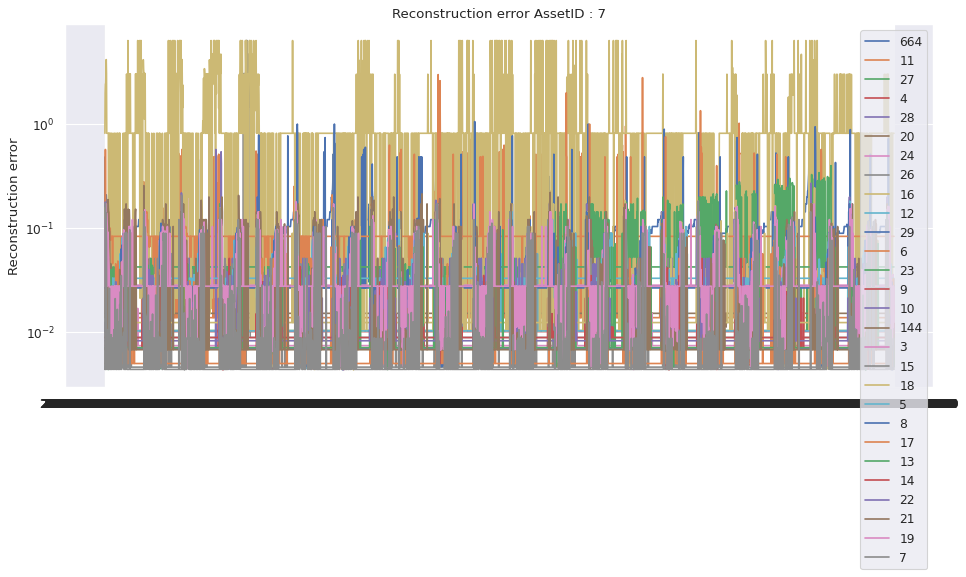

In [332]:
def reconstruction_error_samefig(dictScored,sensors,PATH):#anomalousSensors,nonAnomalousSensors):
    #fig = plt.figure(figsize=(20,100))
    #for sensor in anomalousSensors:
    if not os.path.isdir(PATH):
        os.mkdir(PATH)
    fig, ax = plt.subplots(figsize=(14, 6), dpi=80)    
    for sensor in sensors:
        results = pd.DataFrame(dictScored["{}".format(sensor)])
        results_plot = results[["Mean_loss_mae"]]
        #ax = fig.add_subplot(20,2,i+1)
        ax.semilogy(results_plot, label="{}".format(sensor))
        plt.title("Reconstruction error AssetID : {}".format(sensor))
        plt.ylabel("Reconstruction error")
        
        #plt.savefig(PATH + "anomalyScores_{}".format(sensor))  # write image to file
    plt.legend()
    plt.show()
reconstruction_error_samefig(dictScored, anomalousSensors+nonAnomalousSensors, "RecErrGraphs/")

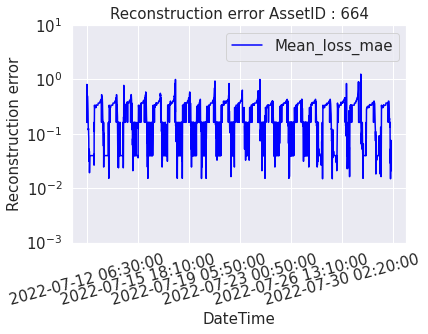

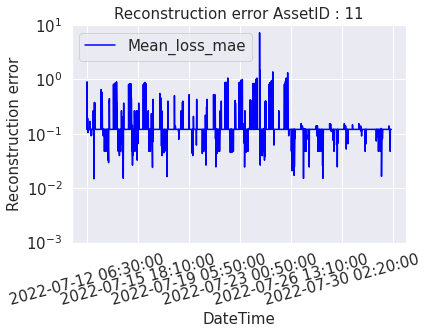

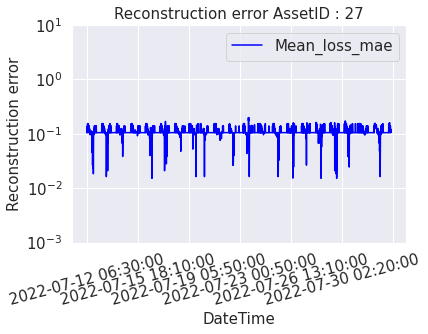

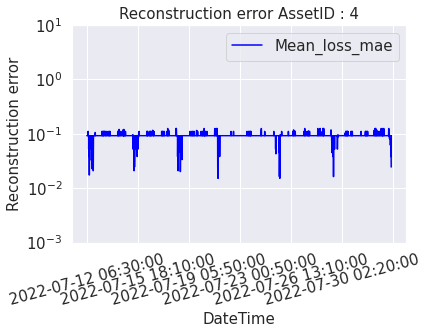

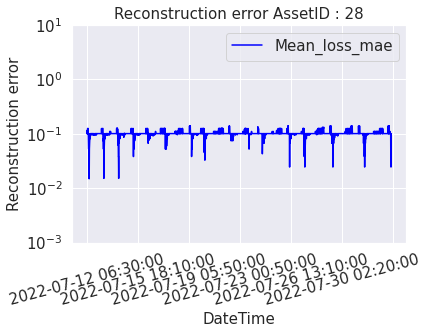

...

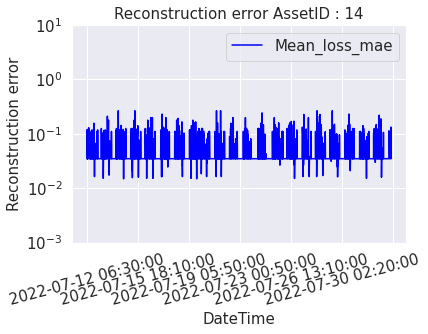

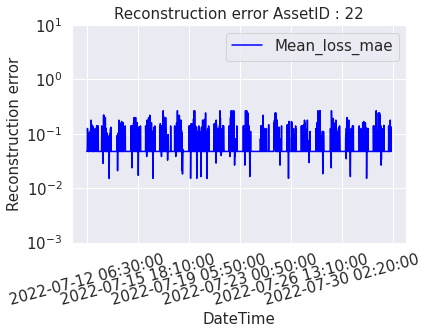

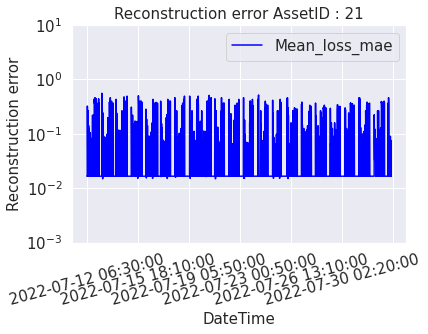

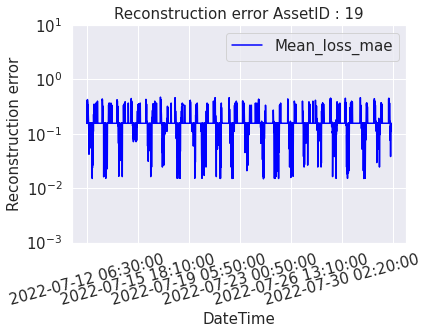

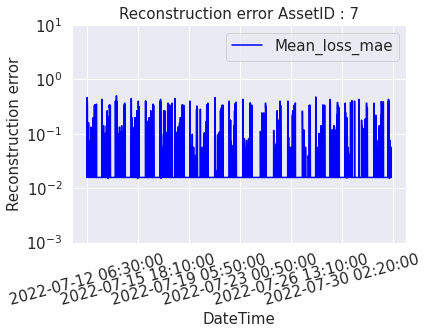

In [608]:
def reconstruction_error(dictScored,sensors,PATH):#anomalousSensors,nonAnomalousSensors):
    #fig = plt.figure(figsize=(20,100))
    #for sensor in anomalousSensors:
    if not os.path.isdir(PATH):
        os.mkdir(PATH)
        
    for sensor in sensors:
        results = pd.DataFrame(dictScored["{}".format(sensor)])
        results_plot = results[["Mean_loss_mae"]]
        #ax = fig.add_subplot(20,2,i+1)
        results_plot.plot(logy=True, ylim=[1e-3,1e1], color=['blue'])
        plt.title("Reconstruction error AssetID : {}".format(sensor))
        plt.ylabel("Reconstruction error")
        
        #xfmt = md.DateFormatter('%Y-%m-%d')
        #ax.xaxis.set_major_formatter(xfmt)
        plt.xticks( rotation=15 )
    
        
        plt.savefig(PATH + "anomalyScores_{}".format(sensor),bbox_inches="tight")  # write image to file
        
        plt.show()
reconstruction_error(dictScored, anomalousSensors+nonAnomalousSensors, "RecErrGraphs/")

### Threshold

In [666]:
# Generate the error threshold
def generate_err_threshold(quartile,dictScored):
    array = []
    for sensor in dictScored:
        array += list(dictScored[sensor]["Mean_loss_mae"])

    error_thresh = np.quantile(array, quartile)
    return error_thresh


In [677]:
import copy
def anomaly_thresh(dictScored,error_thresh):
    dictScored_ano = copy.deepcopy(dictScored)
    for sensor in dictScored_ano:
        dictScored_ano[sensor]["Threshold"] = error_thresh
        dictScored_ano[sensor]["Anomaly"] =  dictScored_ano[sensor]["Mean_loss_mae"] > error_thresh
    return dictScored_ano


### Threshold influence 

In [710]:
quartile_hyper = [0.8,0.85,0.9, 0.93,0.95,0.99]
dictQuartile = defaultdict(list)
for q in quartile_hyper :
    error_thresh = generate_err_threshold(q,dictScored)
    dictScored_ano = anomaly_thresh(dictScored,error_thresh)
    anomalyScores_ADF = anomalyScores_A(sensorDF,dictScored_ano, "autoencoder")
    eva_A = evaluationtable(anomalyScores_ADF[anomalyScores_ADF["Anomaly_autoencoder?"]==True],anomalyScores_ADF, "autoencoder")
    for sensor in dictScored_ano.keys():
        dictQuartile[sensor].append(eva_A["PercentageOfAnomalies_autoencoder(%)"].loc[sensor])

/home/drys/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/home/drys/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/home/drys/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

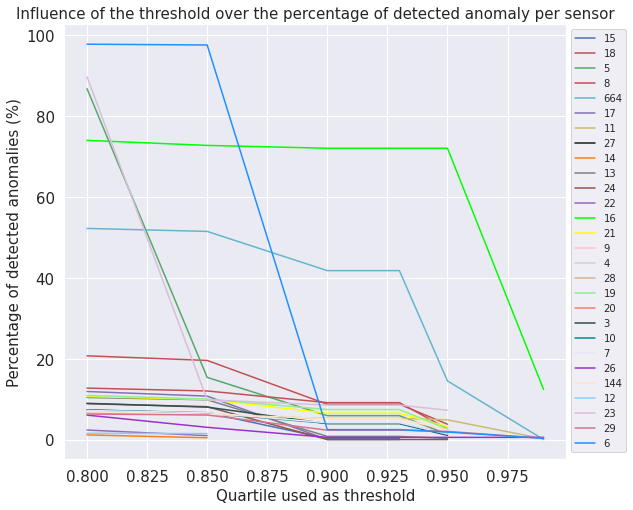

In [716]:

plt.figure(figsize=(9, 8))
for i,asset in enumerate(dictQuartile):
    plt.plot(quartile_hyper, dictQuartile[asset], label=asset, color=colors[i])
    plt.title("Influence of the threshold over the percentage of detected anomaly per sensor")
    plt.ylabel("Percentage of detected anomalies (%)")
    plt.xlabel("Quartile used as threshold")
plt.legend(bbox_to_anchor=(1,1), loc="upper left", fontsize= 10)
plt.savefig("graphs/quartile_influence",bbox_inches="tight")
plt.show()

In [959]:
error_thresh = generate_err_threshold(0.965,dictScored)
dictScored_ano = anomaly_thresh(dictScored,error_thresh)
anomalyScores_ADF = anomalyScores_A(sensorDF,dictScored_ano, "autoencoder")
eva_A = evaluationtable(anomalyScores_ADF[anomalyScores_ADF["Anomaly_autoencoder?"]==True],anomalyScores_ADF, "autoencoder")
eva_A

/home/drys/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


,NumberOfAnomalies_autoencoder,PercentageOfAnomalies_autoencoder(%)
15,NaN,NaN
18,21,0.704225
5,2,0.067069
8,3,0.100604
664,111,3.722334
17,NaN,NaN
11,119,3.99061
27,NaN,NaN
14,NaN,NaN
13,NaN,NaN


In [992]:
plt.rc('font', size=15)# Set the axes title font size
plt.rc('axes', titlesize=15)# Set the axes labels font size
plt.rc('axes', labelsize=15)# Set the font size for x tick labels
plt.rc('xtick', labelsize=15)# Set the font size for y tick labels
plt.rc('ytick', labelsize=15)# Set the legend font size
plt.rc('legend', fontsize=15)# Set the font size of the figure title
plt.rc('figure', titlesize=15)

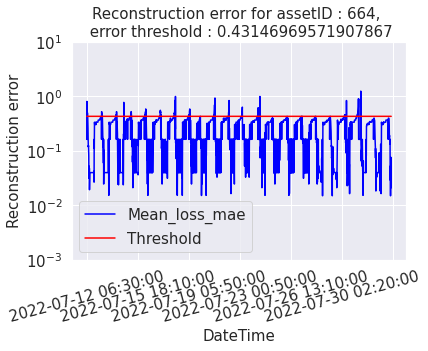

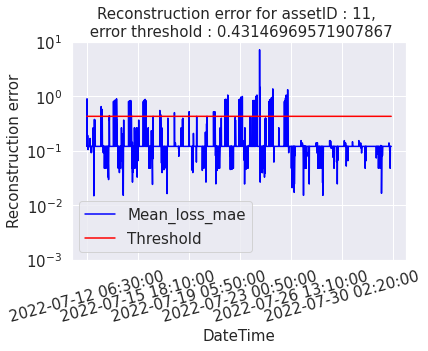

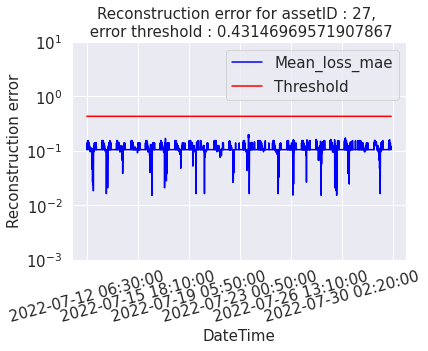

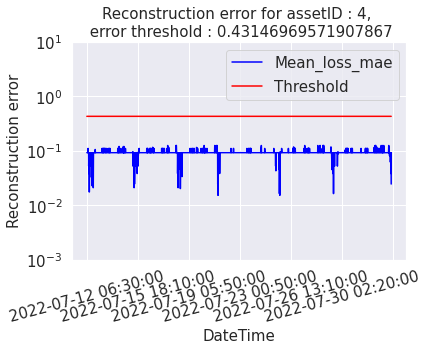

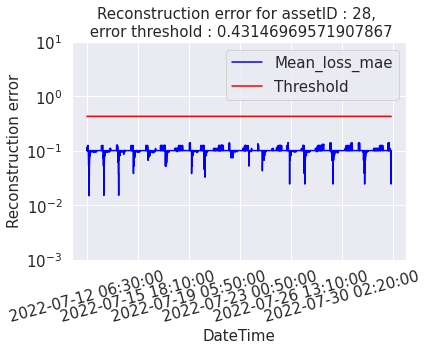

...

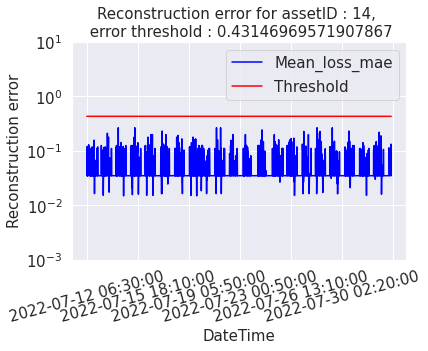

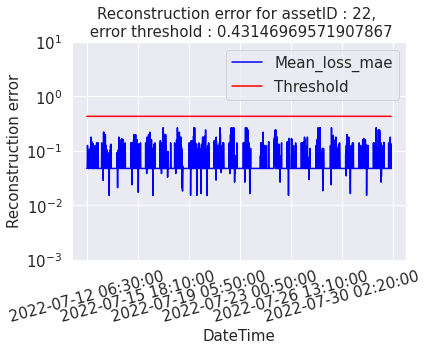

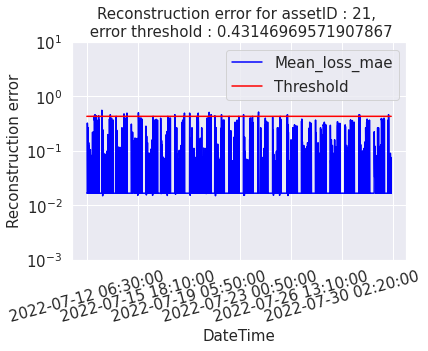

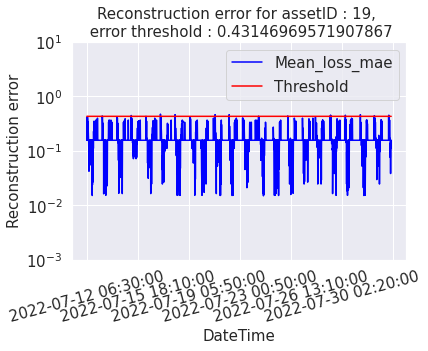

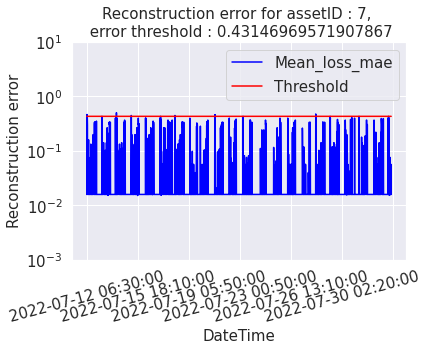

In [994]:
def printtest(dictScored,sensors,PATH):#anomalousSensors,nonAnomalousSensors):
    #fig = plt.figure(figsize=(20,100))
    #for sensor in anomalousSensors:
    
    if not os.path.isdir(PATH):
        os.mkdir(PATH)
        
    for sensor in sensors:
        results = pd.DataFrame(dictScored["{}".format(sensor)])
        results_plot = results[["Mean_loss_mae","Threshold","Anomaly"]]
        #ax = fig.add_subplot(20,2,i+1)
        results_plot.plot(logy=True, ylim=[1e-3,1e1], color=['blue','red'])
        plt.title("Reconstruction error for assetID : {}, \n error threshold : {}".format(sensor, results["Threshold"].iloc[0]))
        plt.ylabel("Reconstruction error")
        plt.xticks( rotation=15 )
        
        plt.savefig(PATH + "anomalyScores_{}".format(sensor),bbox_inches="tight")  # write image to file
        
        
        plt.show()
    
printtest(dictScored_ano, anomalousSensors+nonAnomalousSensors,"RecErrThresholdGraphs/")

### Evaluation

In [961]:
def anomalyScores_A(sensorDF,dictScored, algo):
    sensorDFcopy = copy.deepcopy(sensorDF)
    assetID = sensorDFcopy.columns
    sensorDFcopy.reset_index(inplace=True)
    sensorDFcopy["Timestamp"] = sensorDFcopy["DateTime"]
    for i in range(len(sensorDF)):
        sensorDFcopy["Timestamp"].iloc[i] = time.mktime(time.strptime('{}'.format(sensorDFcopy["DateTime"].iloc[i]), '%Y-%m-%d %H:%M:%S'))

    anomalyScores_A = pd.DataFrame(columns= ['Timestamp','AssetId','BatteryVoltage(V)','AnomalyScore_{}'.format(algo),'Anomaly_{}?'.format(algo)])
    for asset in assetID:
        data_scores = pd.DataFrame(list(zip(sensorDFcopy["Timestamp"],[asset]*len(sensorDFcopy),sensorDFcopy[asset],dictScored[asset]["Mean_loss_mae"],dictScored[asset]["Anomaly"])),columns = ['Timestamp','AssetId','BatteryVoltage(V)','AnomalyScore_{}'.format(algo),'Anomaly_{}?'.format(algo)])
        
        anomalyScores_A = anomalyScores_A.append(data_scores)
    return anomalyScores_A

In [962]:
anomalyScores_ADF = anomalyScores_A(sensorDF,dictScored_ano, "autoencoder")

/home/drys/.local/lib/python3.8/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [963]:
def evaluationtable(outlier_values,noWeirdDateSorted,algo):
    groupby = outlier_values.groupby(["AssetId"])
    evaluationDF = pd.DataFrame(columns=["NumberOfAnomalies_{}".format(algo),"PercentageOfAnomalies_{}(%)".format(algo)],index=sensorDF.columns)
    for c in groupby.groups:
        evaluationDF.loc["{}".format(c)] = [len(groupby.get_group(c)), (len(groupby.get_group(c)) * 100 )/len(noWeirdDateSorted[noWeirdDateSorted["AssetId"]==c])]
    evaluationDF.loc["Dataset"] = [len(outlier_values), (len(outlier_values) * 100 )/len(noWeirdDateSorted)]
    return evaluationDF

In [964]:
evaluationDF_A = evaluationtable(anomalyScores_ADF[anomalyScores_ADF["Anomaly_autoencoder?"]==True],anomalyScores_ADF, "autoencoder")

In [965]:
evaluationDF_A

,NumberOfAnomalies_autoencoder,PercentageOfAnomalies_autoencoder(%)
15,NaN,NaN
18,21,0.704225
5,2,0.067069
8,3,0.100604
664,111,3.722334
17,NaN,NaN
11,119,3.99061
27,NaN,NaN
14,NaN,NaN
13,NaN,NaN


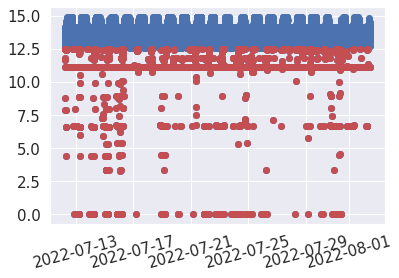

In [966]:
fig = plt.figure()
for sensor in sensorDF.columns:
    dates=[pd.to_datetime(sensorDF.index)]
    plt.scatter(dates, sensorDF[sensor].values, color='b')
    plt.xticks( rotation=15 )
anomalous = anomalyScores_ADF[(anomalyScores_ADF["Anomaly_autoencoder?"]==True)]
dates_ou=[dt.datetime.fromtimestamp(ts) for ts in list(anomalous['Timestamp'])]
plt.scatter(dates_ou, anomalous["BatteryVoltage(V)"].values, color='r')
plt.show()

In [ ]:
detected

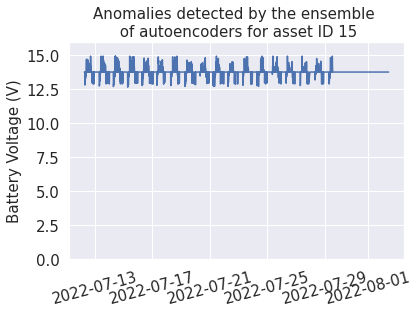

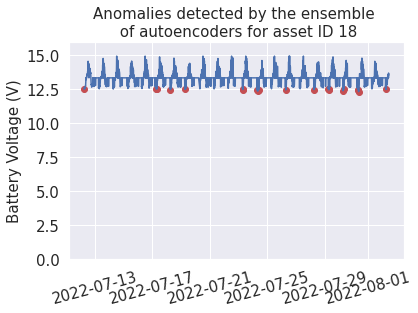

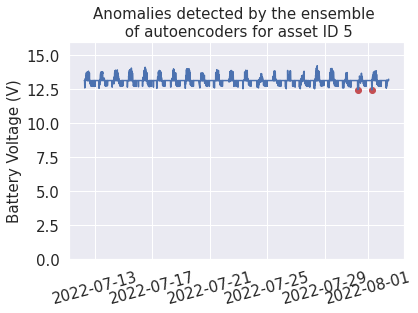

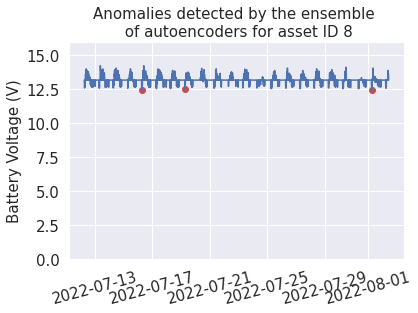

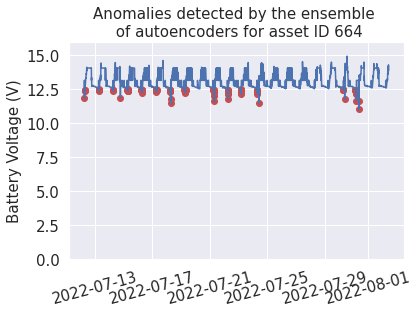

...

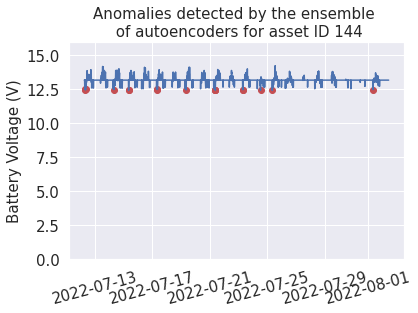

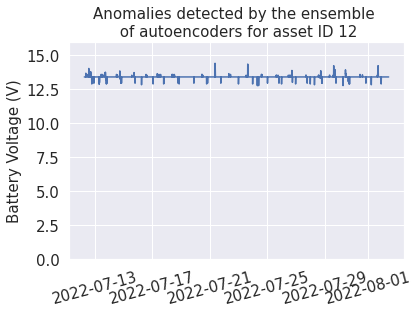

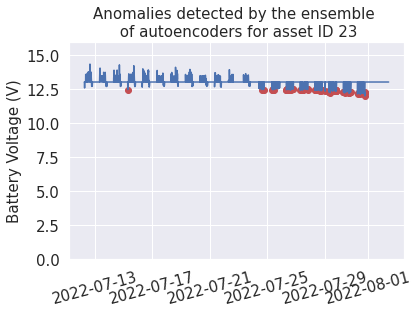

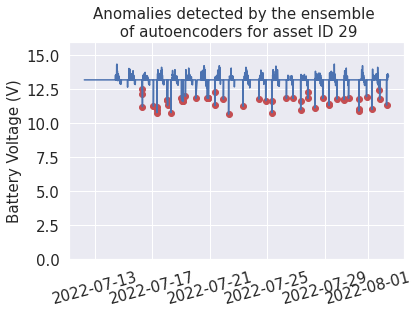

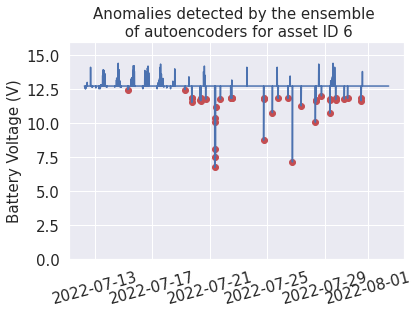

In [986]:
fig = plt.figure()
for sensor in sensorDF.columns:
    dates=pd.to_datetime(sensorDF.index)
    plt.plot(dates, sensorDF[sensor].values, color='b')
    #df_temp = noWeirdDateSorted[noWeirdDateSorted["AssetId"]==int(sensor)]
    #dates=[dt.datetime.fromtimestamp(ts) for ts in list(df_temp['Timestamp'])]
    #plt.plot(dates, df_temp["BatteryVoltage(V)"], color='b')

    plt.xticks( rotation=15 )
    anomalous = anomalyScores_ADF[(anomalyScores_ADF["AssetId"]==sensor) & (anomalyScores_ADF["Anomaly_autoencoder?"]==True)]
    dates_ou=[dt.datetime.fromtimestamp(ts) for ts in list(anomalous['Timestamp'])]
    plt.scatter(dates_ou, anomalous["BatteryVoltage(V)"].values, color='r')
    plt.title("Anomalies detected by the ensemble \n of autoencoders for asset ID {}".format(sensor))
    plt.ylabel("Battery Voltage (V)")
    plt.ylim([0,16])
    
    plt.savefig("detectedAnomalies/assetID_{}_method_auto".format(sensor),bbox_inches='tight' )
    
    plt.show()

## Comparison

In [973]:
eva_merge = evaluationDF_NN.join(evaluationDF_IF).join(evaluationDF_LOF).join(evaluationDF_A)
eva_merge = eva_merge.reindex(['15', '18', '5', '8', '17', '13', '14', '22', '21', '19', '7', 
                   '3',
                   '10', '26', '144', '664', '24', '11',
                   '23','29','6','12',
                   '16','9','27','4','28','20','Dataset'])
eva_merge

,NumberOfAnomalies_NN,PercentageOfAnomalies_NN(%),NumberOfAnomalies_IF,PercentageOfAnomalies_IF(%),NumberOfAnomalies_LOF,PercentageOfAnomalies_LOF(%),NumberOfAnomalies_autoencoder,PercentageOfAnomalies_autoencoder(%)
15,4,0.291971,38,2.773723,22,1.605839,NaN,NaN
18,6,0.132597,104,2.298343,111,2.453039,21,0.704225
5,5,0.227376,10,0.454752,48,2.18281,2,0.067069
8,1,0.04279,12,0.513479,36,1.540436,3,0.100604
17,3,0.112402,125,4.683402,45,1.686025,NaN,NaN
13,1,0.056117,59,3.310887,29,1.627385,NaN,NaN
14,2,0.079083,124,4.903124,47,1.858442,NaN,NaN
22,5,0.318066,63,4.007634,31,1.97201,NaN,NaN
21,5,0.165728,106,3.513424,63,2.088167,33,1.10664
19,3,0.129758,27,1.16782,24,1.038062,19,0.637156


In [974]:
final_table = eva_merge[["PercentageOfAnomalies_NN(%)","PercentageOfAnomalies_IF(%)","PercentageOfAnomalies_LOF(%)","PercentageOfAnomalies_autoencoder(%)"]]
final_table


,PercentageOfAnomalies_NN(%),PercentageOfAnomalies_IF(%),PercentageOfAnomalies_LOF(%),PercentageOfAnomalies_autoencoder(%)
15,0.291971,2.773723,1.605839,NaN
18,0.132597,2.298343,2.453039,0.704225
5,0.227376,0.454752,2.18281,0.067069
8,0.04279,0.513479,1.540436,0.100604
17,0.112402,4.683402,1.686025,NaN
13,0.056117,3.310887,1.627385,NaN
14,0.079083,4.903124,1.858442,NaN
22,0.318066,4.007634,1.97201,NaN
21,0.165728,3.513424,2.088167,1.10664
19,0.129758,1.16782,1.038062,0.637156


In [976]:
import dataframe_image as dfi
PATH = "graphs/"
dfi.export(final_table, PATH + "percentage_table.png")